## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'spaceNet-full' 
TRANSFORM = 'gabor'
CHANNEL = 'blue'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
blue_gabor_full_spaceNet.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'/Users/brandonmarks/Desktop/hierarchical-bayesian-model-validation/results/case-studies/spaceNet/full/gabor/blue'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 160000000,
 1: 160000000,
 2: 160000000,
 3: 160000000,
 4: 160000000,
 5: 160000000,
 6: 160000000,
 7: 160000000,
 8: 160000000,
 9: 160000000,
 10: 160000000,
 11: 160000000,
 12: 160000000,
 13: 160000000,
 14: 160000000,
 15: 160000000,
 16: 160000000,
 17: 160000000,
 18: 160000000,
 19: 160000000,
 20: 160000000,
 21: 160000000,
 22: 160000000,
 23: 160000000,
 24: 160000000,
 25: 160000000,
 26: 160000000,
 27: 160000000,
 28: 160000000,
 29: 160000000,
 30: 160000000,
 31: 160000000,
 32: 160000000,
 33: 160000000,
 34: 160000000,
 35: 160000000,
 36: 160000000,
 37: 160000000,
 38: 160000000,
 39: 160000000,
 40: 160000000,
 41: 160000000}

Running 12760 CDFs


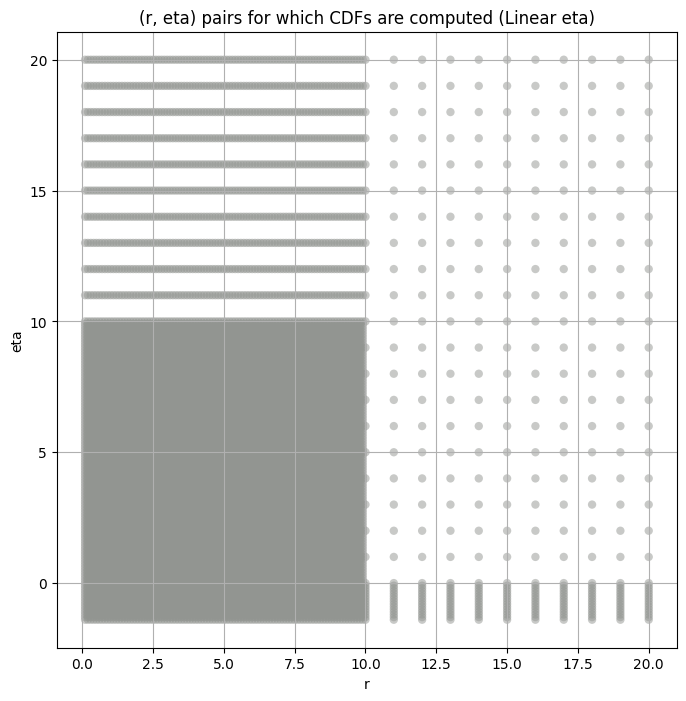

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,104.751920,79.171340,144.730820,9.756392,3.355390,53.305700,160000000.0,"(2.0, 0.5, 0.044)"
1,44.688686,33.397083,65.193830,15.381451,3.886639,124.987910,160000000.0,"(2.0, 0.5, 0.065)"
2,19.629204,14.301214,29.159916,20.022379,4.770294,139.852800,160000000.0,"(2.0, 0.5, 0.096)"
3,7.416366,5.222577,13.065188,27.643420,5.379395,179.515410,160000000.0,"(2.0, 0.5, 0.141)"
4,3.177796,2.139311,6.415463,37.375984,6.484847,279.421500,160000000.0,"(2.0, 0.5, 0.208)"
5,0.918258,0.597128,2.031347,53.133640,5.832935,328.755520,160000000.0,"(2.0, 0.5, 0.306)"
6,0.581501,0.391970,1.477699,61.547700,5.796725,374.792420,160000000.0,"(2.0, 0.5, 0.45)"
7,135.913770,104.683360,182.711210,10.395148,3.562033,62.887478,160000000.0,"(2.0, 1.0, 0.044)"
8,58.516690,43.111374,92.271360,16.282785,3.872179,119.732285,160000000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,104.751920,104.751923,98.207916,94.756584,89.694939
1,44.688686,44.688686,41.240204,39.563732,37.173901
2,19.629204,19.629204,17.863811,17.034042,15.865404
3,7.416366,7.416366,6.659602,6.321945,5.855699
4,3.177796,3.177796,2.810753,2.655163,2.443444
5,0.918258,0.918258,0.797863,0.750754,0.687860
6,0.581501,0.581501,0.506572,0.478629,0.441007
7,135.913770,135.913773,127.080559,122.512726,115.895042
8,58.516690,58.516689,53.746346,51.521523,48.380646


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.010162653317650816 104.75192


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.010421195169491249 98.20792


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.009914484738868412 94.756584


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.01066124622924694 89.69494
Number of samples: 100000, Without approximation : 160000000.0


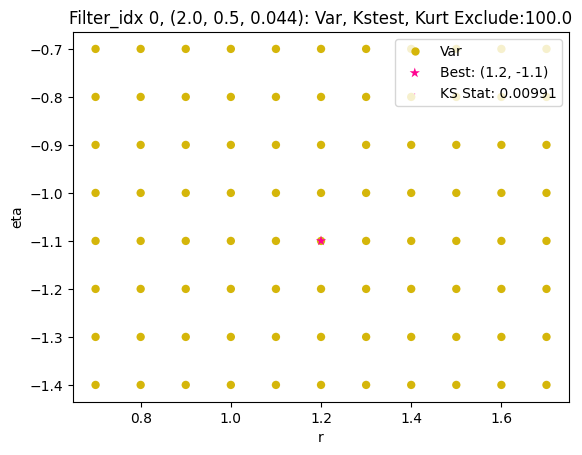

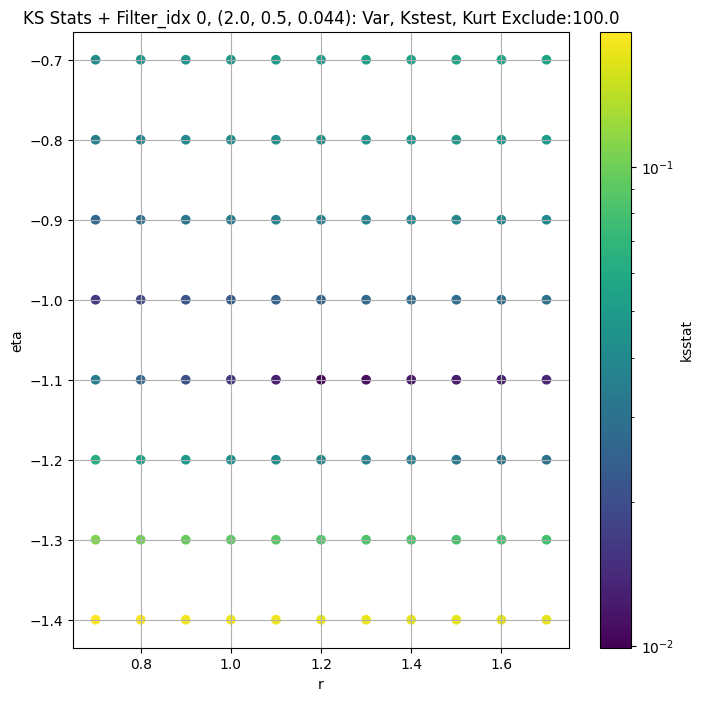

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.00925316500999862 44.688686


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.008890418323515947 41.240204


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.00913017762498236 39.563732


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.009488712887313122 37.1739
Number of samples: 100000, Without approximation : 160000000.0


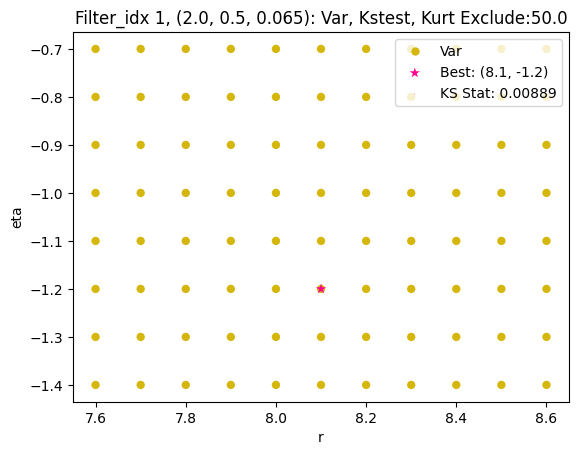

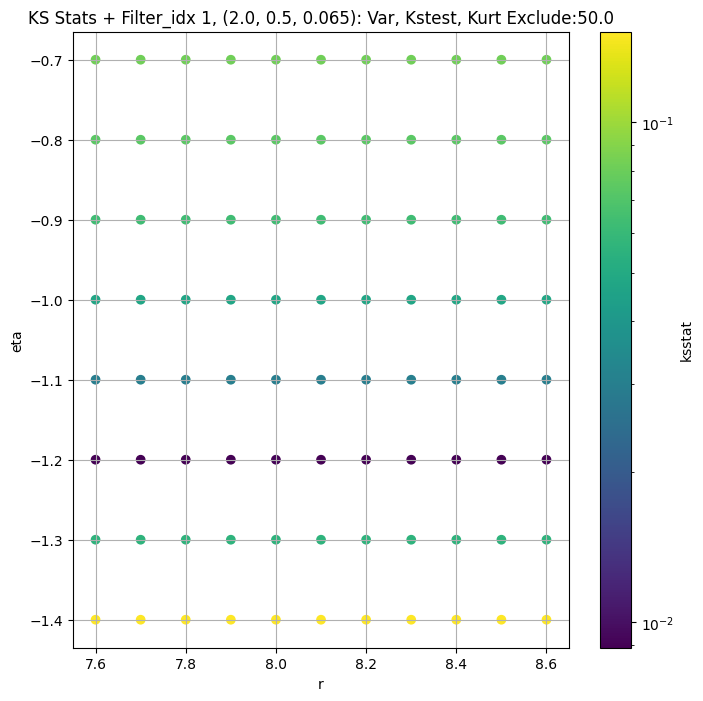

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.010487972113906951 19.629204


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.010069576623351006 17.863811


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.00984424017043406 17.034042


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.009700436660574352 15.865404
Number of samples: 100000, Without approximation : 160000000.0


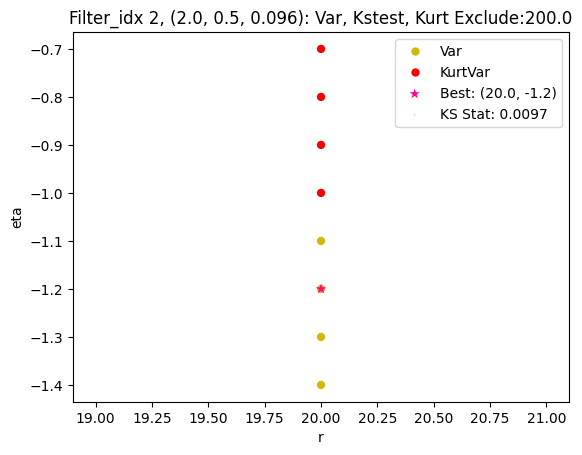

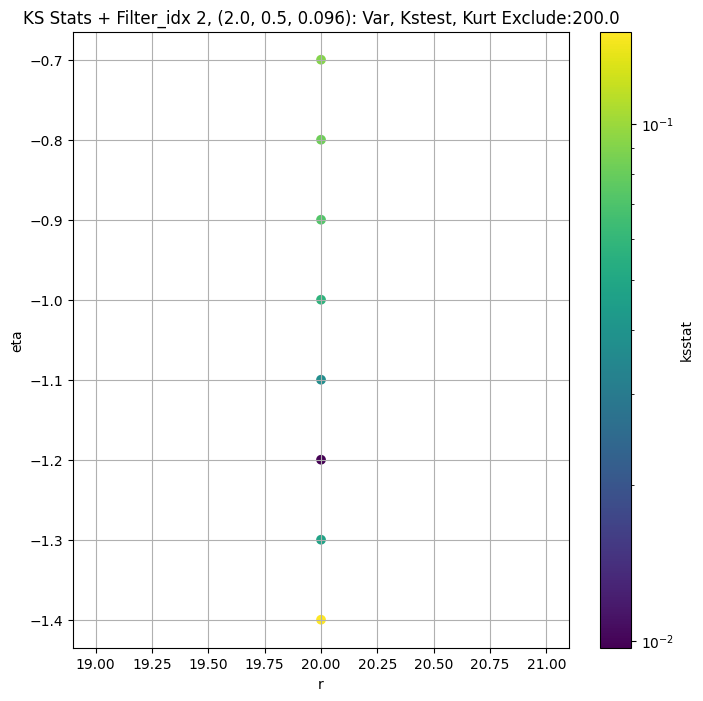

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.009582523858801262 7.4163656


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.008278094580231765 6.659602


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.011507893872626462 6.3219447


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.00880982112395401 5.855699
Number of samples: 100000, Without approximation : 160000000.0


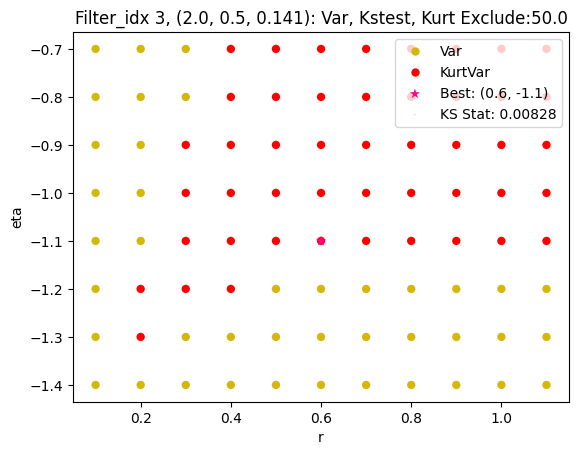

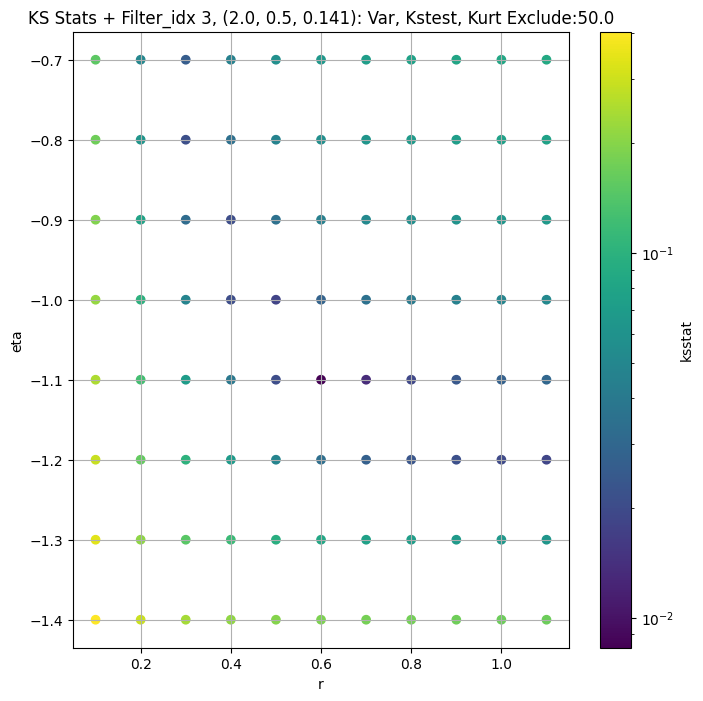

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.00804182273445897 3.1777956


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.00792903459640426 2.8107529


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.00854212406788124 2.6551628


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.010373975267630897 2.443444
Number of samples: 100000, Without approximation : 160000000.0


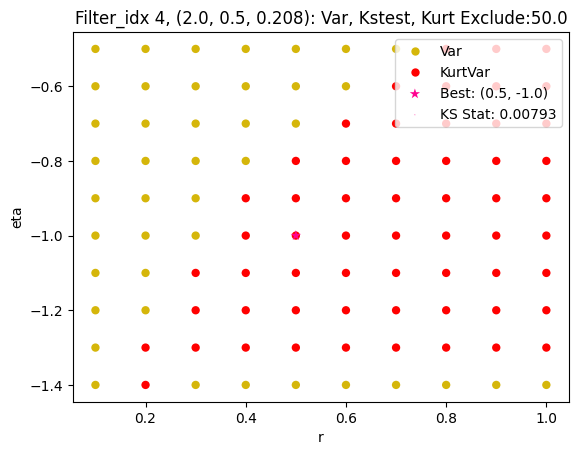

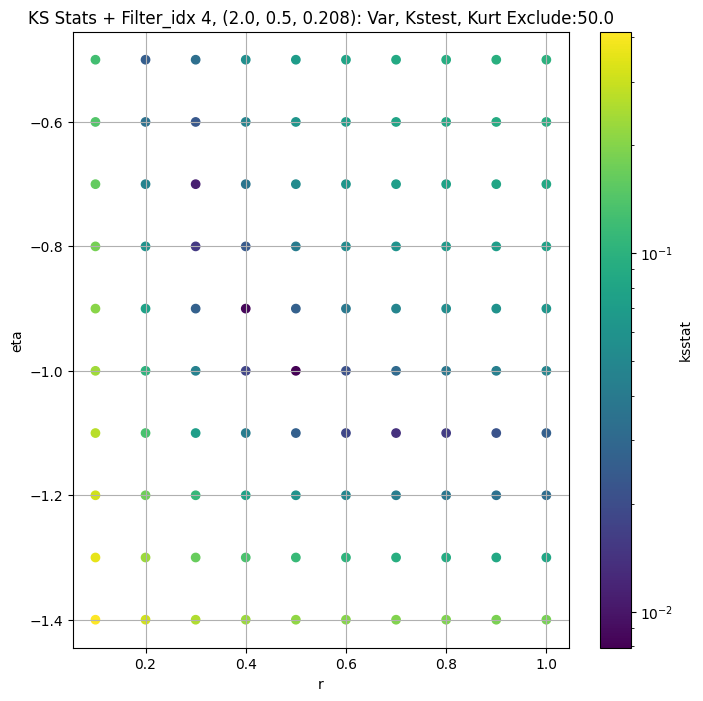

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.00447227727791033 0.9182585


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.005091571675359452 0.7978632


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.006121067861996621 0.7507537


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.0067849921120373136 0.6878599
Number of samples: 100000, Without approximation : 160000000.0


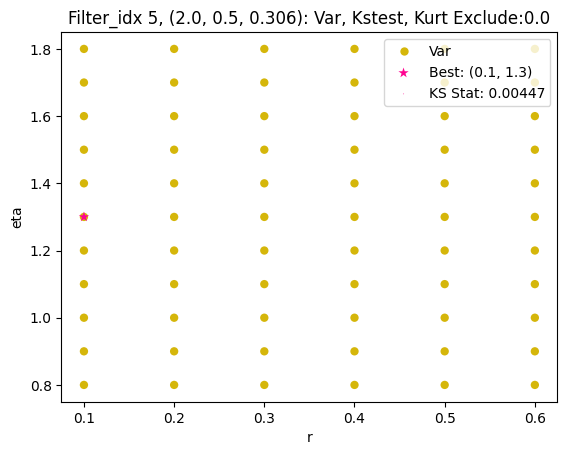

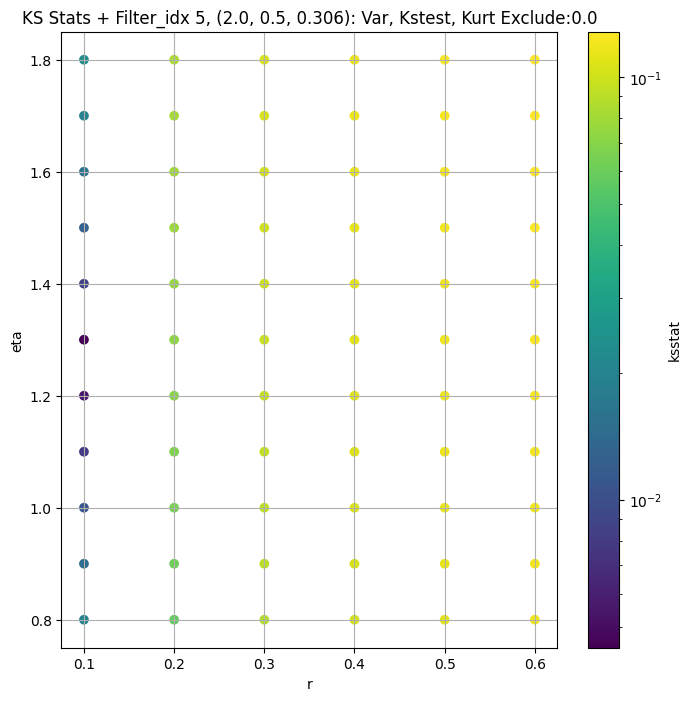

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.0028241230470426038 0.5815013


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.003804095196042953 0.5065717


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.0035053047179502417 0.4786287


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.005478197825526859 0.44100723
Number of samples: 100000, Without approximation : 160000000.0


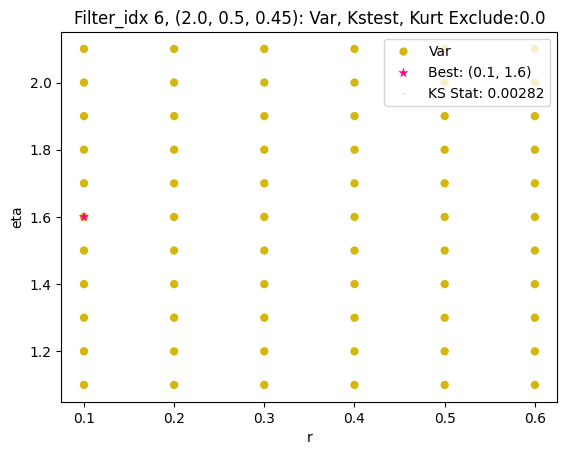

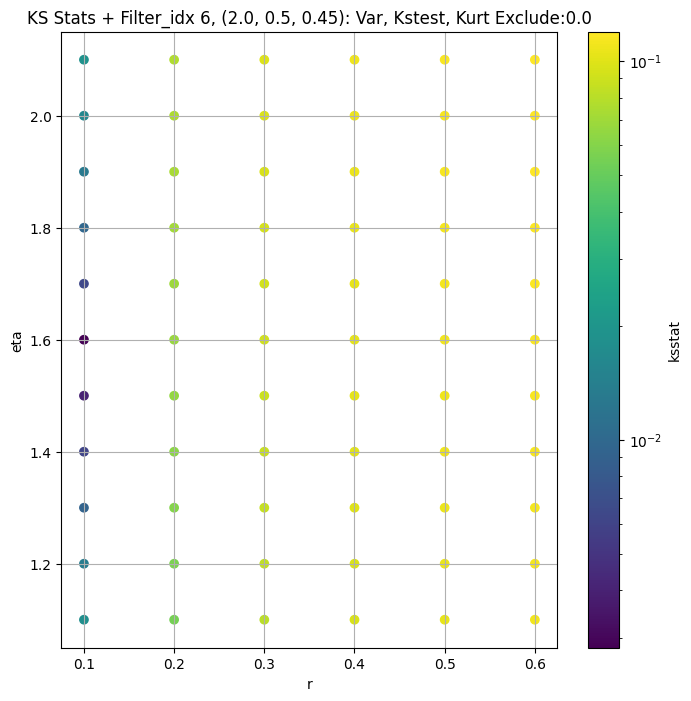

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.011081080474534488 135.91377


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.011300339456269959 127.08056


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.010594365742484513 122.512726


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.011077513874792472 115.89504
Number of samples: 100000, Without approximation : 160000000.0


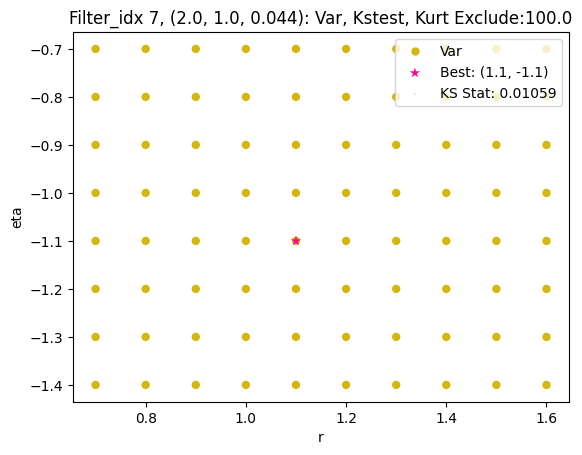

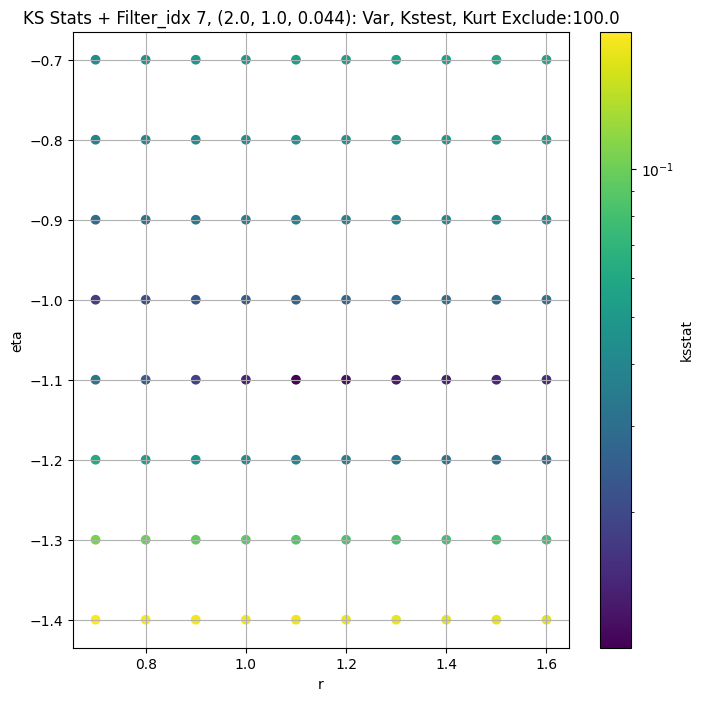

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.010440553875091796 58.51669


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.009729751304761391 53.746346


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.011554481370973202 51.521523


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.011772531798526387 48.380646
Number of samples: 100000, Without approximation : 160000000.0


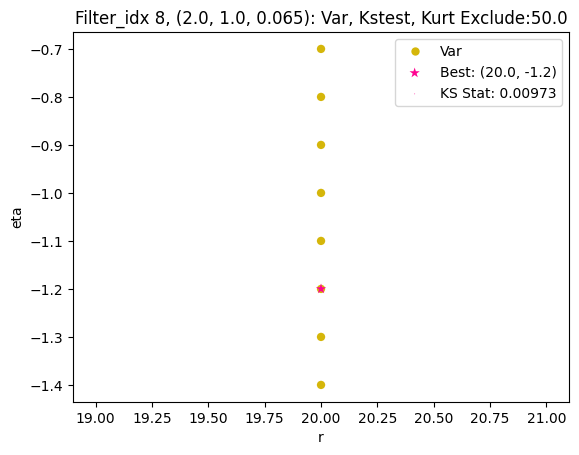

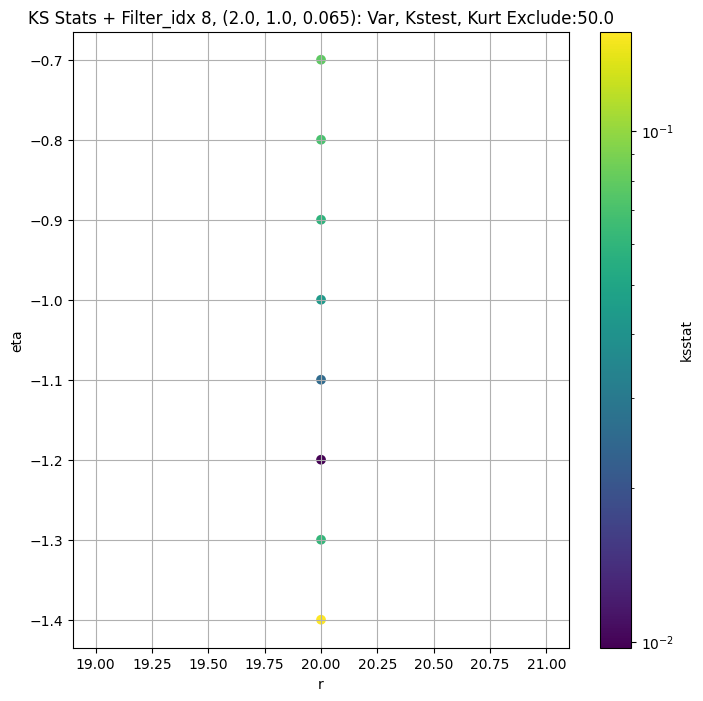

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.010783199016207945 28.640982


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.010386883335855801 25.96509


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.010219930384506692 24.797375


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.01040724664487147 23.147264
Number of samples: 100000, Without approximation : 160000000.0


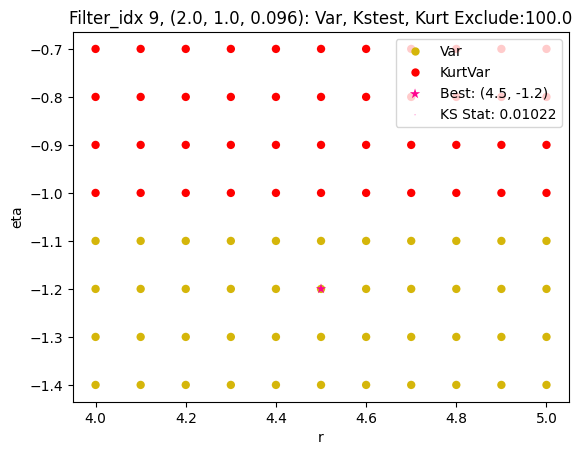

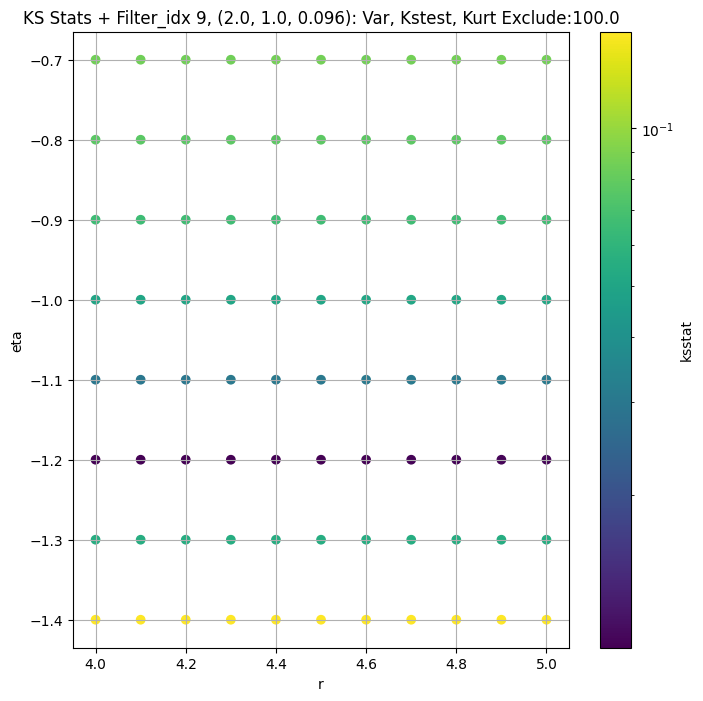

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.01033578332802687 11.196692


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.007924056291235826 10.040785


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.011178274075062472 9.532776


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.009838108099410714 8.830265
Number of samples: 100000, Without approximation : 160000000.0


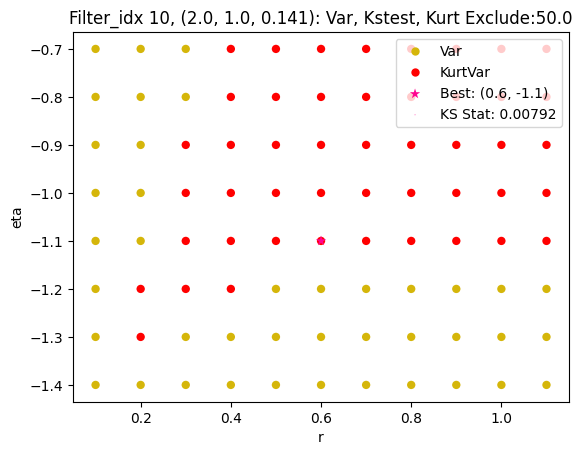

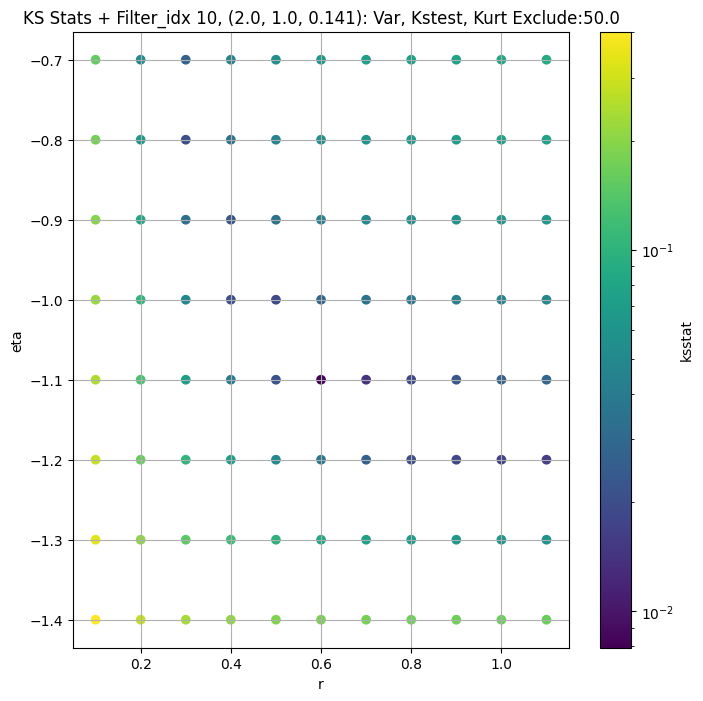

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.009369248178504708 4.1696367


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.011749375402493767 3.700807


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.010566904384786302 3.4981942


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.008784508316978301 3.2201579
Number of samples: 100000, Without approximation : 160000000.0


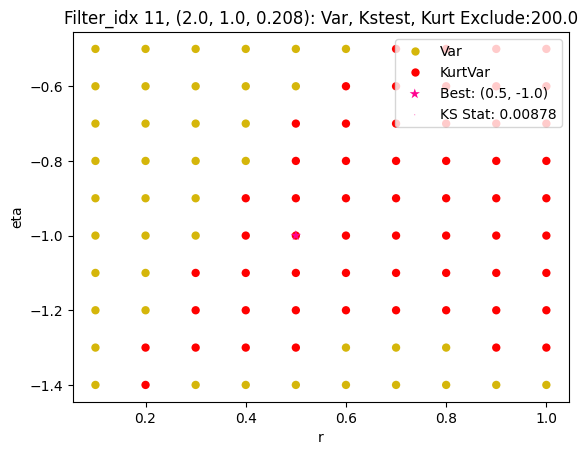

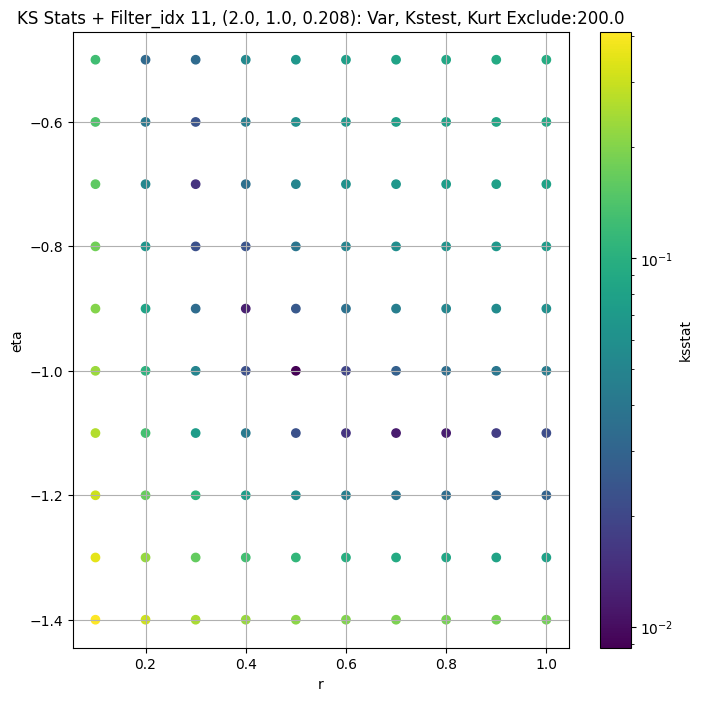

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.006824227961010967 1.5553946


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.008063699399270319 1.3501246


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.008960344091879069 1.2689574


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.007228110206340177 1.1600305
Number of samples: 100000, Without approximation : 160000000.0


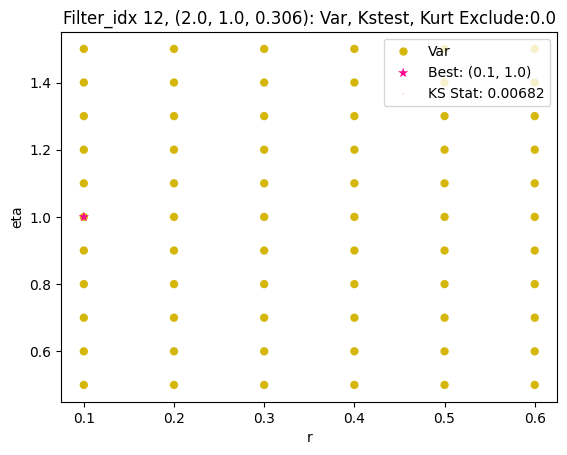

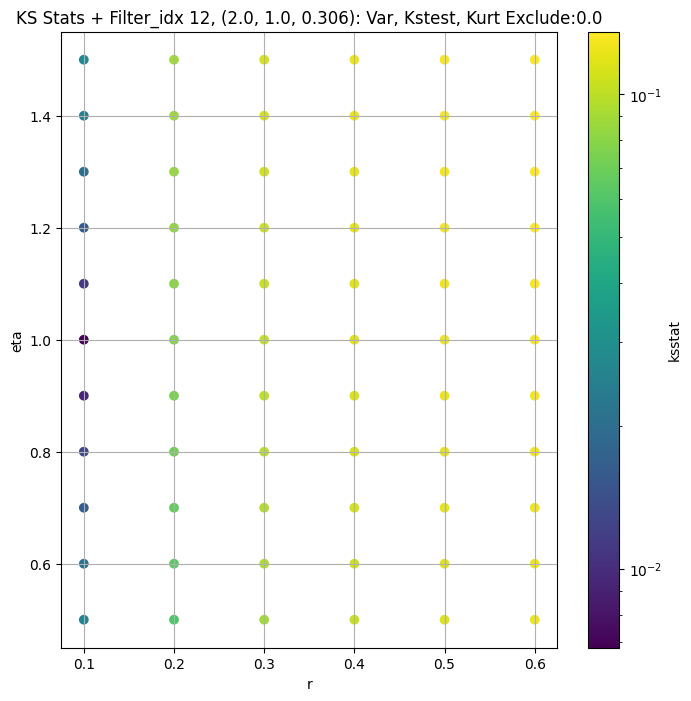

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.0029649157456948516 0.58937305


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.004291260531237351 0.5146322


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.005532716938923099 0.48650473


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.005542528444398009 0.4487135
Number of samples: 100000, Without approximation : 160000000.0


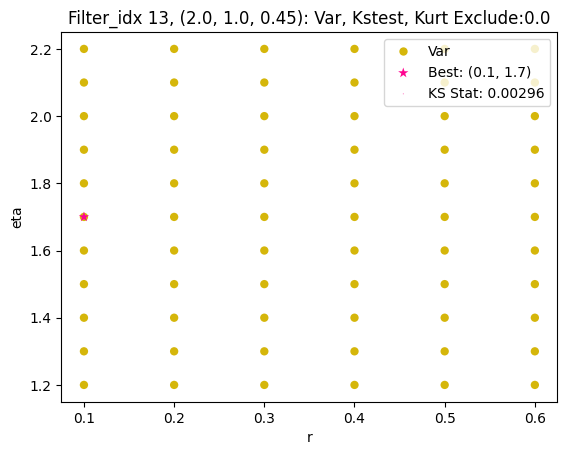

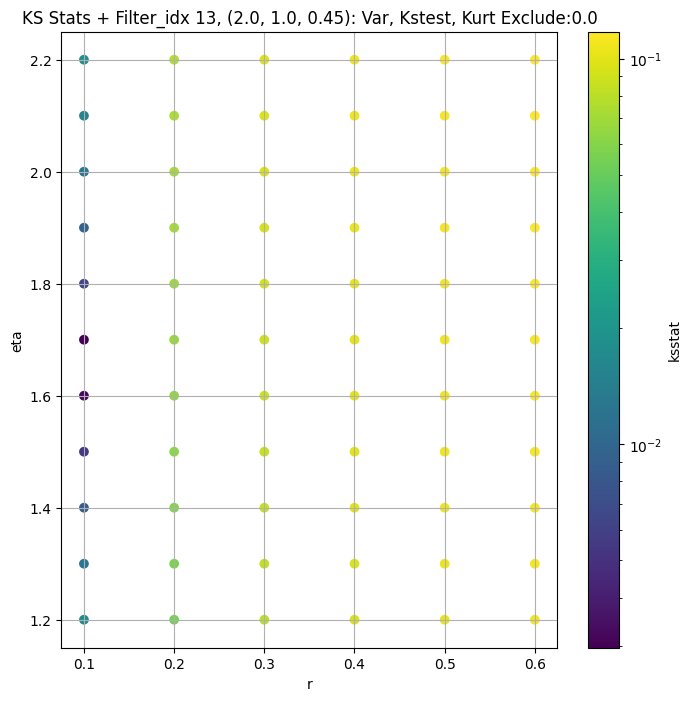

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.009997014812909488 103.26244


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.009983416655833466 95.9705


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.010293132541775218 92.33066


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.011067484282329593 87.046425
Number of samples: 100000, Without approximation : 160000000.0


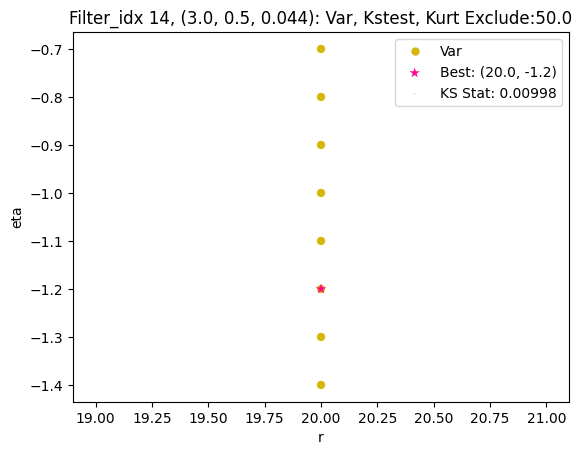

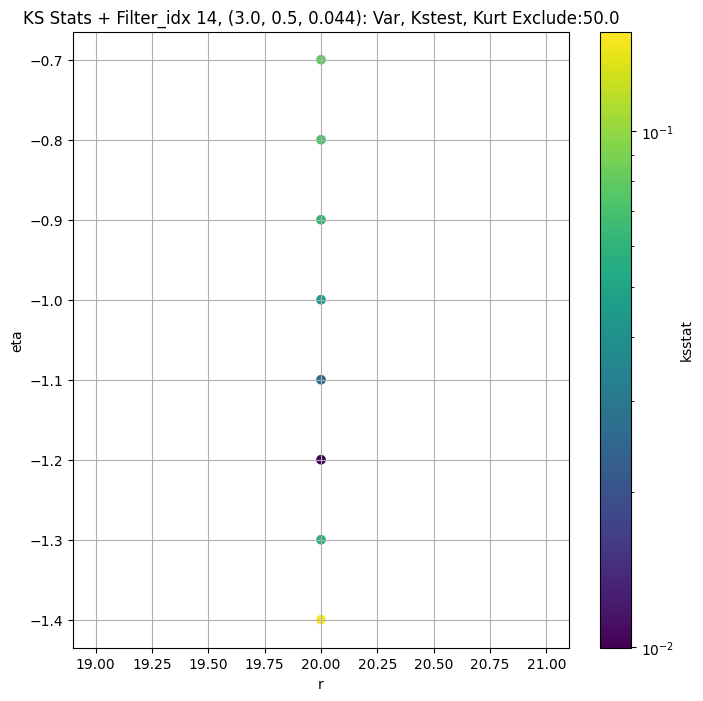

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.008501533412346995 46.23726


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.008468656277093423 43.01957


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.0084845183689784 41.353848


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.008437494001863333 38.911034
Number of samples: 100000, Without approximation : 160000000.0


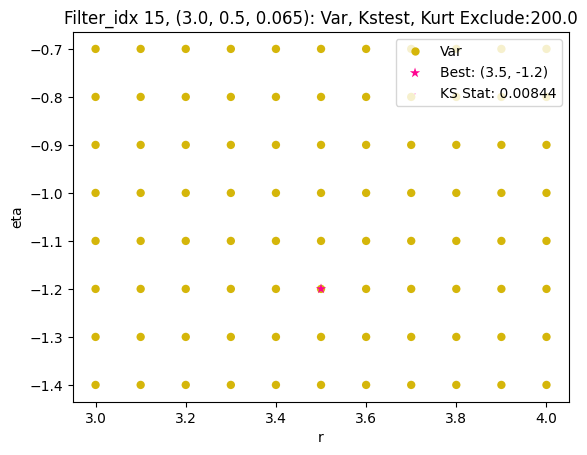

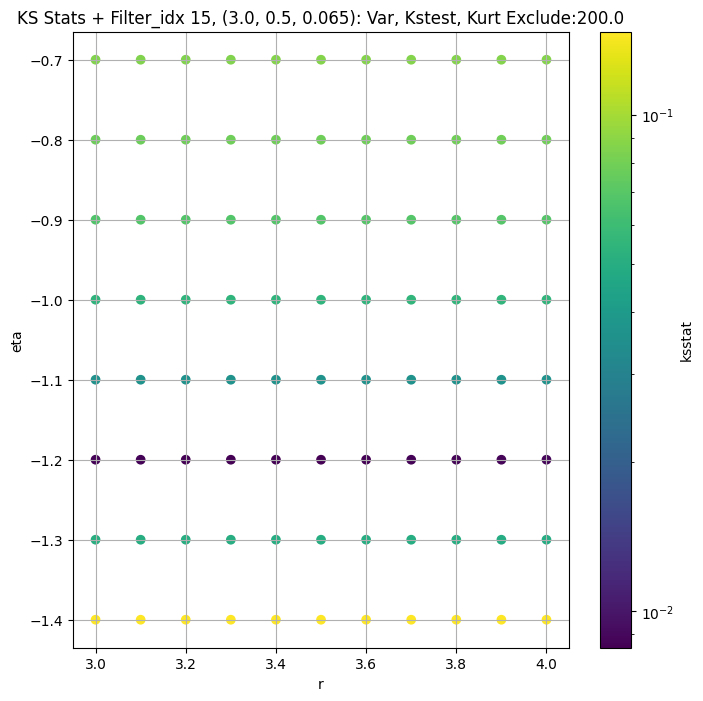

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.01135757404277532 20.037388


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.010793972844842958 18.202623


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.010550364652420485 17.353918


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.01036698927775176 16.141014
Number of samples: 100000, Without approximation : 160000000.0


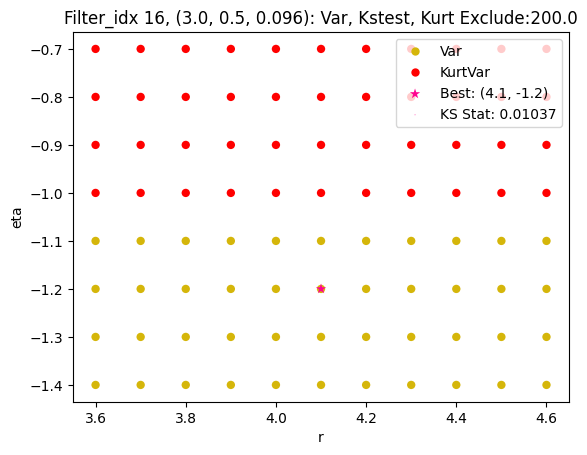

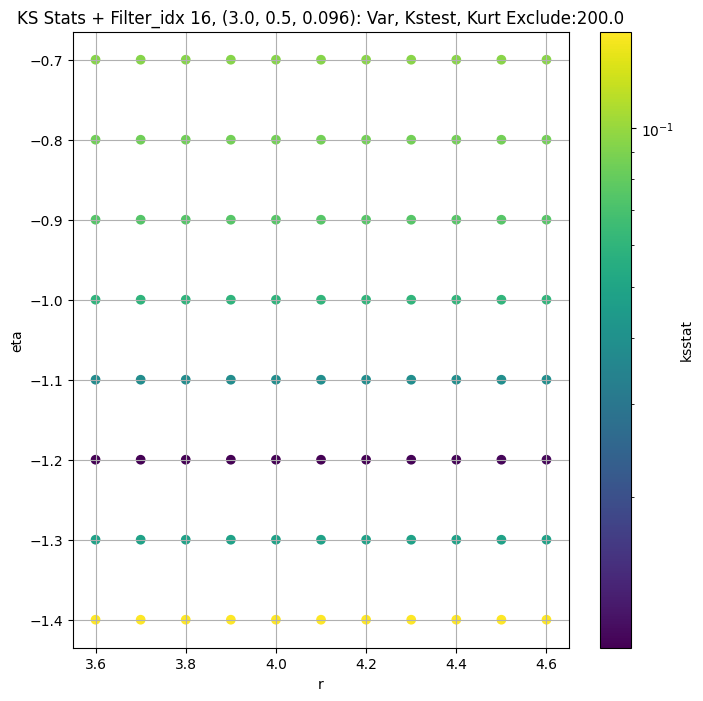

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.008558063188870757 8.319288


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.010846630402325003 7.445243


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.012046136009584874 7.050454


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.00903061343426241 6.500254
Number of samples: 100000, Without approximation : 160000000.0


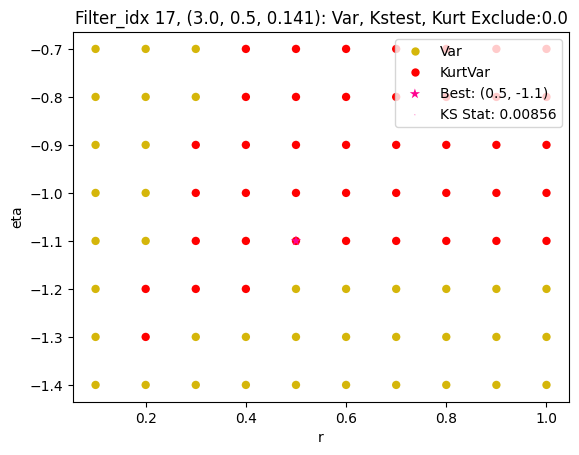

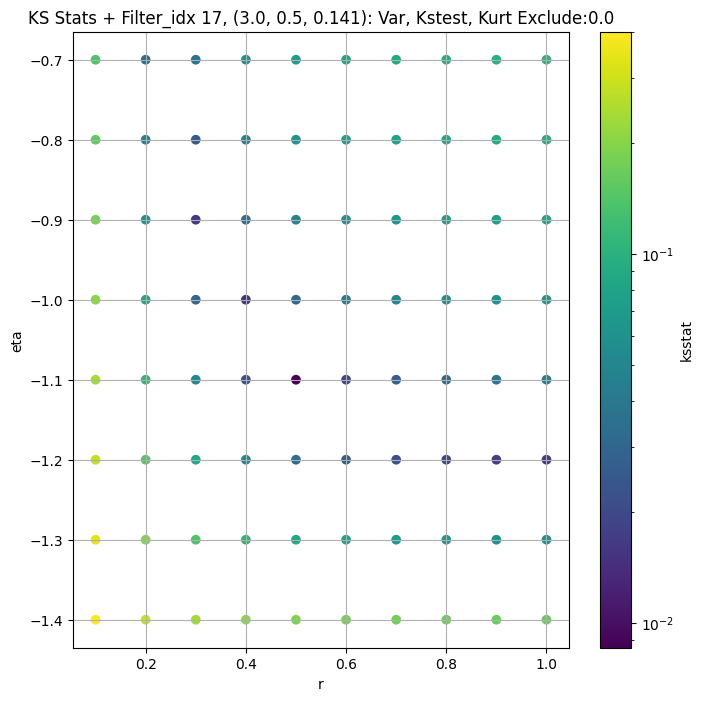

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.010444455207173298 3.2307115


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.011383011537543897 2.811022


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.010273202886376787 2.6390643


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.014595598093372963 2.4077845
Number of samples: 100000, Without approximation : 160000000.0


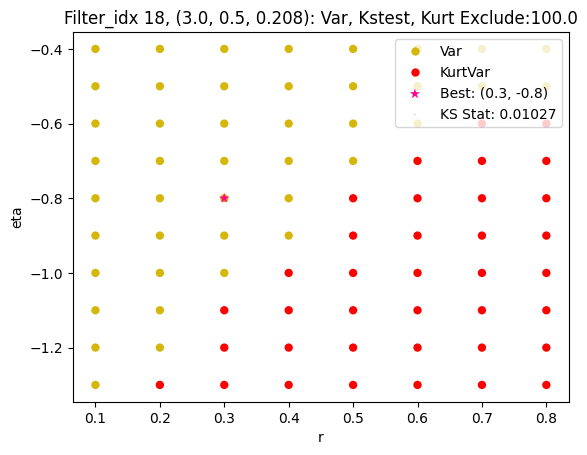

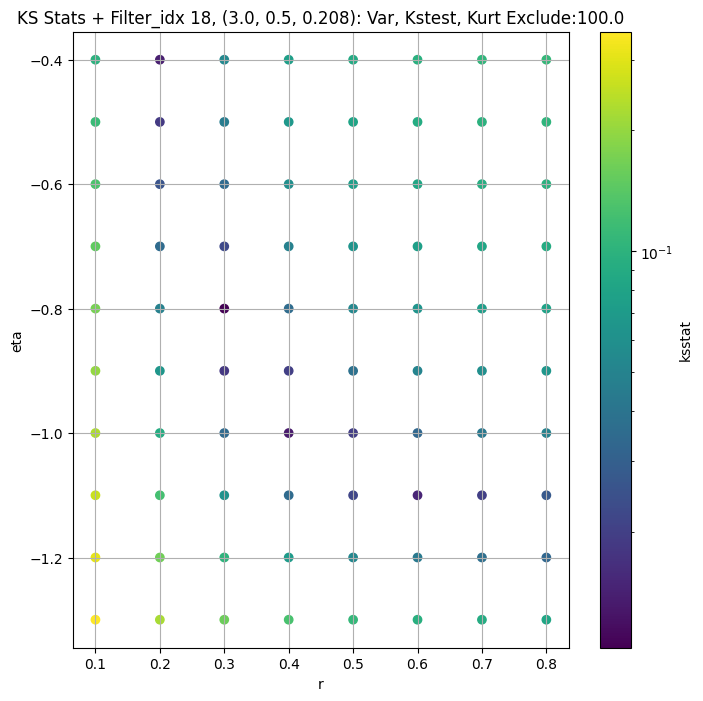

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.003097954030581662 0.96752053


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.00566917245133558 0.8241138


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.005003975643776748 0.7715246


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.006026036308454247 0.70212185
Number of samples: 100000, Without approximation : 160000000.0


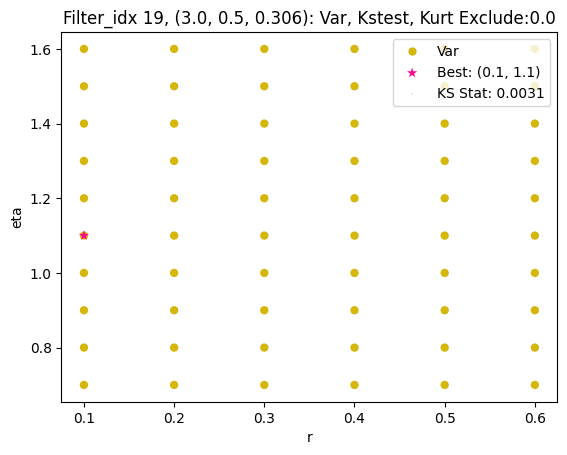

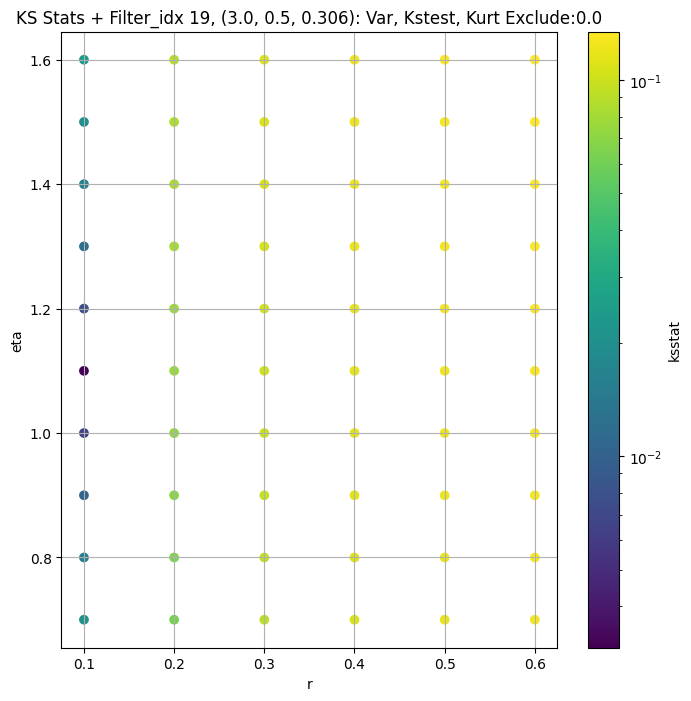

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.003883737856138547 0.34831363


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.002001409632806199 0.2935185


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.003755284026976946 0.27588755


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.004090144159653697 0.2531193
Number of samples: 100000, Without approximation : 160000000.0


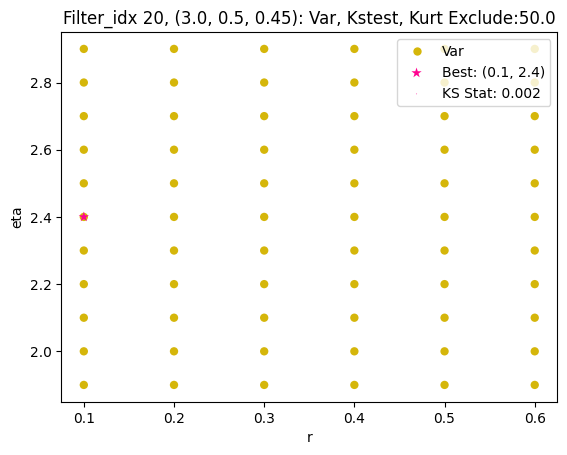

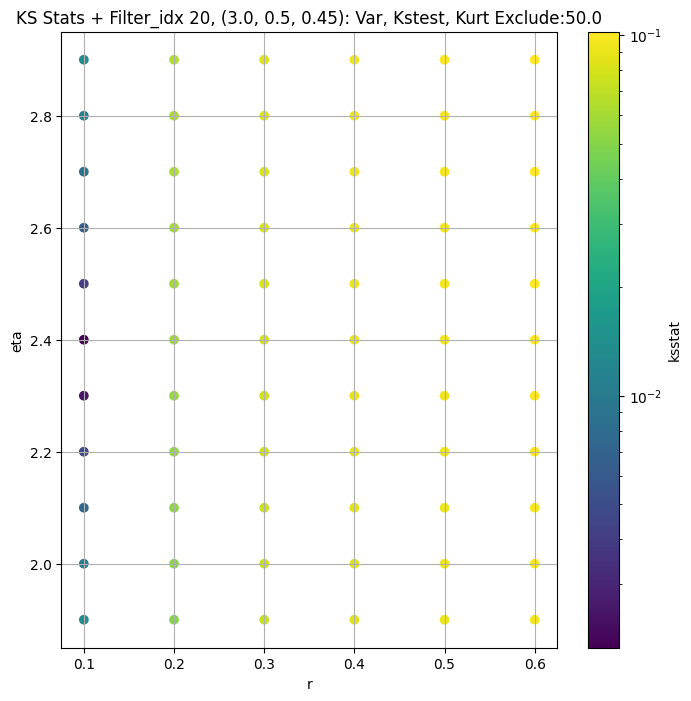

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.01024885726899677 111.1275


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.009953800964268011 102.73839


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.009974104534689499 98.63874


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.01046795376116022 92.73774
Number of samples: 100000, Without approximation : 160000000.0


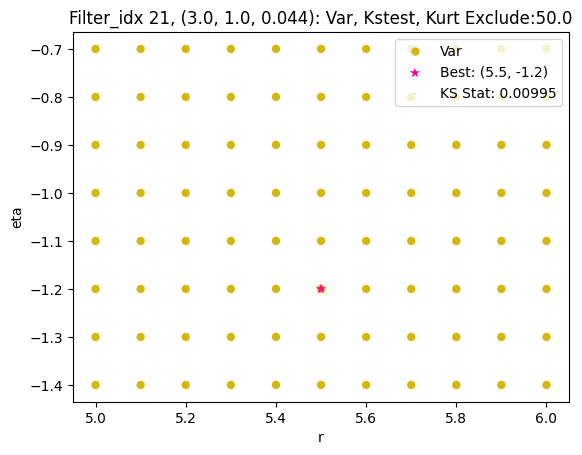

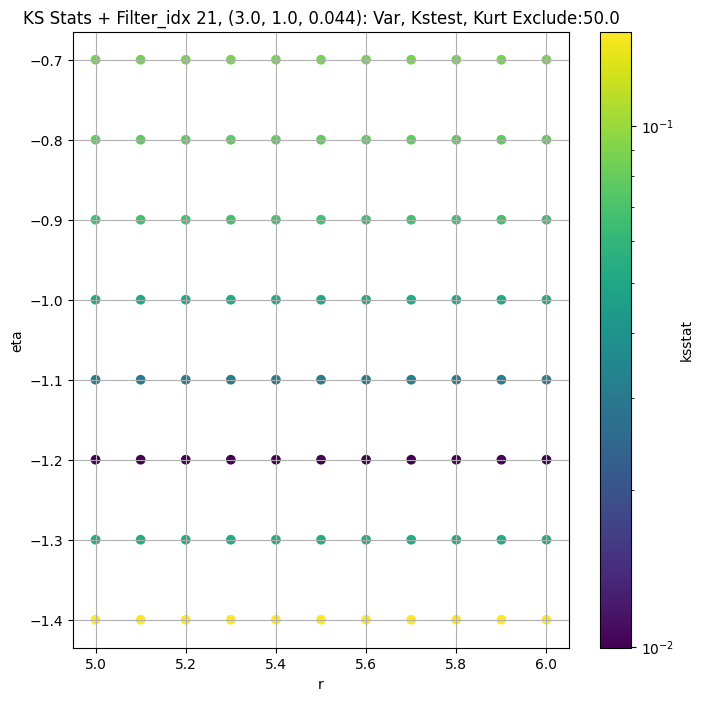

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.009429804951231247 49.90227


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.009009161232991447 46.02462


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.008931140734966925 44.1499


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.009334966438758419 41.463306
Number of samples: 100000, Without approximation : 160000000.0


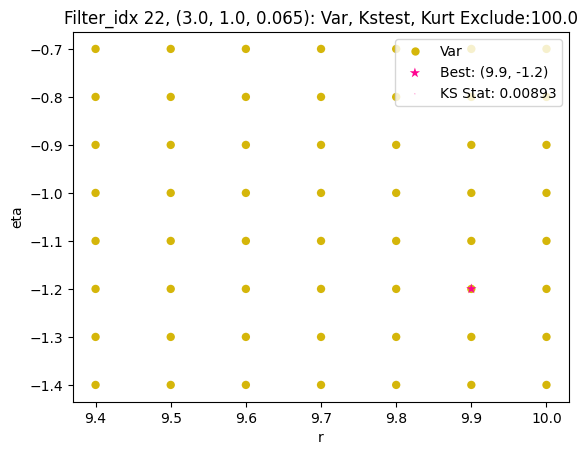

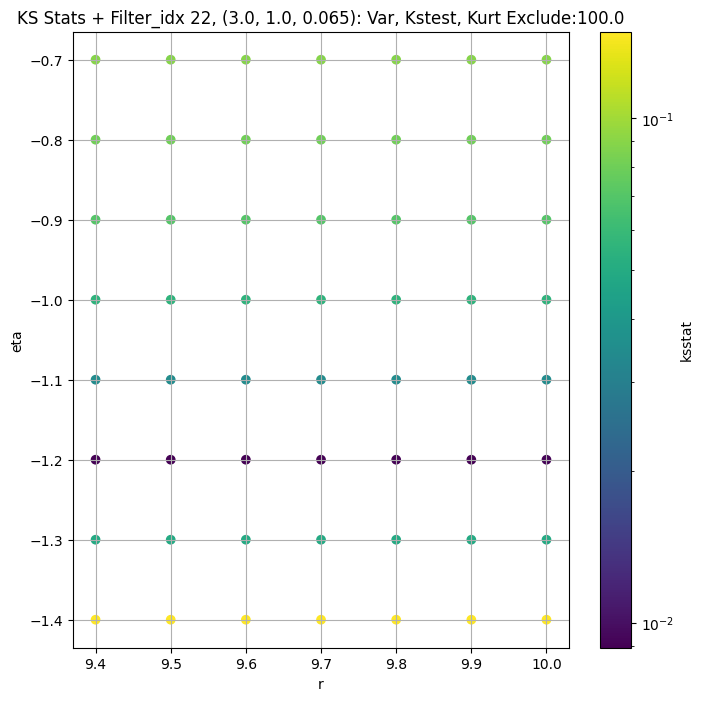

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.010257536317313187 23.767887


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.009909880569156315 21.610493


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.009820336953009656 20.620253


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.009853969112990524 19.201735
Number of samples: 100000, Without approximation : 160000000.0


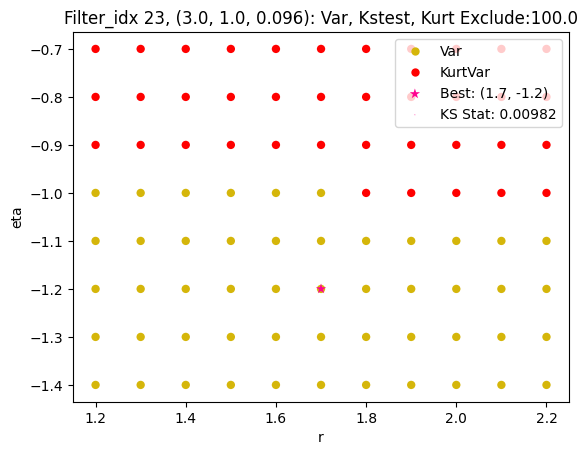

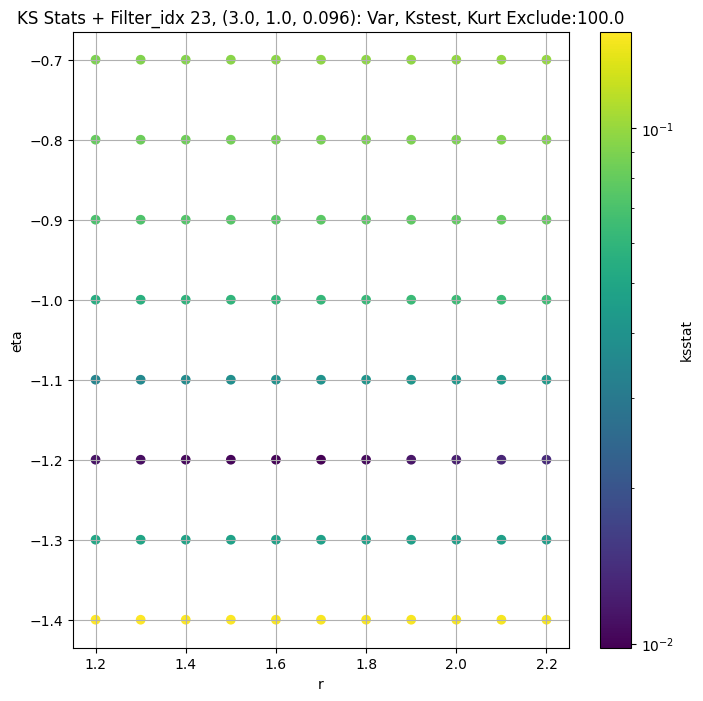

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.008033952915480869 9.408416


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.009364464220956104 8.303849


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.012049685620997064 7.853283


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.009231380737365125 7.232907
Number of samples: 100000, Without approximation : 160000000.0


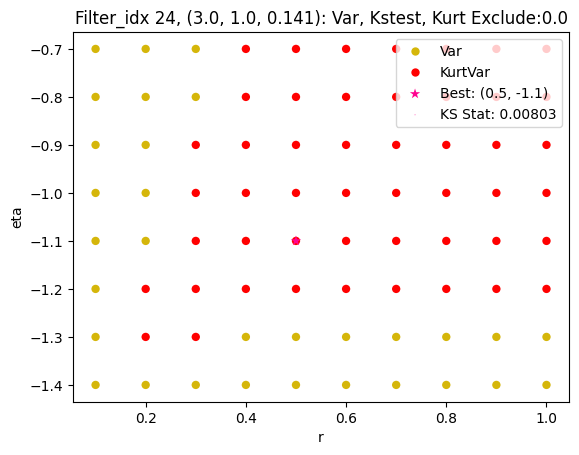

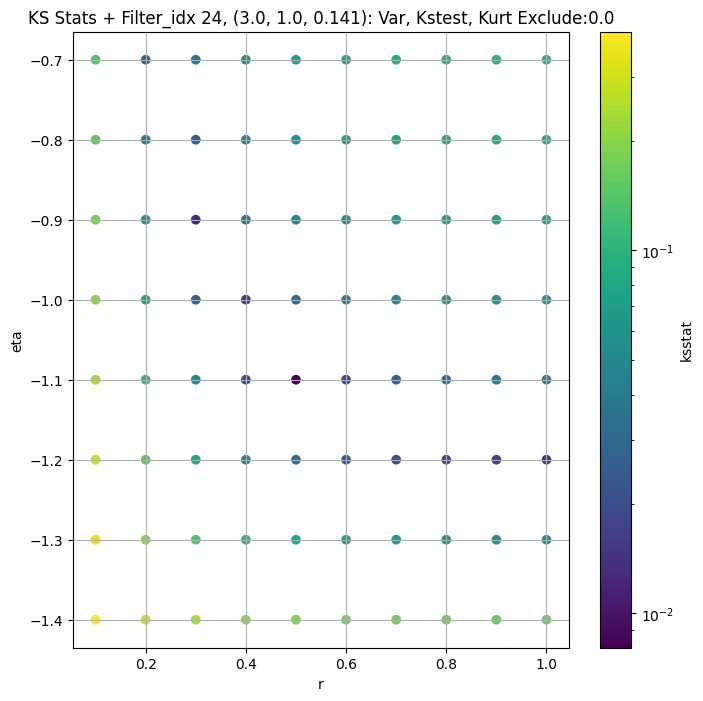

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.008098535200368129 3.8262506


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.009596855038580432 3.3471591


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.010646941046537517 3.1468534


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.012468869622263776 2.8745024
Number of samples: 100000, Without approximation : 160000000.0


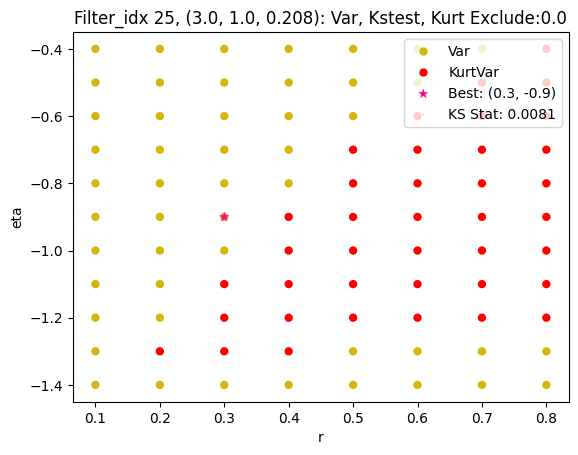

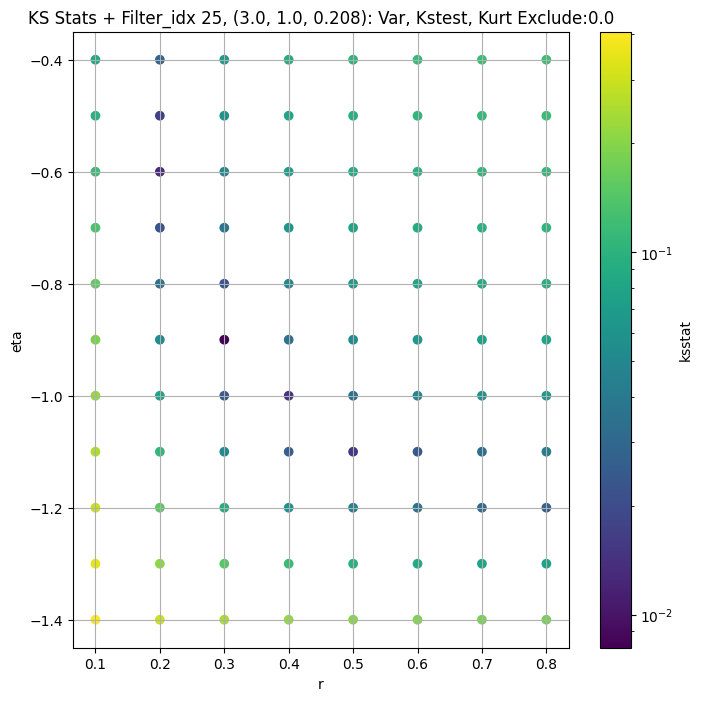

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.005483573046653034 1.2694466


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.005971114343709602 1.0594853


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.005454800797377091 0.98534465


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.006471758699812646 0.8890378
Number of samples: 100000, Without approximation : 160000000.0


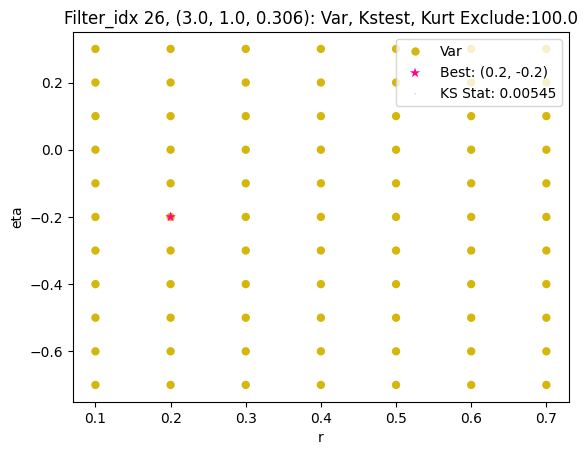

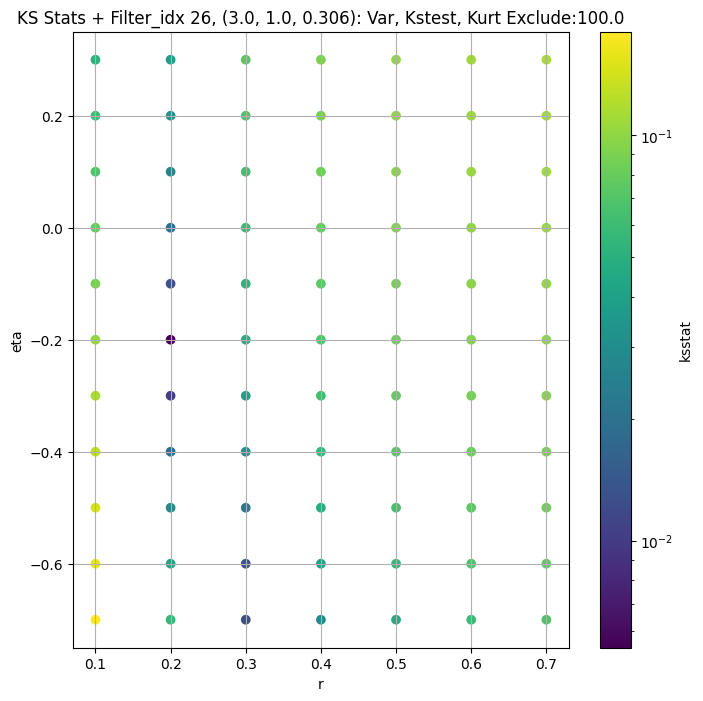

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.003691787926042689 0.3788139


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.0028985502059681867 0.319417


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.003527567068466797 0.2998178


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.004335218833555032 0.2744108
Number of samples: 100000, Without approximation : 160000000.0


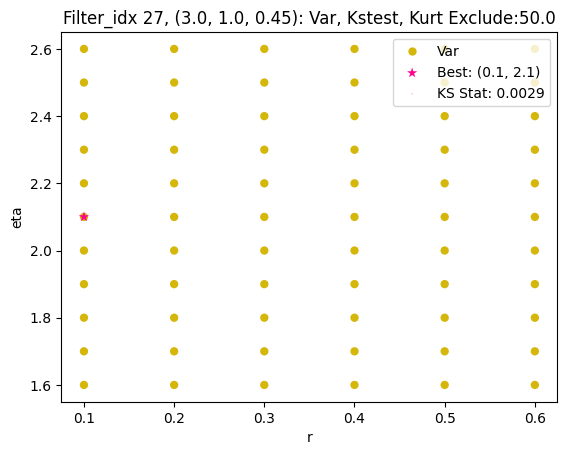

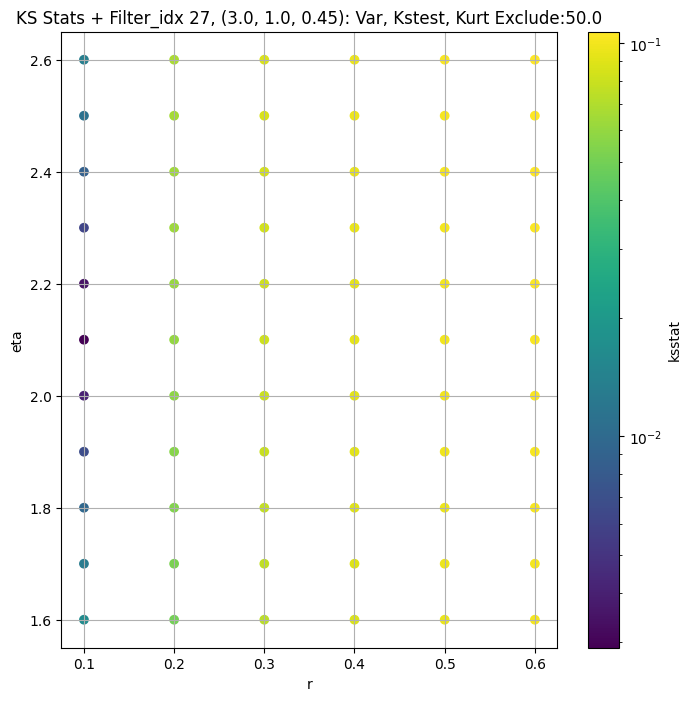

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.009553660378305184 95.73262


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.010632666696880455 89.30322


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.009981553919677921 85.91572


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.010822479380992678 80.95404
Number of samples: 100000, Without approximation : 160000000.0


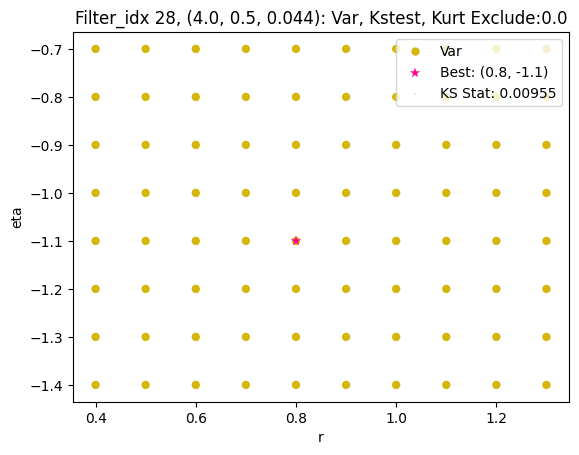

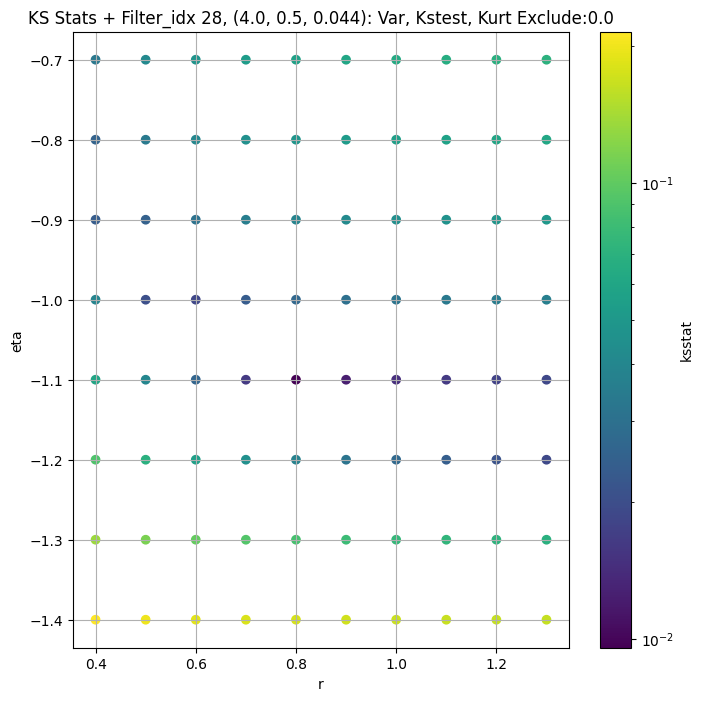

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.009116946507467125 42.464394


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.008765895915747168 39.20588


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.008633874006124365 37.605392


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.008824737907286218 35.276234
Number of samples: 100000, Without approximation : 160000000.0


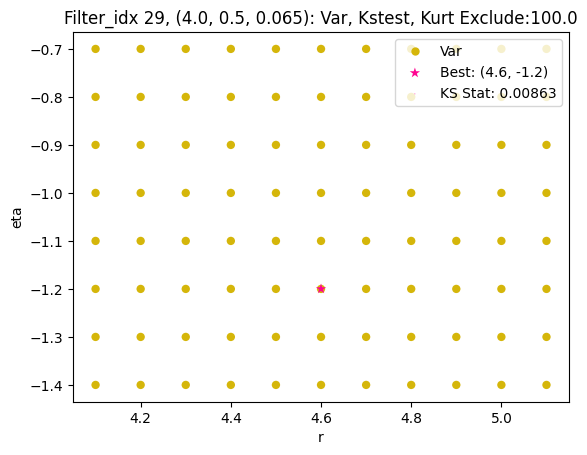

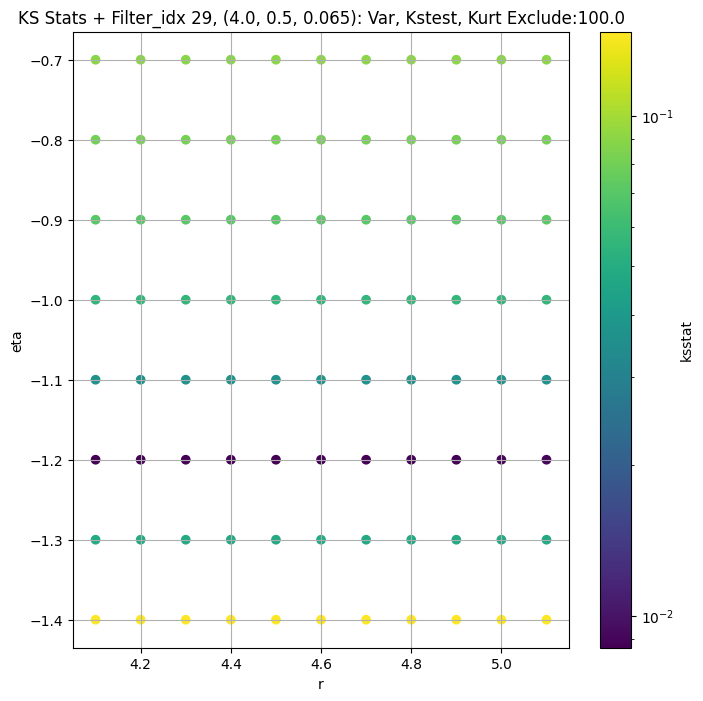

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.01066882599423491 19.2017


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.010457896315320153 17.611086


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.010225145040325956 16.815018


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.010075144792950658 15.673539
Number of samples: 100000, Without approximation : 160000000.0


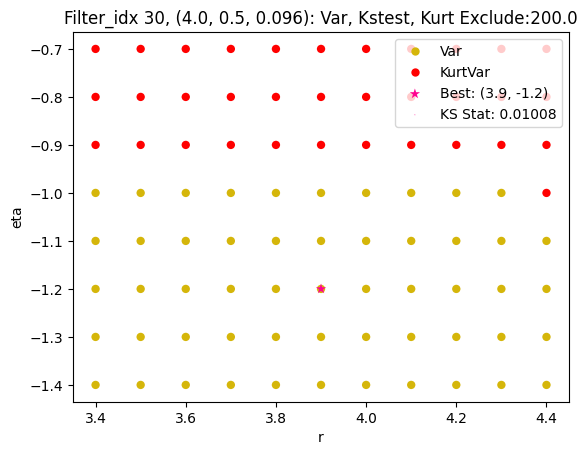

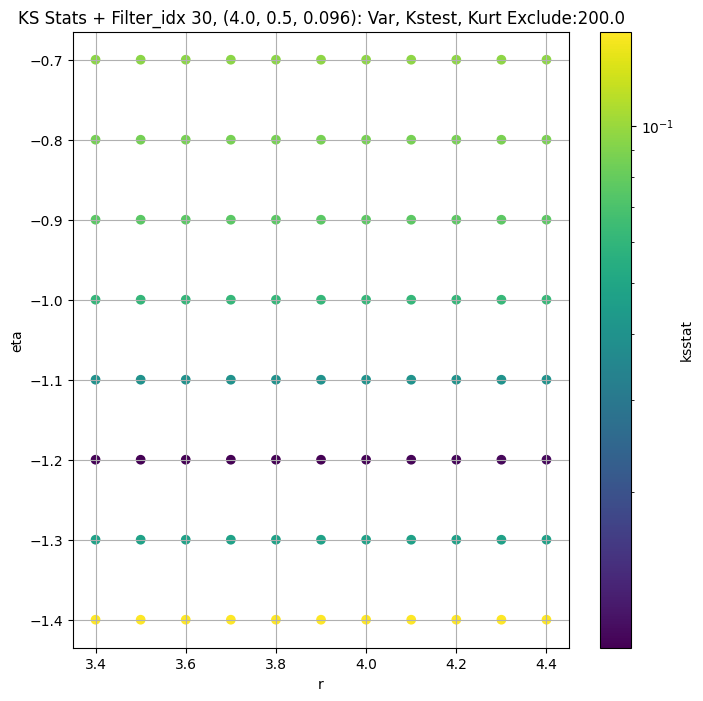

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.009887062086811116 7.875181


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.009858953972046725 7.0427847


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.007792868073826287 6.67008


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.011102926122535828 6.153202
Number of samples: 100000, Without approximation : 160000000.0


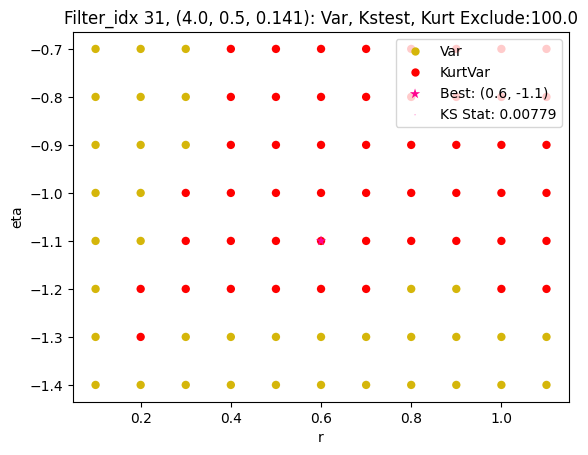

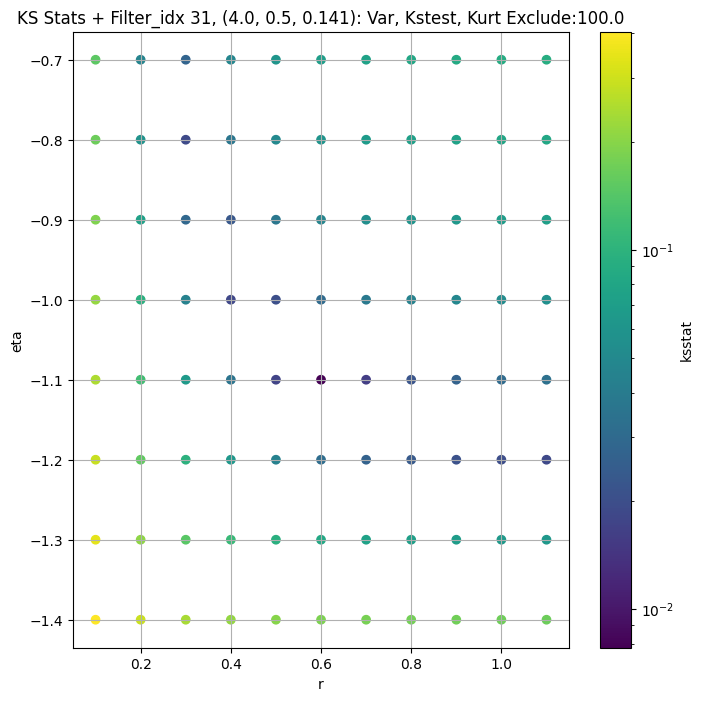

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.010953979430518235 3.103922


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.010291252930930583 2.7169847


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.012042797360586555 2.558577


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.008148591500233393 2.343383
Number of samples: 100000, Without approximation : 160000000.0


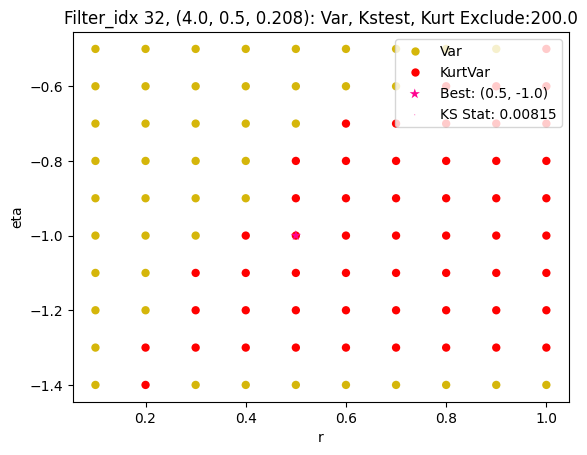

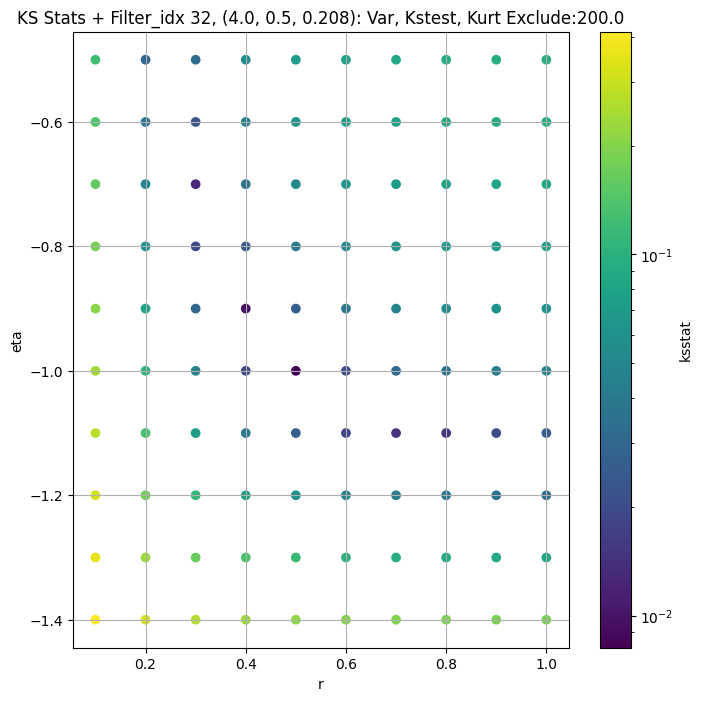

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.00369172958840841 0.9956717


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.00563532929900179 0.83042705


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.005597442789671225 0.7767016


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.005683125478980033 0.70630145
Number of samples: 100000, Without approximation : 160000000.0


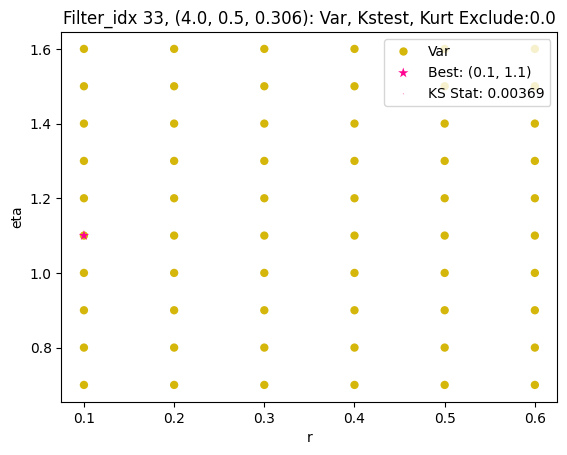

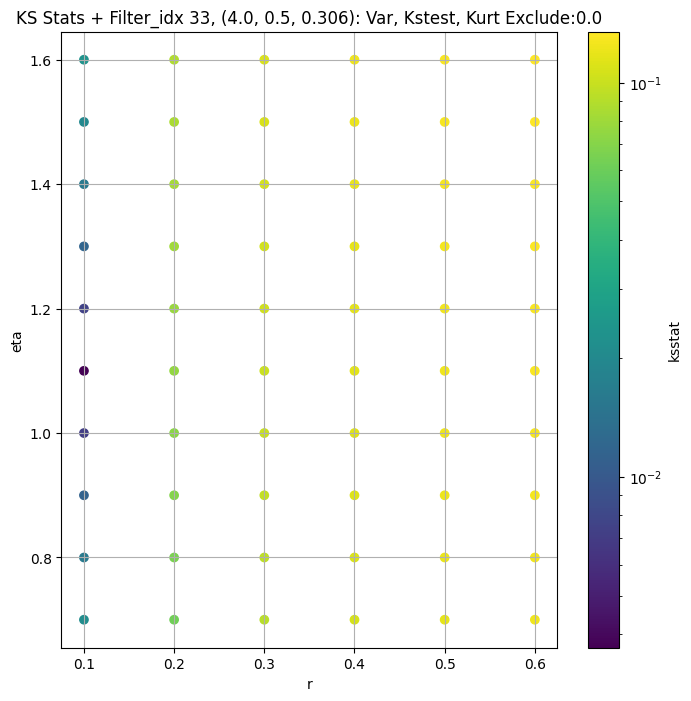

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.00401513383902205 0.30910185


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.002667255250177303 0.25304067


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.0032001690333400487 0.2388742


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.003912720069590203 0.22040679
Number of samples: 100000, Without approximation : 160000000.0


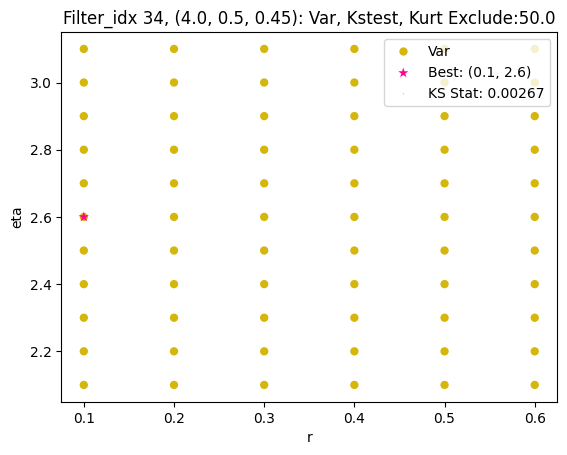

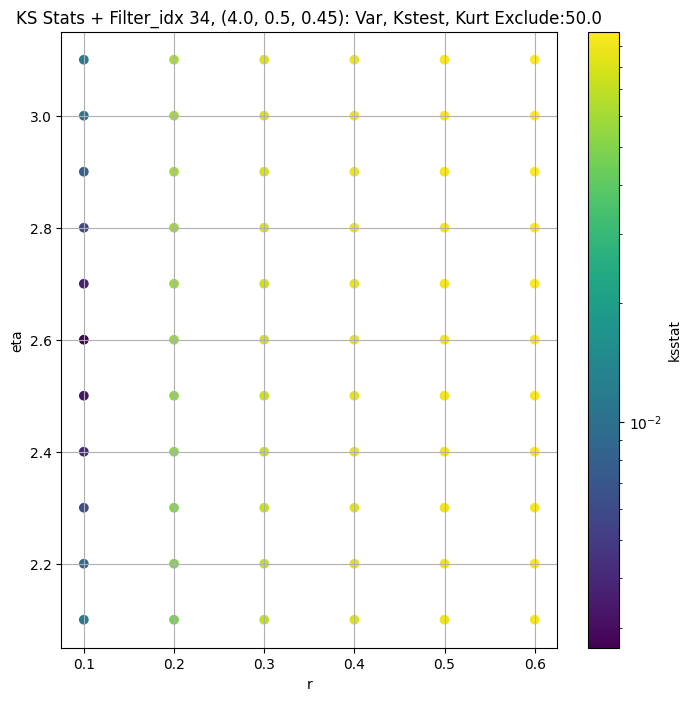

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.01071951793007947 102.45844


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.010363263028668301 94.281784


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.010706721066014946 90.36829


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.011227725258706078 84.80294
Number of samples: 100000, Without approximation : 160000000.0


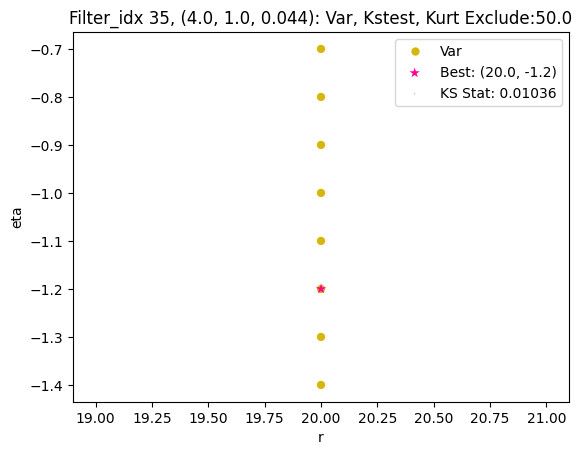

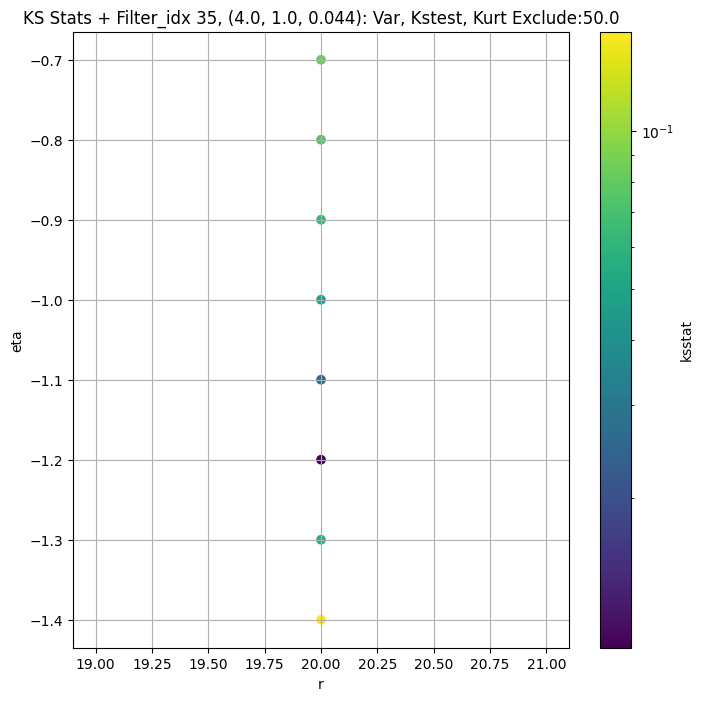

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.009147666439773425 46.47148


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.008873279130359735 43.112934


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.008879547860863979 41.44257


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.009266294640214112 39.011284
Number of samples: 100000, Without approximation : 160000000.0


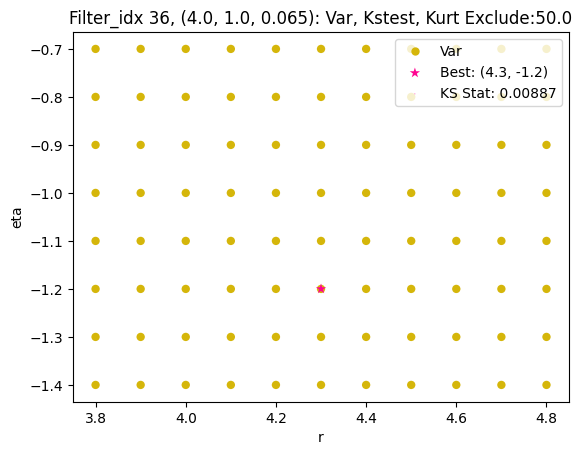

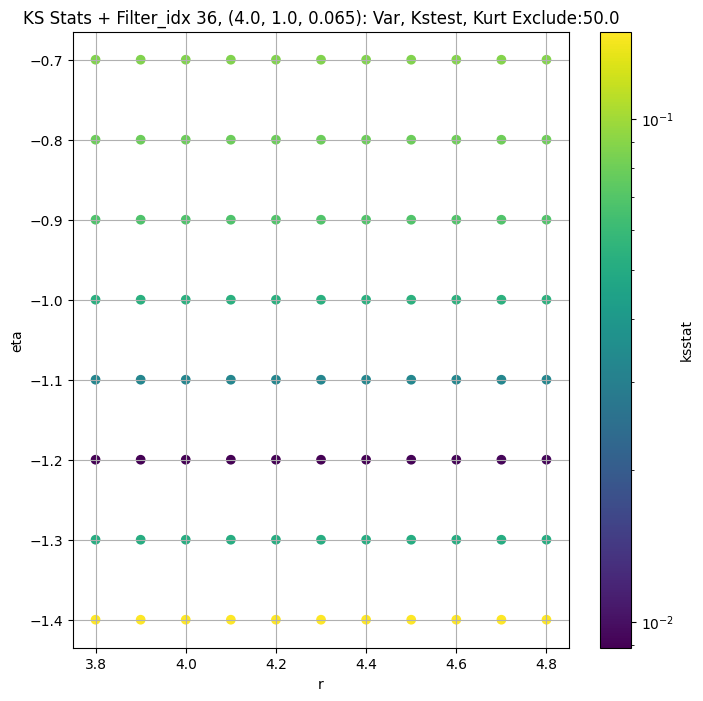

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.010577974793299583 20.133867


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.010394109939277252 18.128727


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.010151564848525307 17.251513


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.010032890075782952 16.023354
Number of samples: 100000, Without approximation : 160000000.0


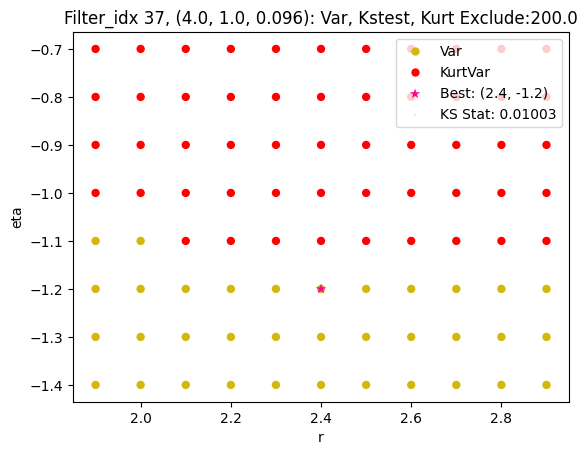

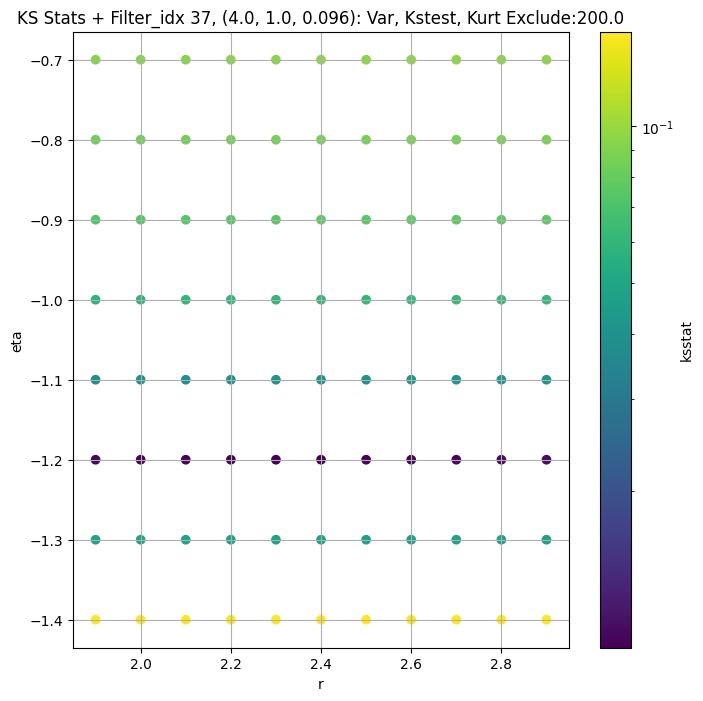

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.008240315805615739 9.355118


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.011124192695232238 8.241087


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.009188713445736685 7.802016


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.010666451265877397 7.1991506
Number of samples: 100000, Without approximation : 160000000.0


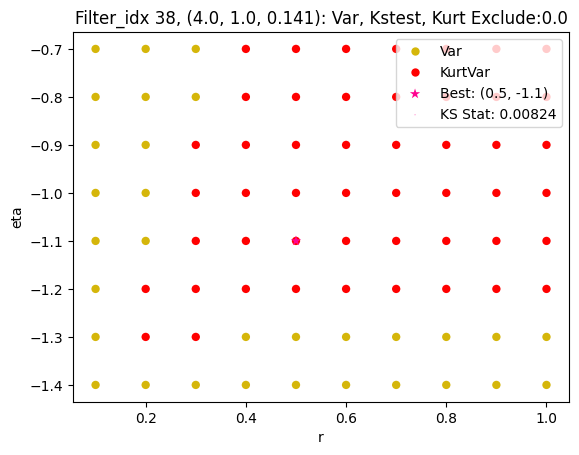

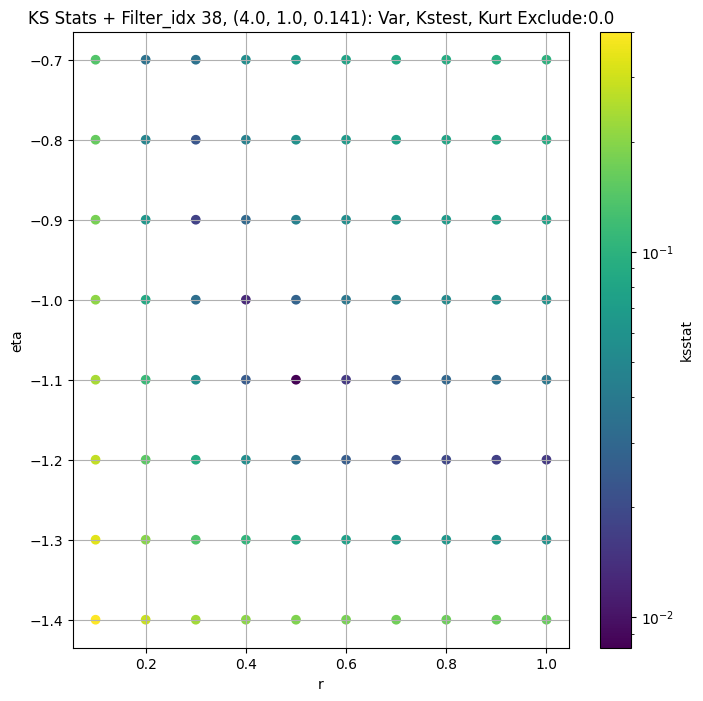

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.008661378228928873 3.5068789


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.01037456235867451 3.0229135


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.010011110988286498 2.836304


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.013455880776734 2.585895
Number of samples: 100000, Without approximation : 160000000.0


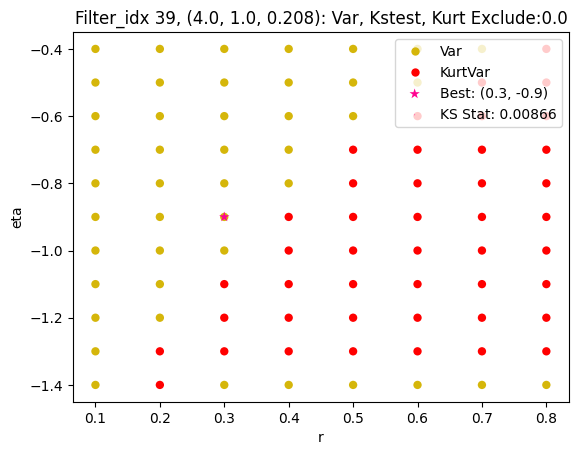

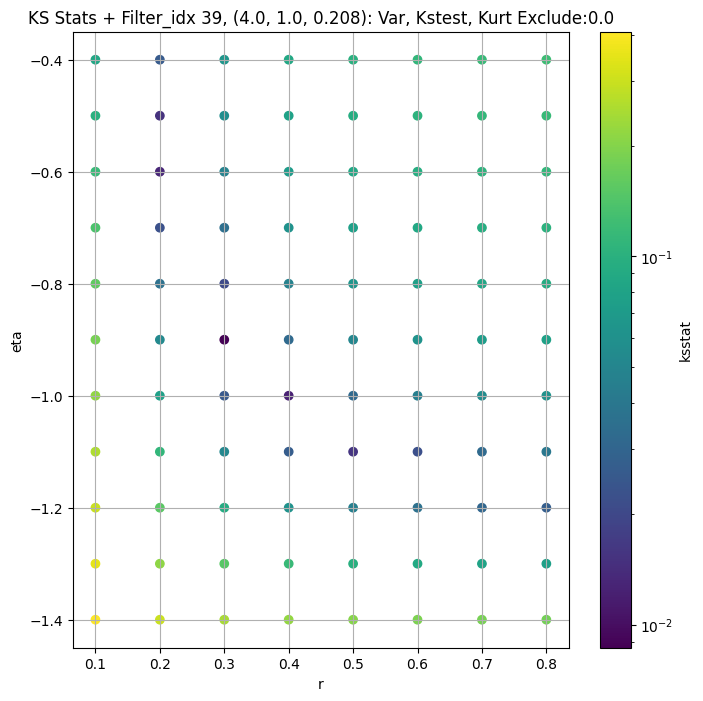

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.003198331122349296 1.1221639


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.0051268877585547434 0.94035846


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.004901125040442211 0.8775559


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.007073248794778331 0.79590017
Number of samples: 100000, Without approximation : 160000000.0


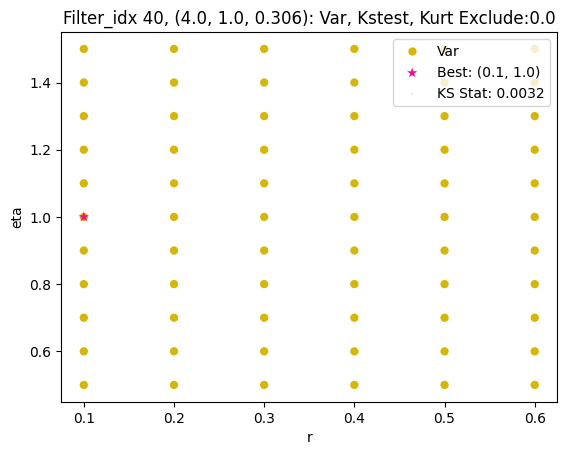

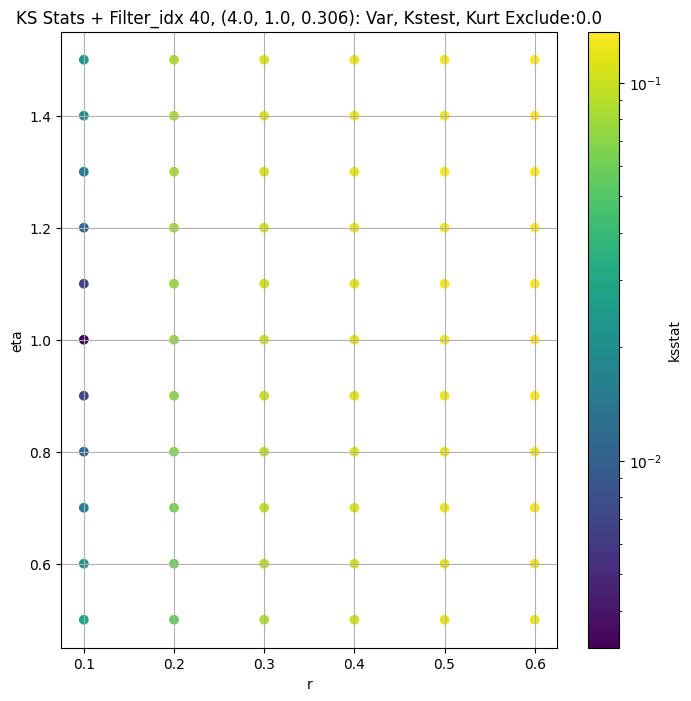

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.003801329659689559 0.3166524


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.002417024604564083 0.26120538


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.0027790363559906384 0.24550477


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.004382372543476287 0.22522464
Number of samples: 100000, Without approximation : 160000000.0


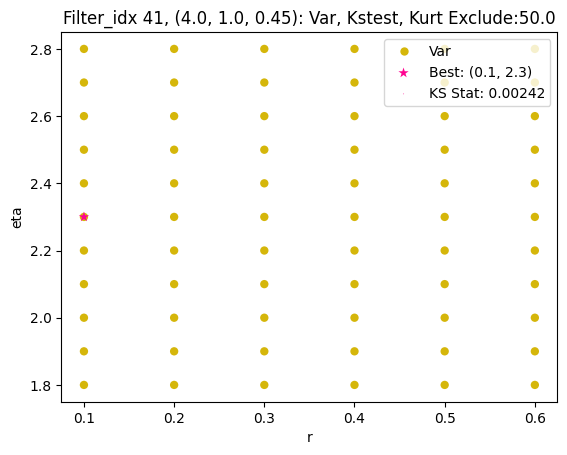

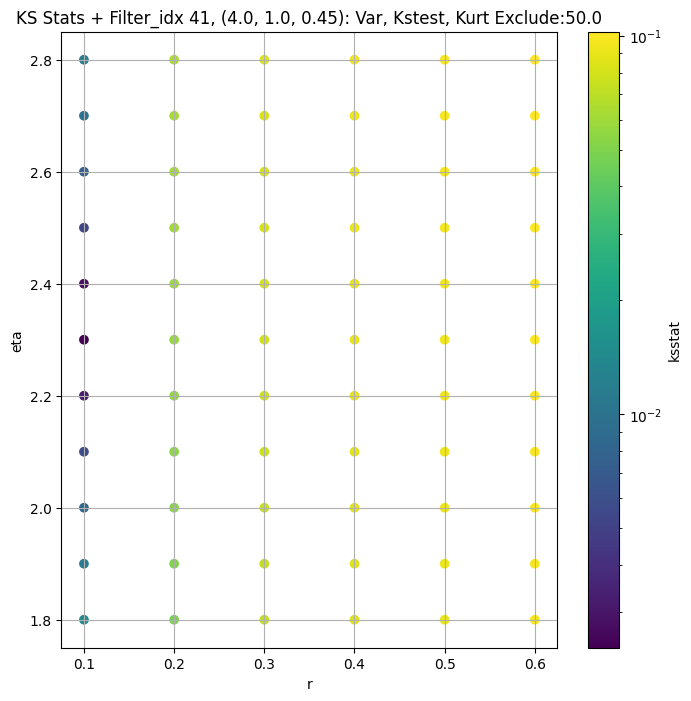

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",104.751920,79.171340,144.730820,9.756392,3.355390,53.305700,160000000.0,"(2.0, 0.5, 0.044)",0.009914,1.2,-1.1,2.736249e+02,100.0,94.756584,0.000107
1,"(2.0, 0.5, 0.065)",44.688686,33.397083,65.193830,15.381451,3.886639,124.987910,160000000.0,"(2.0, 0.5, 0.065)",0.008890,8.1,-1.2,1.883744e+02,50.0,41.240204,0.000107
2,"(2.0, 0.5, 0.096)",19.629204,14.301214,29.159916,20.022379,4.770294,139.852800,160000000.0,"(2.0, 0.5, 0.096)",0.009700,20.0,-1.2,7.053810e+01,200.0,15.865404,0.000107
3,"(2.0, 0.5, 0.141)",7.416366,5.222577,13.065188,27.643420,5.379395,179.515410,160000000.0,"(2.0, 0.5, 0.141)",0.008278,0.6,-1.1,7.573987e+00,50.0,6.659602,0.000107
4,"(2.0, 0.5, 0.208)",3.177796,2.139311,6.415463,37.375984,6.484847,279.421500,160000000.0,"(2.0, 0.5, 0.208)",0.007929,0.5,-1.0,1.405376e+00,50.0,2.810753,0.000107
5,"(2.0, 0.5, 0.306)",0.918258,0.597128,2.031347,53.133640,5.832935,328.755520,160000000.0,"(2.0, 0.5, 0.306)",0.004472,0.1,1.3,7.264586e-16,0.0,0.918258,0.000107
6,"(2.0, 0.5, 0.45)",0.581501,0.391970,1.477699,61.547700,5.796725,374.792420,160000000.0,"(2.0, 0.5, 0.45)",0.002824,0.1,1.6,1.890452e-16,0.0,0.581501,0.000107
7,"(2.0, 1.0, 0.044)",135.913770,104.683360,182.711210,10.395148,3.562033,62.887478,160000000.0,"(2.0, 1.0, 0.044)",0.010594,1.1,-1.1,3.323723e+02,100.0,122.512726,0.000107
8,"(2.0, 1.0, 0.065)",58.516690,43.111374,92.271360,16.282785,3.872179,119.732285,160000000.0,"(2.0, 1.0, 0.065)",0.009730,20.0,-1.2,2.389580e+02,50.0,53.746346,0.000107


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + 100 = 200, ksstat: 0.00939195336013654, var: 89.69493865966797


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + 75 = 175, ksstat: 0.009069717041193082, var: 90.81949615478516


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + 50 = 150, ksstat: 0.008391086228075273, var: 92.02386474609375


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + 25 = 125, ksstat: 0.008669012555828082, var: 93.32688903808594


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + 0 = 100, ksstat: 0.008366141498110435, var: 94.75658416748047


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + -25 = 75, ksstat: 0.008208987815239821, var: 96.35570526123047


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + -50 = 50, ksstat: 0.007457978913782359, var: 98.20791625976562


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + -75 = 25, ksstat: 0.00731084996072634, var: 100.51097869873047


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 0, 100.0 + -100 = 0, ksstat: 0.006463298886101421, var: 104.75192260742188
Number of samples: 100000, Without approximation : 160000000.0


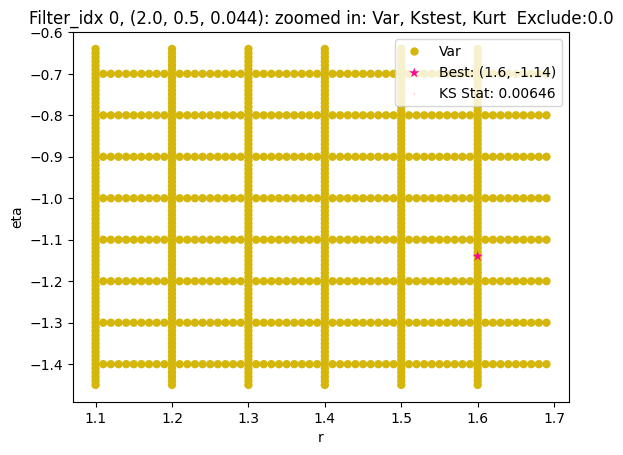

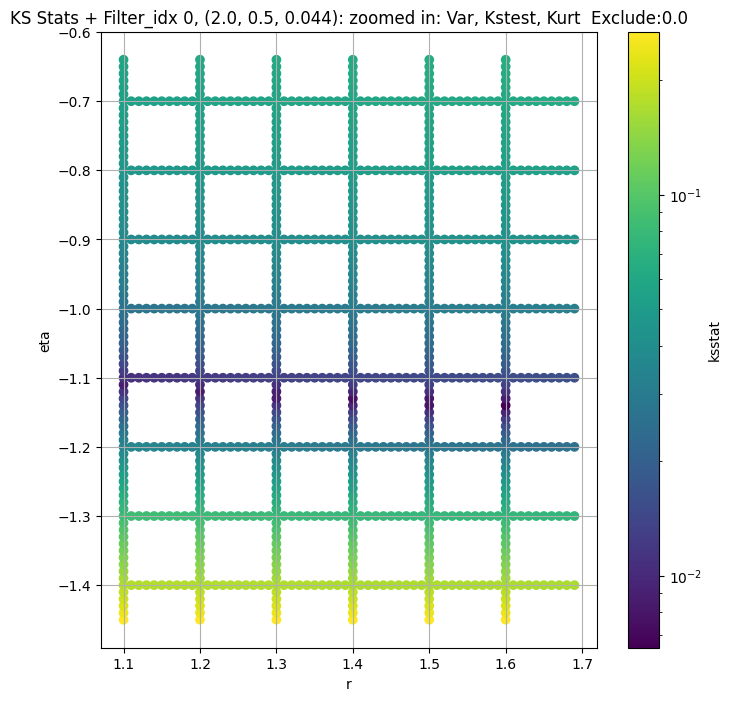

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + 100 = 150, ksstat: 0.007828154679149324, var: 38.264652252197266


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + 75 = 125, ksstat: 0.0077521853281541375, var: 38.88153839111328


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + 50 = 100, ksstat: 0.007669577129350069, var: 39.5637321472168


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + 25 = 75, ksstat: 0.008555960739508484, var: 40.33518981933594


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + 0 = 50, ksstat: 0.008890418323515947, var: 41.240203857421875


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + -25 = 25, ksstat: 0.010522161392966453, var: 42.38267135620117


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 1, 50.0 + -50 = 0, ksstat: 0.012396023735423034, var: 44.68868637084961
Number of samples: 100000, Without approximation : 160000000.0


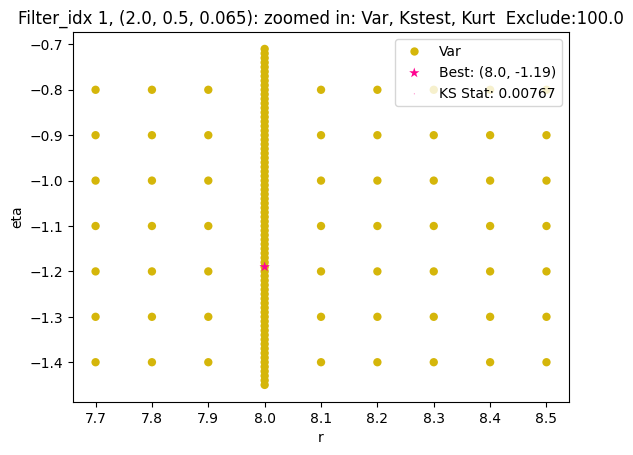

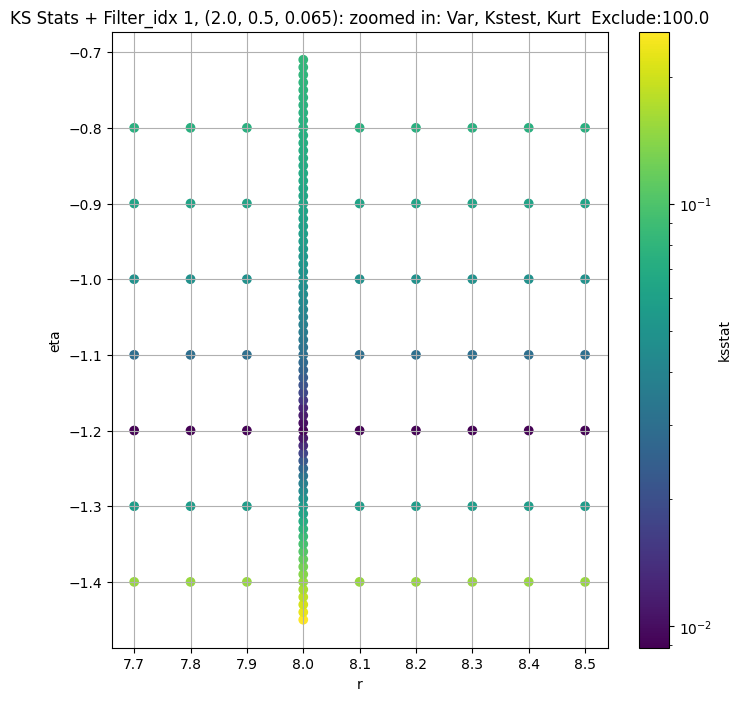

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + 100 = 300, ksstat: 0.010150456763647342, var: 14.991676330566406


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + 75 = 275, ksstat: 0.010043635584509325, var: 15.191868782043457


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + 50 = 250, ksstat: 0.009933208000871718, var: 15.403127670288086


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + 25 = 225, ksstat: 0.009819405118879243, var: 15.626975059509277


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + 0 = 200, ksstat: 0.009700436660574352, var: 15.86540412902832


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + -25 = 175, ksstat: 0.00997396898973471, var: 16.120986938476562


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + -50 = 150, ksstat: 0.011068178135127005, var: 16.3972110748291


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + -75 = 125, ksstat: 0.012243231293489254, var: 16.6991024017334


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 2, 200.0 + -100 = 100, ksstat: 0.013522317792452831, var: 17.034042358398438
Number of samples: 100000, Without approximation : 160000000.0


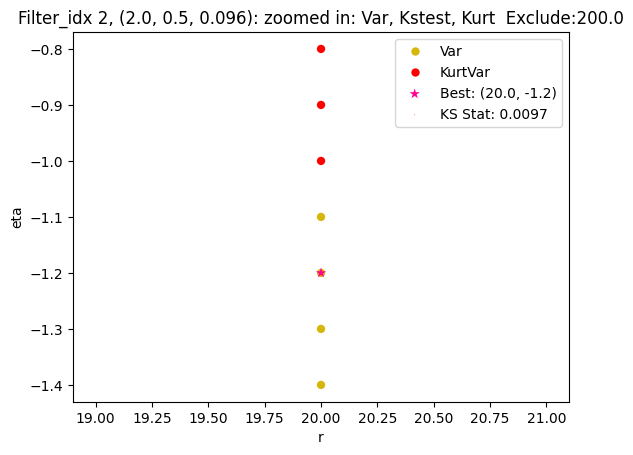

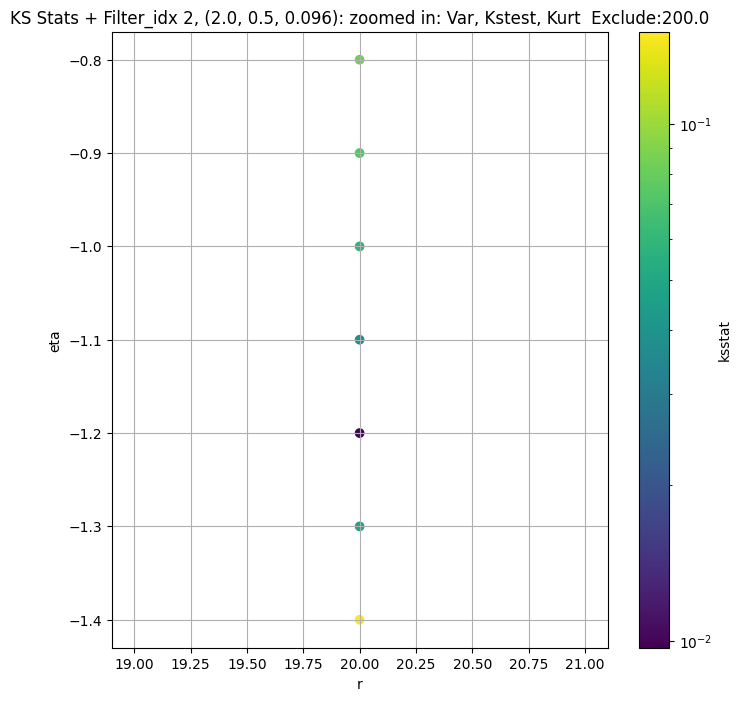

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + 100 = 150, ksstat: 0.007734033033037102, var: 6.066666126251221


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + 75 = 125, ksstat: 0.008003678832173233, var: 6.187255859375


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + 50 = 100, ksstat: 0.008022332254826625, var: 6.321944713592529


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + 25 = 75, ksstat: 0.007360508171860514, var: 6.476105213165283


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + 0 = 50, ksstat: 0.007470965376752903, var: 6.659602165222168


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + -25 = 25, ksstat: 0.007430182263378993, var: 6.896223068237305


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 50.0 + -50 = 0, ksstat: 0.007639117213845914, var: 7.416365623474121
Number of samples: 100000, Without approximation : 160000000.0


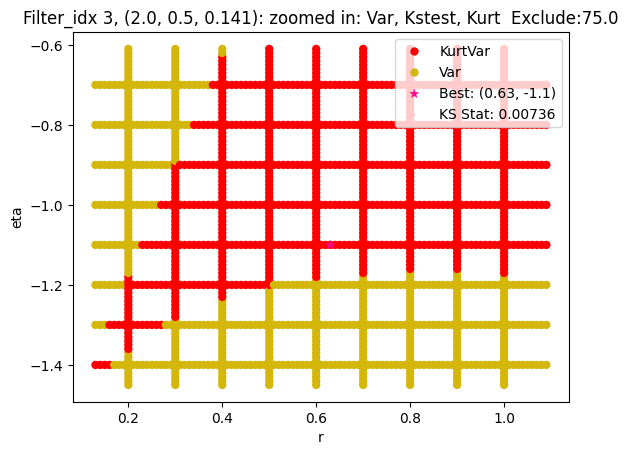

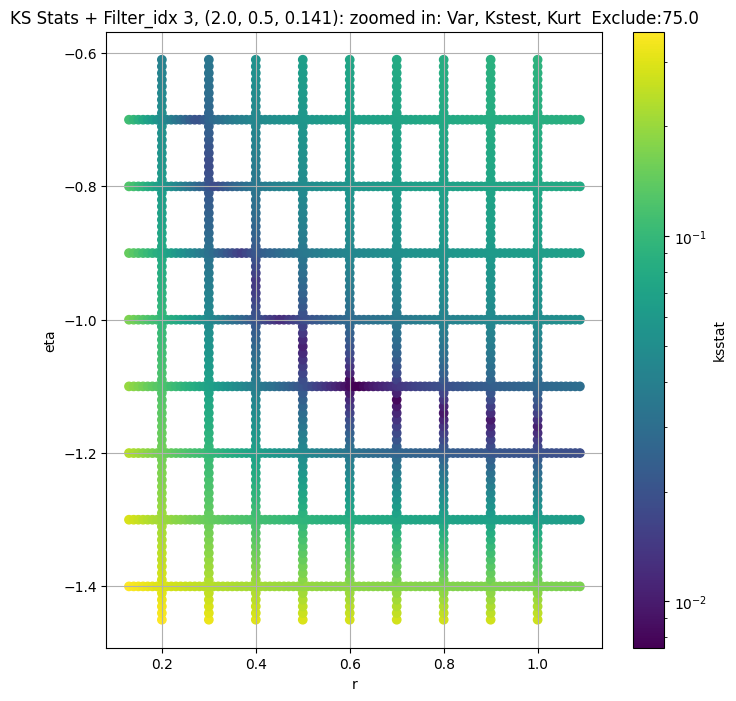

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + 100 = 150, ksstat: 0.007145260444363144, var: 2.5387465953826904


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + 75 = 125, ksstat: 0.007738735328976676, var: 2.5936105251312256


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + 50 = 100, ksstat: 0.007539548955710296, var: 2.655162811279297


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + 25 = 75, ksstat: 0.0070168533868071314, var: 2.725982666015625


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + 0 = 50, ksstat: 0.006542318858299034, var: 2.8107528686523438


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + -25 = 25, ksstat: 0.005765107292290739, var: 2.9211177825927734


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 50.0 + -50 = 0, ksstat: 0.006415257382031081, var: 3.177795648574829
Number of samples: 100000, Without approximation : 160000000.0


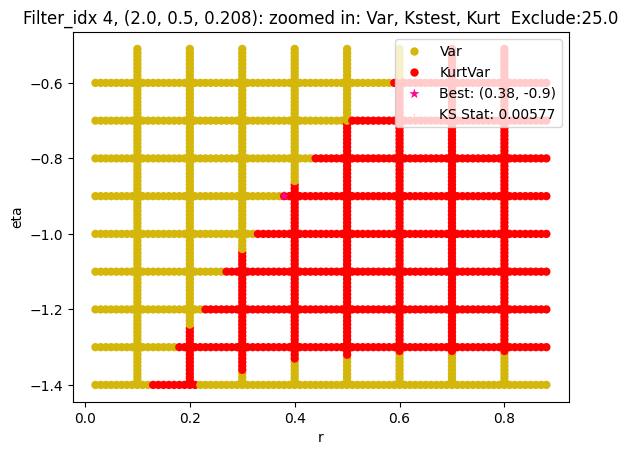

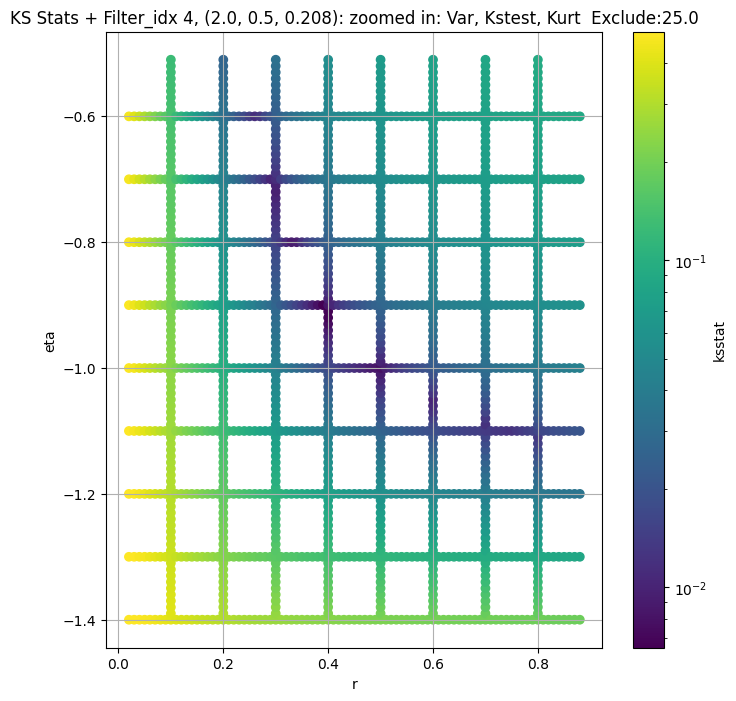

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 100 = 100, ksstat: 0.008151426452224081, var: 0.7507537007331848


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 75 = 75, ksstat: 0.006974329933309598, var: 0.7720867395401001


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 50 = 50, ksstat: 0.006592512073502088, var: 0.7978631854057312


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 25 = 25, ksstat: 0.005658538863919704, var: 0.8318567872047424


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 0 = 0, ksstat: 0.003617549167065179, var: 0.9182584881782532
Number of samples: 100000, Without approximation : 160000000.0


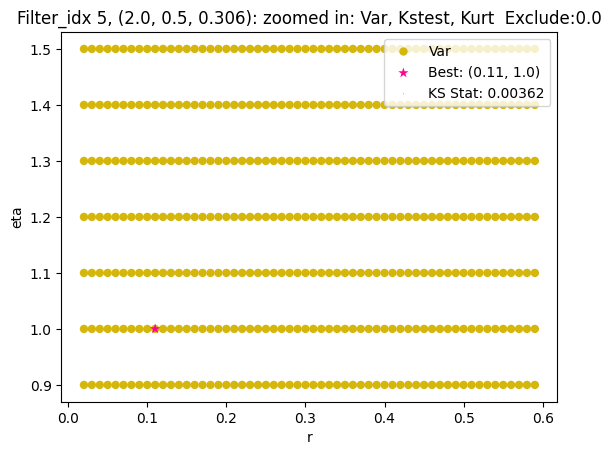

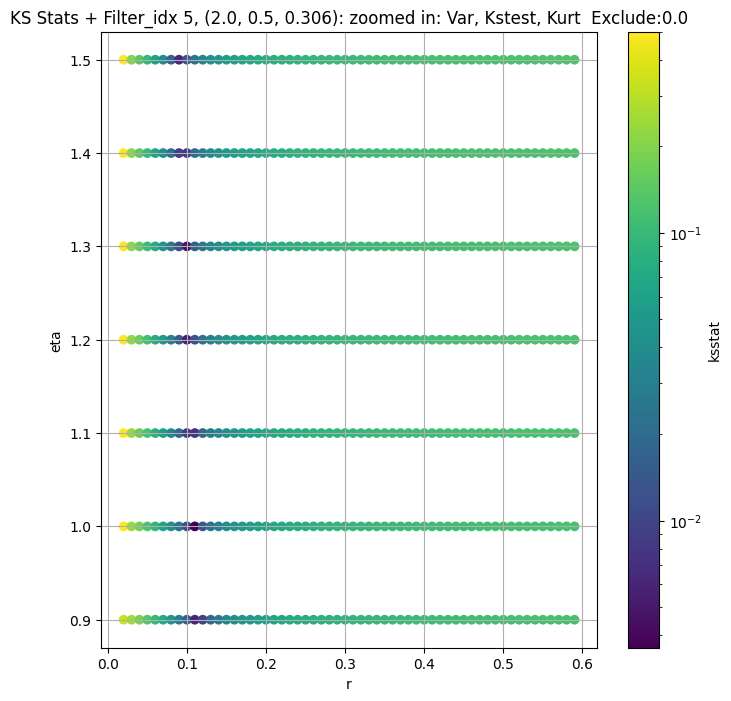

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 100 = 100, ksstat: 0.00672082172683941, var: 0.4786286950111389


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 75 = 75, ksstat: 0.006007143506992607, var: 0.4913039207458496


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 50 = 50, ksstat: 0.00583800399544486, var: 0.5065717101097107


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 25 = 25, ksstat: 0.00486651648526934, var: 0.5266709923744202


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 0 = 0, ksstat: 0.0028241230470426038, var: 0.581501305103302
Number of samples: 100000, Without approximation : 160000000.0


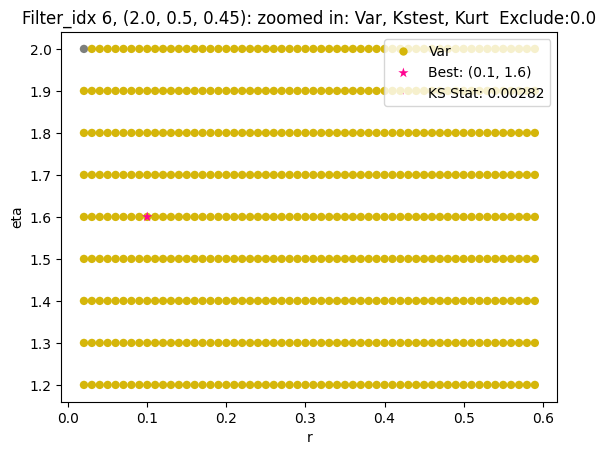

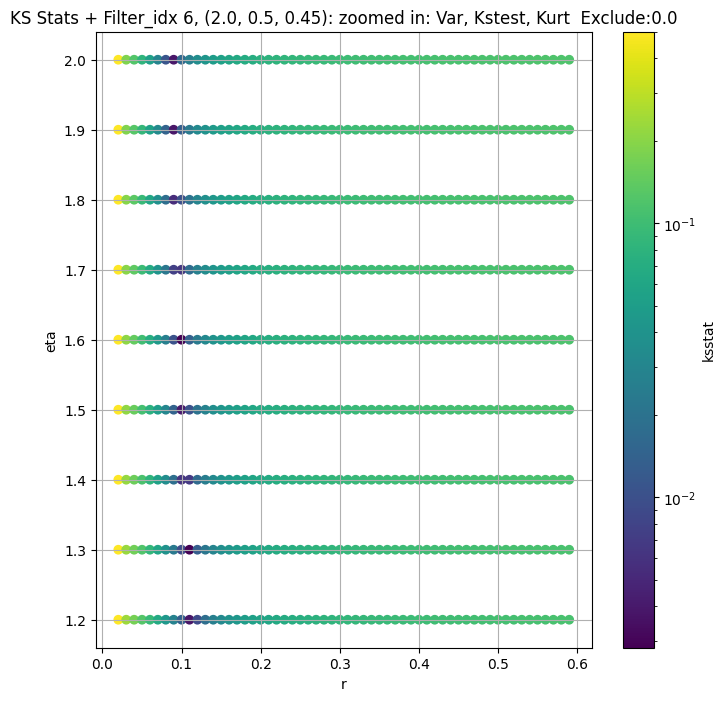

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + 100 = 200, ksstat: 0.009185405599432594, var: 115.8950424194336


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + 75 = 175, ksstat: 0.009427775400364102, var: 117.3606948852539


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + 50 = 150, ksstat: 0.0092464464630731, var: 118.93225860595703


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + 25 = 125, ksstat: 0.009132679527594778, var: 120.63693237304688


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + 0 = 100, ksstat: 0.008234167134173576, var: 122.51272583007812


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + -25 = 75, ksstat: 0.008391682239182185, var: 124.62138366699219


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + -50 = 50, ksstat: 0.008069195040977417, var: 127.08055877685547


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + -75 = 25, ksstat: 0.007653583700657829, var: 130.1719207763672


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 7, 100.0 + -100 = 0, ksstat: 0.007052385890028434, var: 135.9137725830078
Number of samples: 100000, Without approximation : 160000000.0


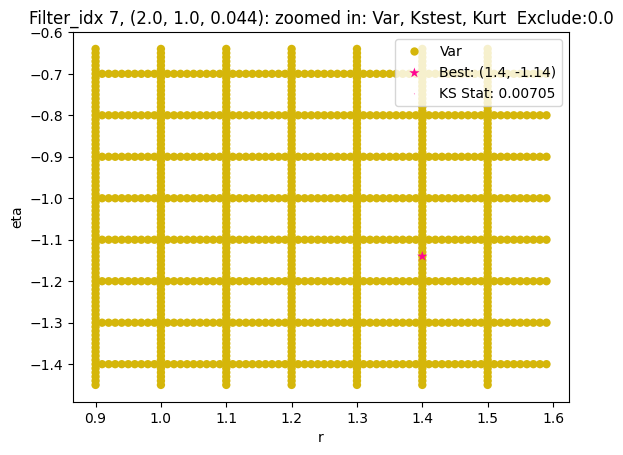

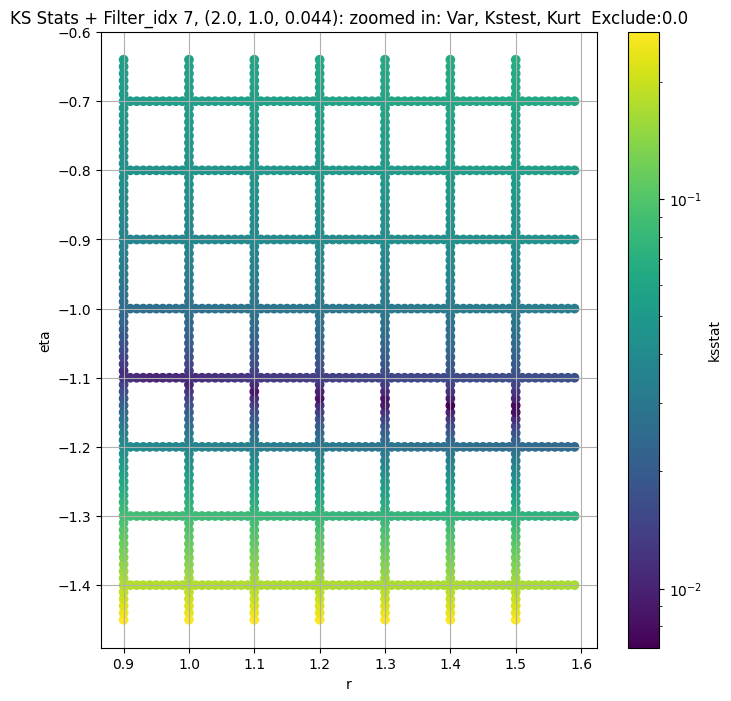

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + 100 = 150, ksstat: 0.01304463305239556, var: 49.81166076660156


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + 75 = 125, ksstat: 0.012328975817321397, var: 50.62264633178711


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + 50 = 100, ksstat: 0.011554481370973202, var: 51.521522521972656


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + 25 = 75, ksstat: 0.01070439418041702, var: 52.54161834716797


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + 0 = 50, ksstat: 0.009729751304761391, var: 53.74634552001953


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + -25 = 25, ksstat: 0.010969462560863064, var: 55.290626525878906


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 8, 50.0 + -50 = 0, ksstat: 0.014519519574645479, var: 58.51668930053711
Number of samples: 100000, Without approximation : 160000000.0


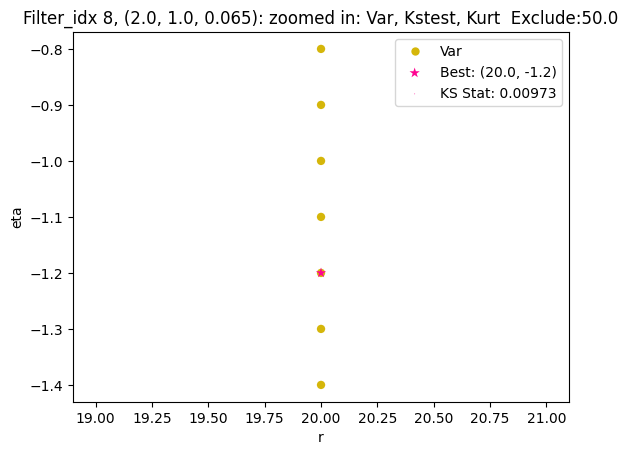

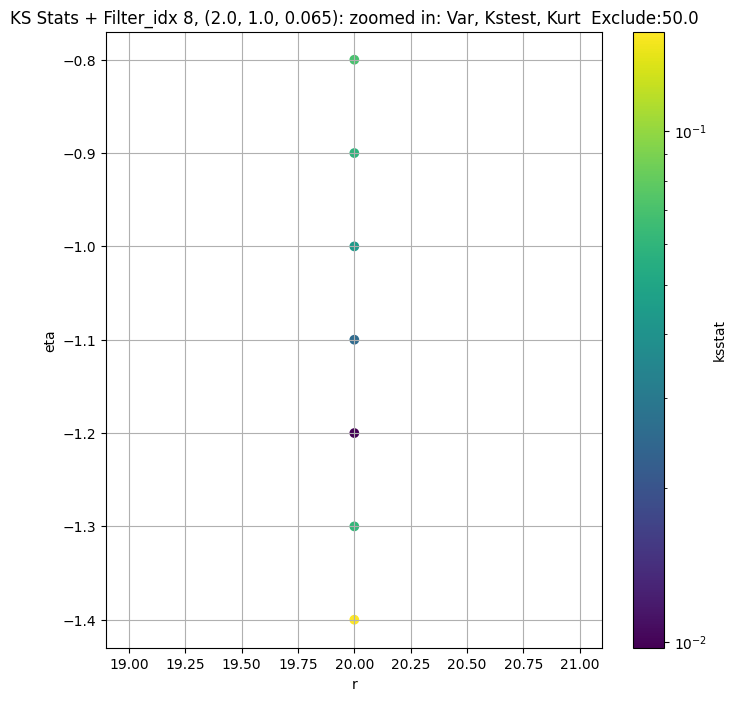

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + 100 = 200, ksstat: 0.010690328678529037, var: 23.14726448059082


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + 75 = 175, ksstat: 0.010572345451698717, var: 23.50823402404785


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + 50 = 150, ksstat: 0.010447556650651113, var: 23.898386001586914


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + 25 = 125, ksstat: 0.010314788474243719, var: 24.32450294494629


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + 0 = 100, ksstat: 0.010219930384506692, var: 24.797374725341797


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + -25 = 75, ksstat: 0.011193880083372368, var: 25.33366584777832


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + -50 = 50, ksstat: 0.012758366283777911, var: 25.965089797973633


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + -75 = 25, ksstat: 0.014695441945484028, var: 26.767654418945312


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 9, 100.0 + -100 = 0, ksstat: 0.019009375346653368, var: 28.640981674194336
Number of samples: 100000, Without approximation : 160000000.0


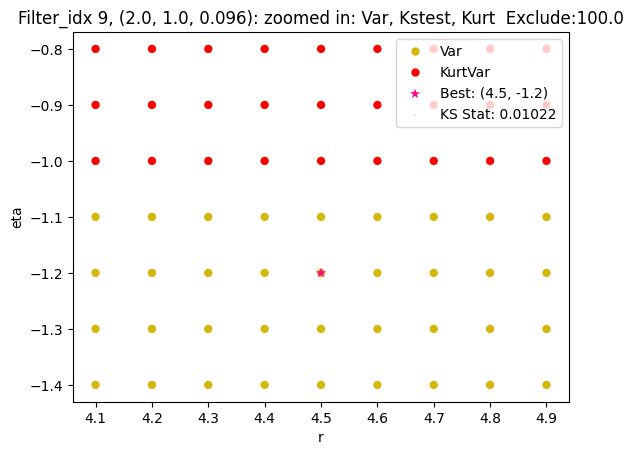

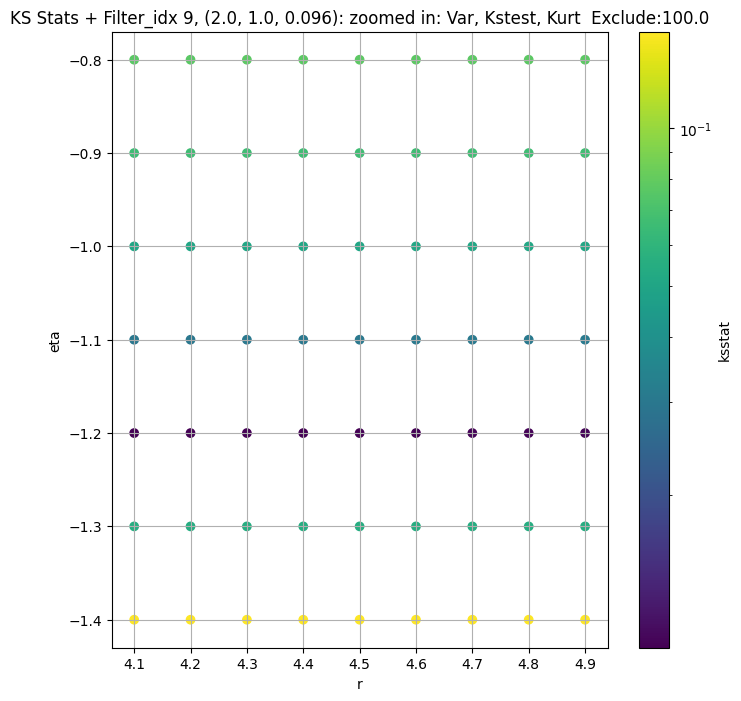

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.008027030071093122, var: 9.148301124572754


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.0072437739051518235, var: 9.329989433288574


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.0069688431204066315, var: 9.53277587890625


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.007656037532586257, var: 9.764629364013672


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.0077361763719878684, var: 10.04078483581543


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.007211964198957199, var: 10.397608757019043


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.006841240269324311, var: 11.19669246673584
Number of samples: 100000, Without approximation : 160000000.0


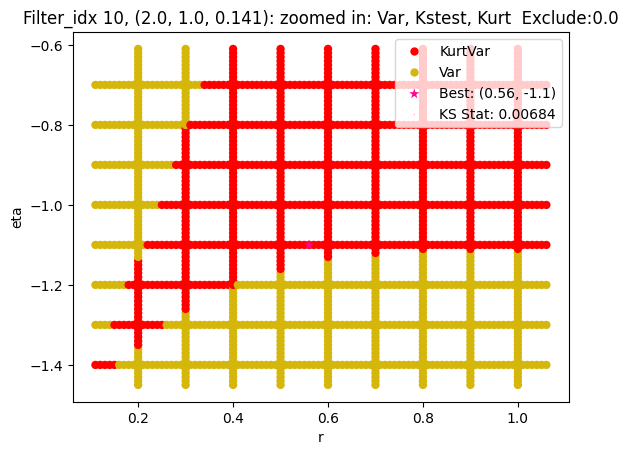

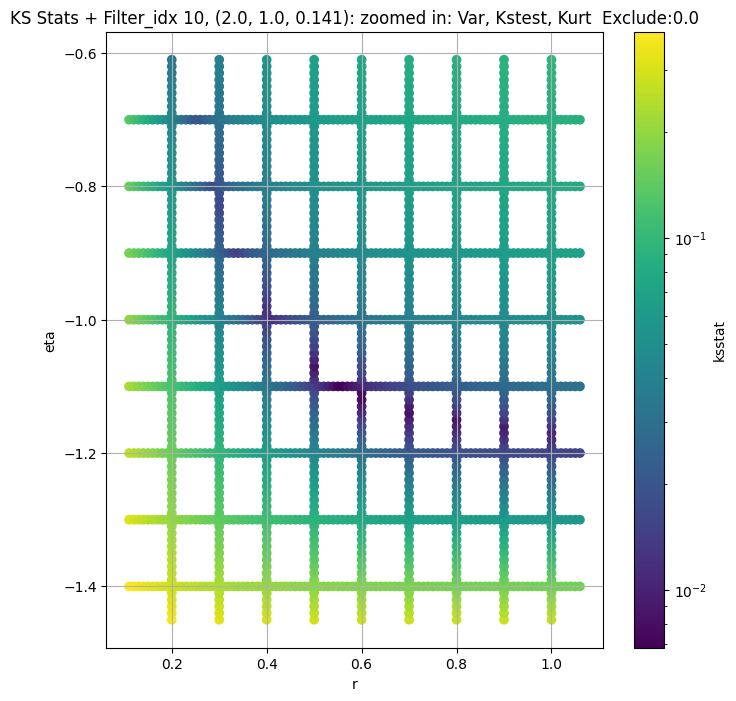

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + 100 = 300, ksstat: 0.008375744503207008, var: 3.0176093578338623


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + 75 = 275, ksstat: 0.008218433306743655, var: 3.063701629638672


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + 50 = 250, ksstat: 0.00800020550914271, var: 3.1125268936157227


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + 25 = 225, ksstat: 0.007776654352734169, var: 3.164499044418335


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + 0 = 200, ksstat: 0.008331003347439414, var: 3.2201578617095947


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + -25 = 175, ksstat: 0.007909564018046433, var: 3.280221939086914


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + -50 = 150, ksstat: 0.0073449312220122825, var: 3.3455934524536133


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + -75 = 125, ksstat: 0.007200668053553683, var: 3.417581558227539


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 200.0 + -100 = 100, ksstat: 0.006865416893241799, var: 3.4981942176818848
Number of samples: 100000, Without approximation : 160000000.0


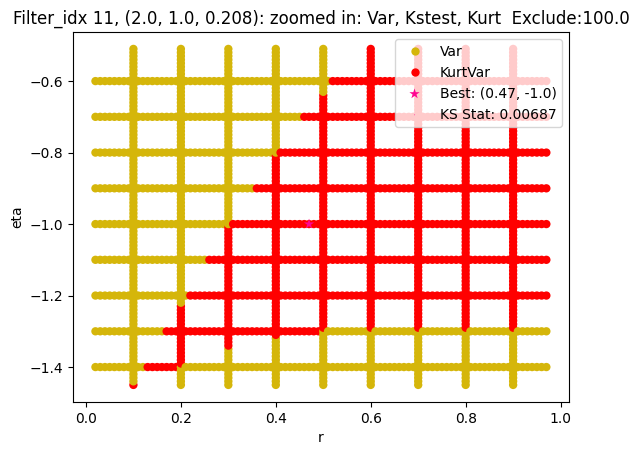

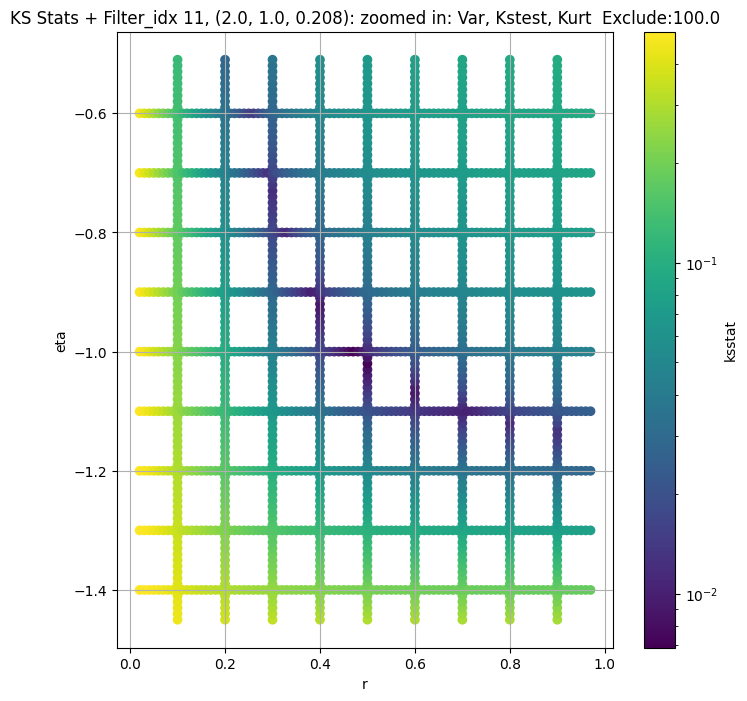

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 0.0 + 100 = 100, ksstat: 0.01061206144740684, var: 1.2689573764801025


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 0.0 + 75 = 75, ksstat: 0.009679883001921685, var: 1.305753469467163


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 0.0 + 50 = 50, ksstat: 0.009798264693647307, var: 1.3501245975494385


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 0.0 + 25 = 25, ksstat: 0.008334804443131338, var: 1.408275842666626


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 0.0 + 0 = 0, ksstat: 0.006824227961010967, var: 1.5553946495056152
Number of samples: 100000, Without approximation : 160000000.0


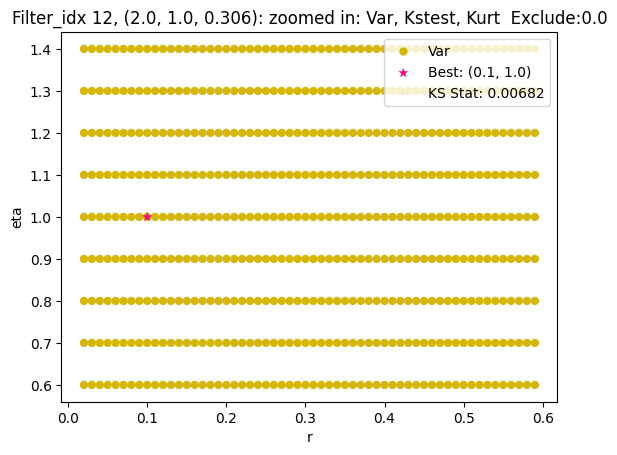

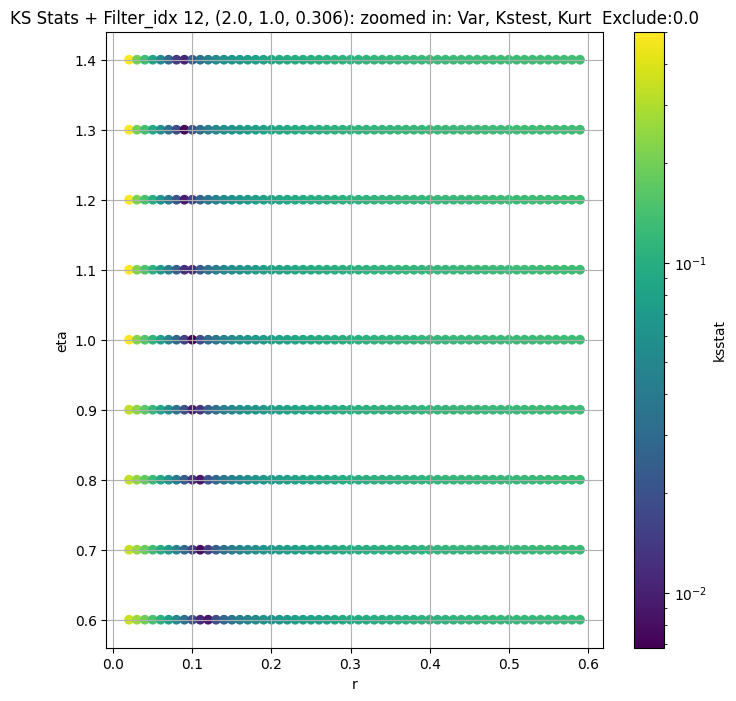

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 100 = 100, ksstat: 0.006211467798871717, var: 0.4865047335624695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 75 = 75, ksstat: 0.005704167672658411, var: 0.4992438554763794


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 50 = 50, ksstat: 0.00509903492156405, var: 0.5146322250366211


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 25 = 25, ksstat: 0.004150045307290351, var: 0.5349202156066895


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 0 = 0, ksstat: 0.002801128341911374, var: 0.5893730521202087
Number of samples: 100000, Without approximation : 160000000.0


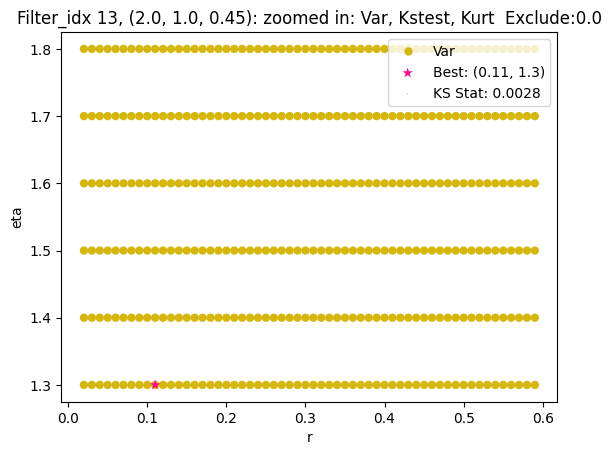

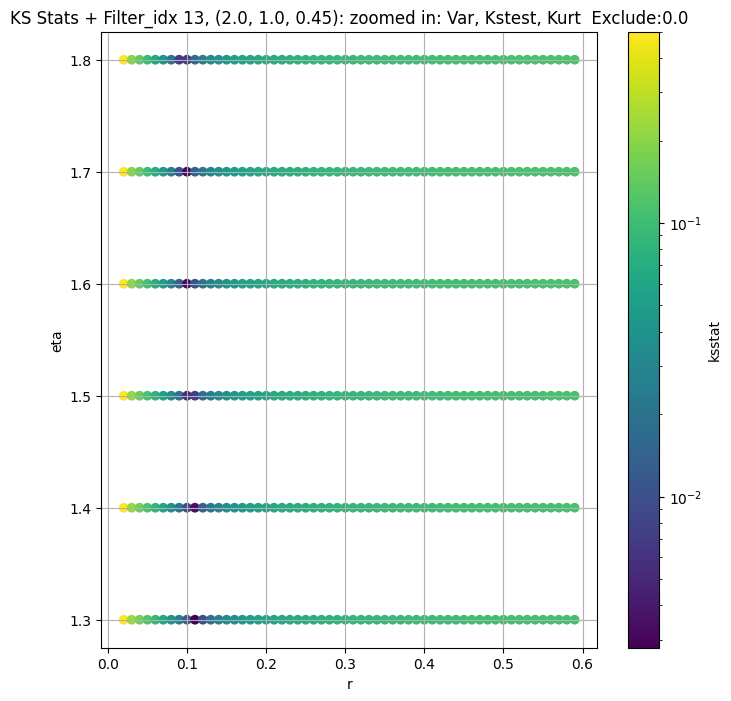

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + 100 = 150, ksstat: 0.010546743420621119, var: 89.47105407714844


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + 75 = 125, ksstat: 0.010424780122283095, var: 90.83269500732422


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + 50 = 100, ksstat: 0.010293132541775218, var: 92.33065795898438


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + 25 = 75, ksstat: 0.010148160072931511, var: 94.01364135742188


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + 0 = 50, ksstat: 0.009983416655833466, var: 95.97049713134766


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + -25 = 25, ksstat: 0.009790986610819952, var: 98.42552947998047


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 14, 50.0 + -50 = 0, ksstat: 0.01254456698063422, var: 103.26244354248047
Number of samples: 100000, Without approximation : 160000000.0


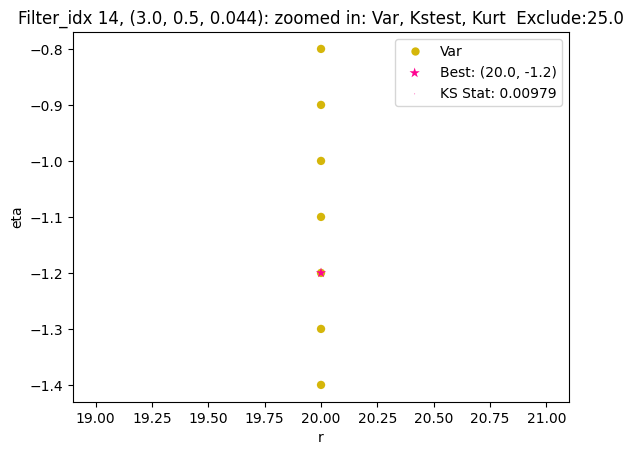

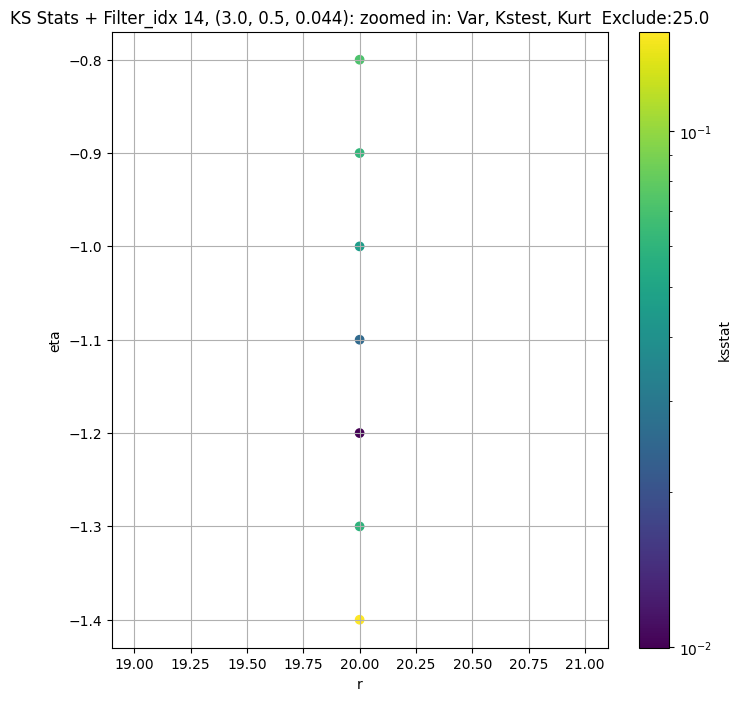

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + 100 = 300, ksstat: 0.00866237414684845, var: 37.02400588989258


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + 75 = 275, ksstat: 0.008590383125564705, var: 37.4609375


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + 50 = 250, ksstat: 0.008516450097261652, var: 37.91901397705078


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + 25 = 225, ksstat: 0.00844021524946309, var: 38.40120315551758


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + 0 = 200, ksstat: 0.008437494001863333, var: 38.911033630371094


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + -25 = 175, ksstat: 0.008457220150239697, var: 39.453372955322266


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + -50 = 150, ksstat: 0.008683435779843318, var: 40.03461456298828


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + -75 = 125, ksstat: 0.009039948479170334, var: 40.66371536254883


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 15, 200.0 + -100 = 100, ksstat: 0.00942881846222754, var: 41.35384750366211
Number of samples: 100000, Without approximation : 160000000.0


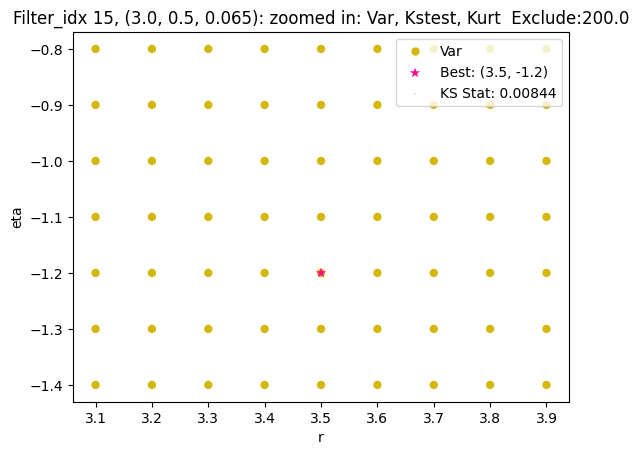

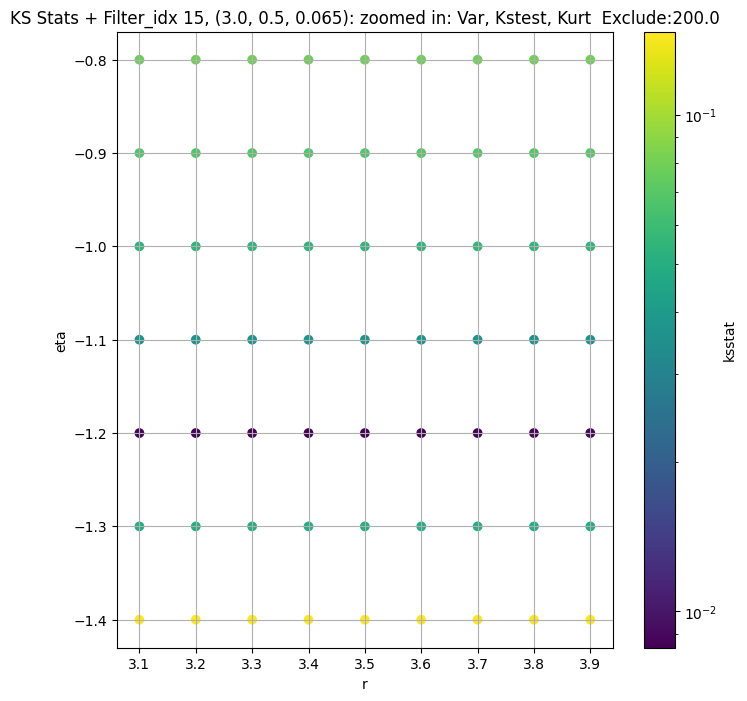

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + 100 = 300, ksstat: 0.009095974010585817, var: 15.23392391204834


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + 75 = 275, ksstat: 0.009927012450396677, var: 15.441720962524414


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + 50 = 250, ksstat: 0.010529160996096687, var: 15.660966873168945


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + 25 = 225, ksstat: 0.010419590801983347, var: 15.893348693847656


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + 0 = 200, ksstat: 0.01036698927775176, var: 16.141014099121094


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + -25 = 175, ksstat: 0.01067602814692406, var: 16.406646728515625


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + -50 = 150, ksstat: 0.01177698587276943, var: 16.693769454956055


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + -75 = 125, ksstat: 0.012058696507920408, var: 17.007156372070312


  0%|          | 0/138 [00:00<?, ?it/s]

Finding Minimum after computing 138 CDFs
filter_idx 16, 200.0 + -100 = 100, ksstat: 0.012646916985049134, var: 17.353918075561523
Number of samples: 100000, Without approximation : 160000000.0


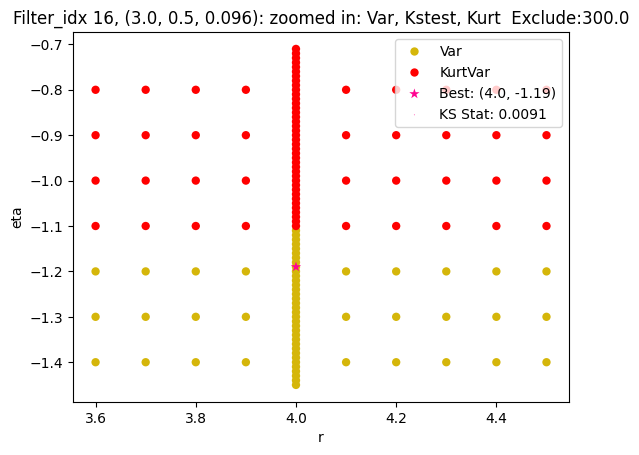

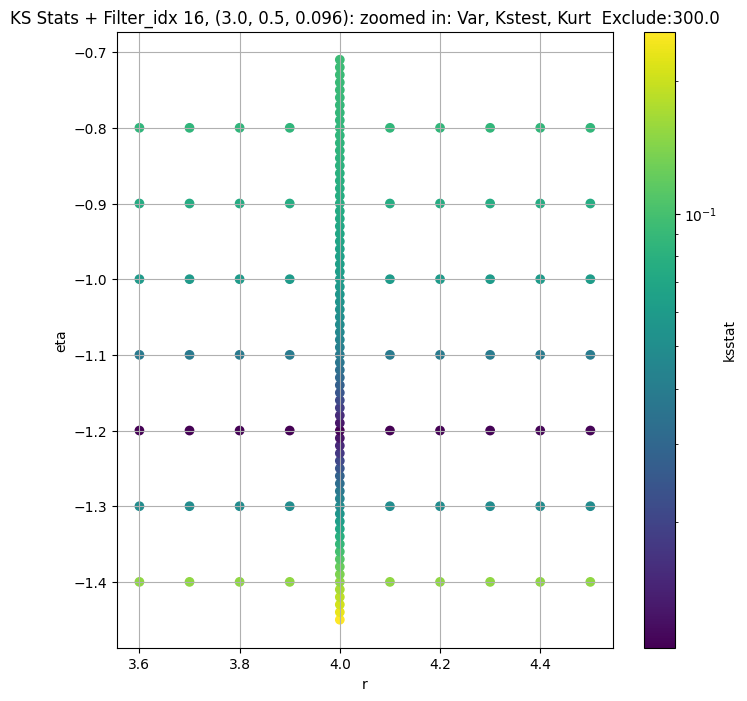

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.007965393025069989, var: 7.050454139709473


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.00795235356831725, var: 7.231195449829102


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.008028075515587096, var: 7.445242881774902


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.00791979815875199, var: 7.718990802764893


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.008196591262685515, var: 8.31928825378418
Number of samples: 100000, Without approximation : 160000000.0


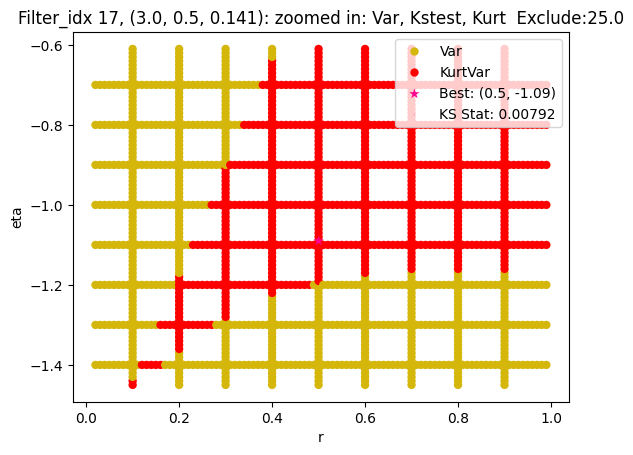

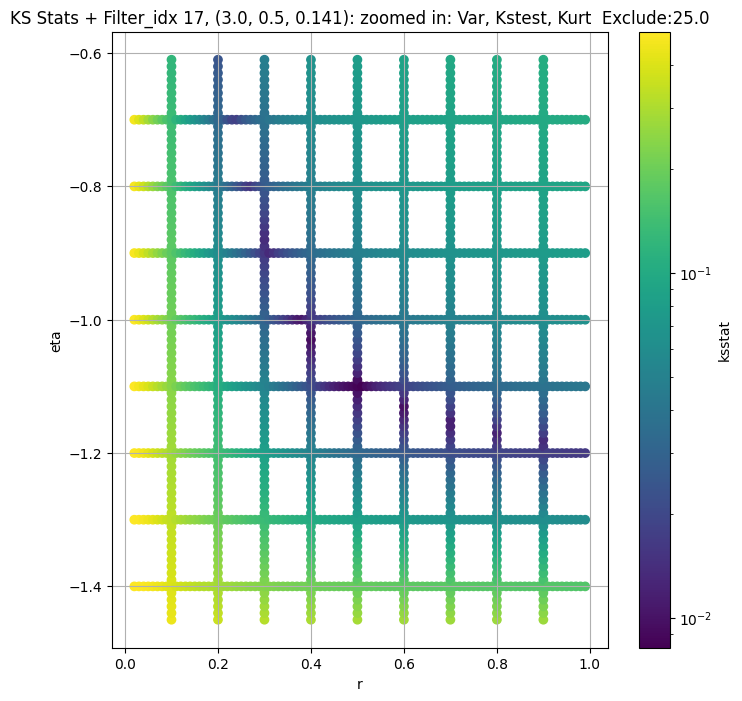

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + 100 = 200, ksstat: 0.009012108133860053, var: 2.4077844619750977


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + 75 = 175, ksstat: 0.00864500139710589, var: 2.4573757648468018


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + 50 = 150, ksstat: 0.007881986204136882, var: 2.511584520339966


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + 25 = 125, ksstat: 0.008111455402965206, var: 2.5715577602386475


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + 0 = 100, ksstat: 0.008328292049441882, var: 2.639064311981201


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + -25 = 75, ksstat: 0.008276579358023714, var: 2.7170298099517822


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + -50 = 50, ksstat: 0.0073823788240341415, var: 2.8110220432281494


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + -75 = 25, ksstat: 0.007134594031643404, var: 2.9340219497680664


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 100.0 + -100 = 0, ksstat: 0.006812161519949511, var: 3.2307114601135254
Number of samples: 100000, Without approximation : 160000000.0


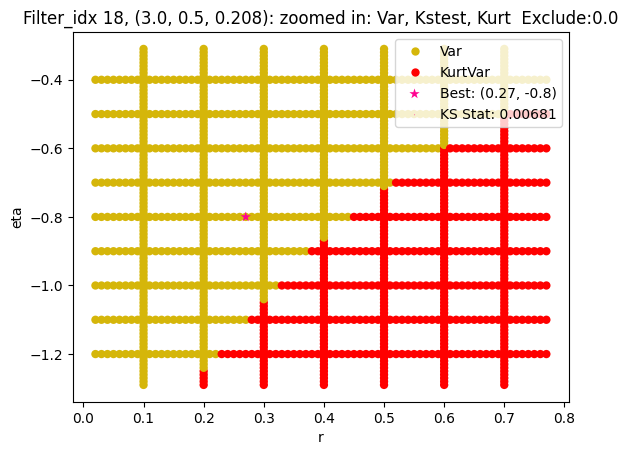

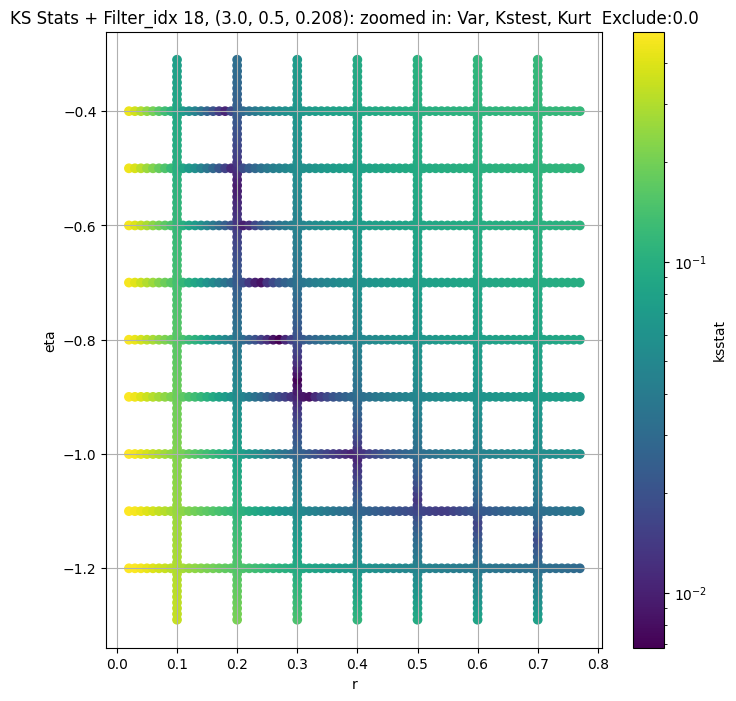

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 100 = 100, ksstat: 0.006298841103244968, var: 0.7715246081352234


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 75 = 75, ksstat: 0.006062639436626618, var: 0.7952645421028137


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 50 = 50, ksstat: 0.005509129647738975, var: 0.8241137862205505


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 25 = 25, ksstat: 0.00394684237113356, var: 0.8626102805137634


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 0 = 0, ksstat: 0.002983925108832275, var: 0.967520534992218
Number of samples: 100000, Without approximation : 160000000.0


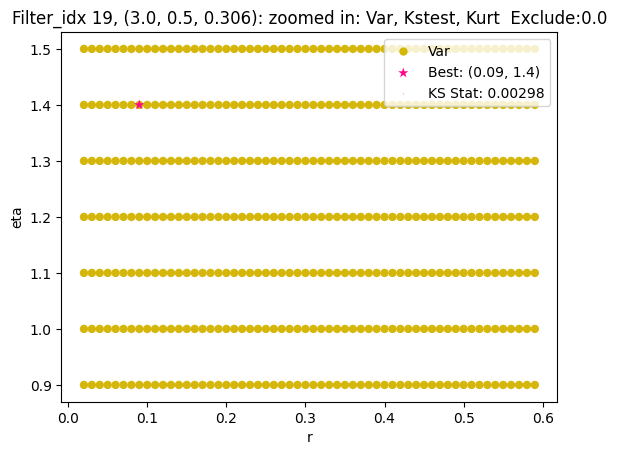

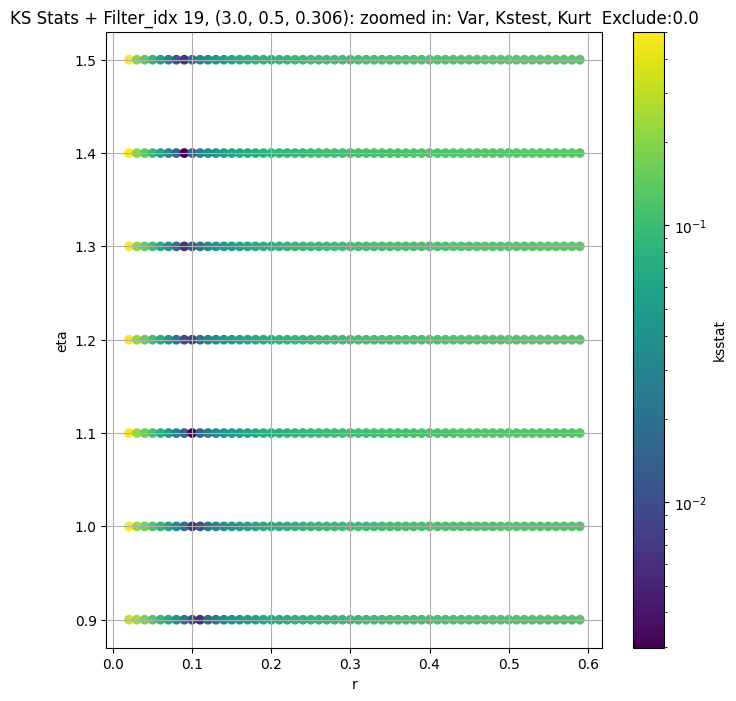

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 100 = 150, ksstat: 0.004660987294537344, var: 0.2632356882095337


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 75 = 125, ksstat: 0.004079473400603106, var: 0.2691515386104584


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 50 = 100, ksstat: 0.0036968854333213896, var: 0.27588754892349243


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 25 = 75, ksstat: 0.0029020366207629794, var: 0.283786416053772


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 0 = 50, ksstat: 0.001922164638157975, var: 0.2935185134410858


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + -25 = 25, ksstat: 0.0017081693897450512, var: 0.3068174421787262


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + -50 = 0, ksstat: 0.0030788912704582116, var: 0.3483136296272278
Number of samples: 100000, Without approximation : 160000000.0


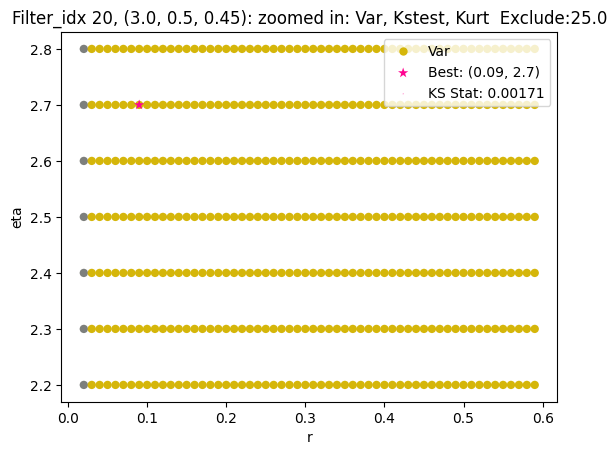

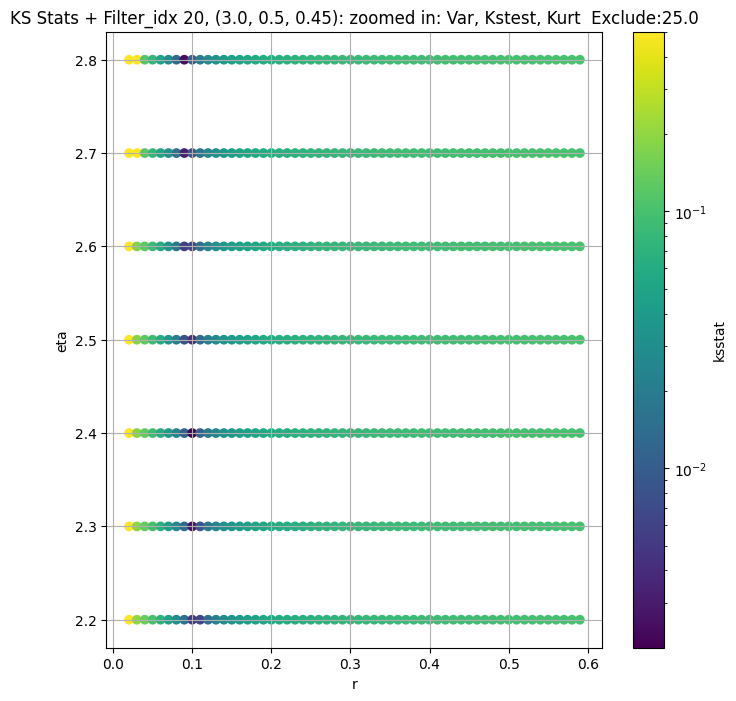

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + 100 = 150, ksstat: 0.010460298691222392, var: 95.4413833618164


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + 75 = 125, ksstat: 0.01034466632740244, var: 96.96221923828125


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + 50 = 100, ksstat: 0.01021986018214932, var: 98.63874053955078


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + 25 = 75, ksstat: 0.010082337841901379, var: 100.52933502197266


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + 0 = 50, ksstat: 0.009953800964268011, var: 102.73838806152344


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + -25 = 25, ksstat: 0.011419796175715091, var: 105.52313232421875


  0%|          | 0/63 [00:00<?, ?it/s]

Finding Minimum after computing 63 CDFs
filter_idx 21, 50.0 + -50 = 0, ksstat: 0.014713813430600076, var: 111.12750244140625
Number of samples: 100000, Without approximation : 160000000.0


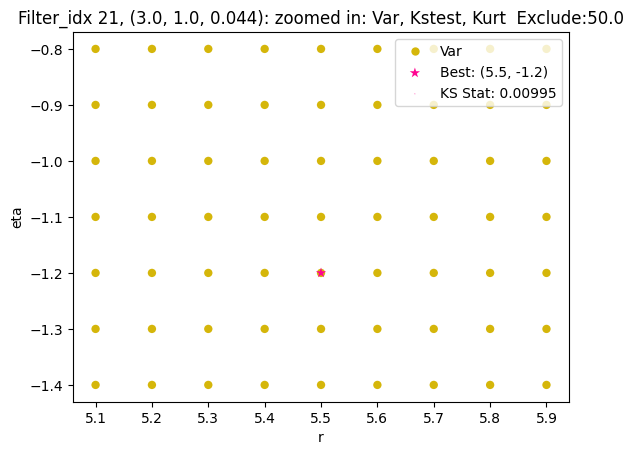

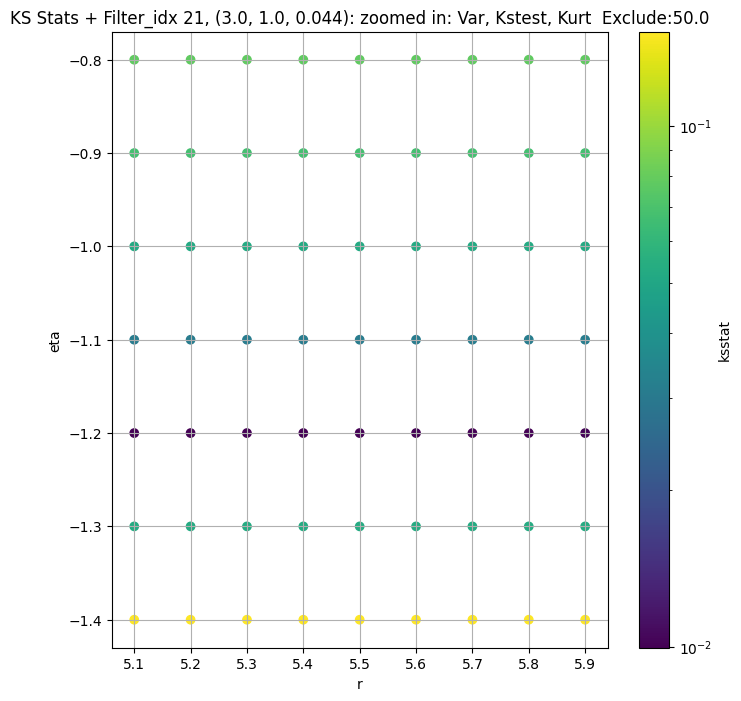

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + 100 = 200, ksstat: 0.009334966438758419, var: 41.46330642700195


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + 75 = 175, ksstat: 0.009241510402851927, var: 42.054954528808594


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + 50 = 150, ksstat: 0.009143718022969427, var: 42.69192123413086


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + 25 = 125, ksstat: 0.009041357933965988, var: 43.38493728637695


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + 0 = 100, ksstat: 0.008931140734966925, var: 44.149898529052734


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + -25 = 75, ksstat: 0.009948828155274758, var: 45.013484954833984


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + -50 = 50, ksstat: 0.011375288501536018, var: 46.024620056152344


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + -75 = 25, ksstat: 0.013127306351736645, var: 47.296932220458984


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 100.0 + -100 = 0, ksstat: 0.01657504462126691, var: 49.90227127075195
Number of samples: 100000, Without approximation : 160000000.0


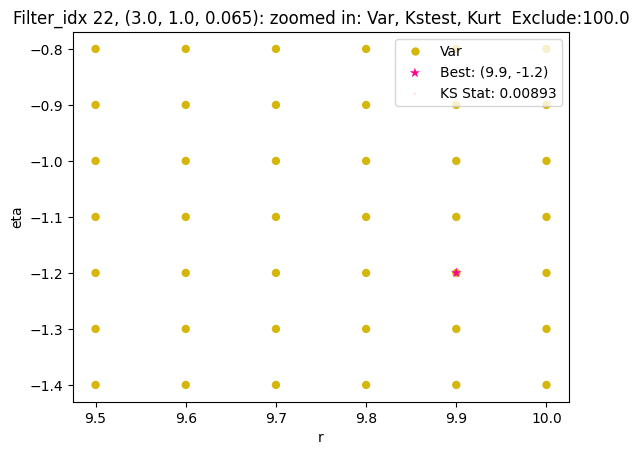

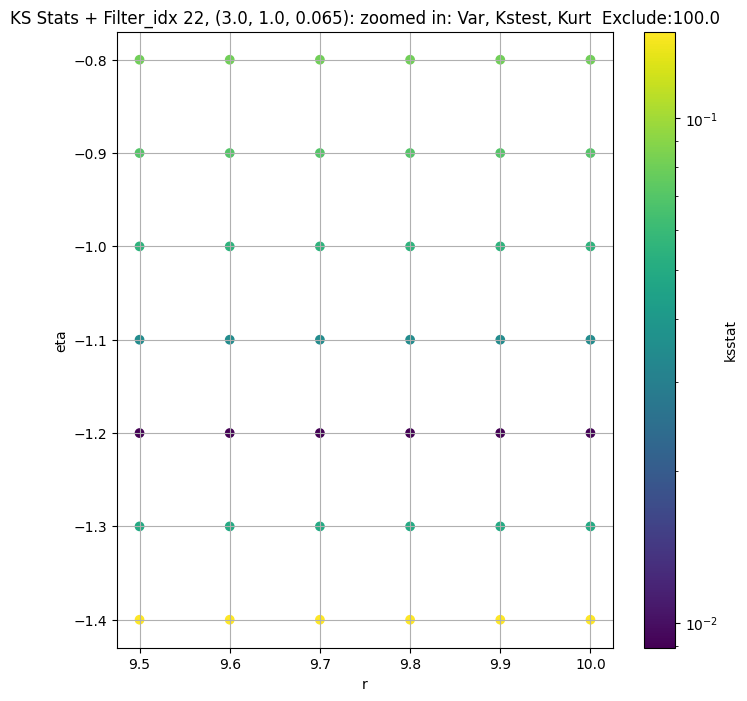

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + 100 = 200, ksstat: 0.009132298031448771, var: 19.20173454284668


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + 75 = 175, ksstat: 0.009295309288900544, var: 19.51370620727539


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + 50 = 150, ksstat: 0.009207979684408896, var: 19.849885940551758


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + 25 = 125, ksstat: 0.009212130297316157, var: 20.21583366394043


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + 0 = 100, ksstat: 0.009749011004110297, var: 20.62025260925293


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + -25 = 75, ksstat: 0.009838665803691804, var: 21.07697296142578


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + -50 = 50, ksstat: 0.00988572177449637, var: 21.610492706298828


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + -75 = 25, ksstat: 0.009993988933123865, var: 22.2791748046875


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 23, 100.0 + -100 = 0, ksstat: 0.010183945312957188, var: 23.767887115478516
Number of samples: 100000, Without approximation : 160000000.0


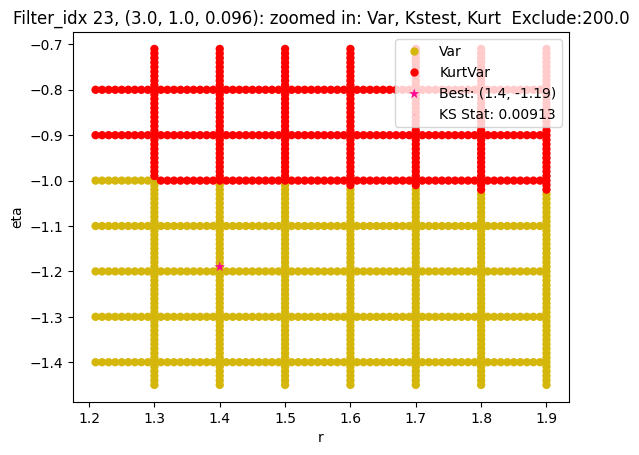

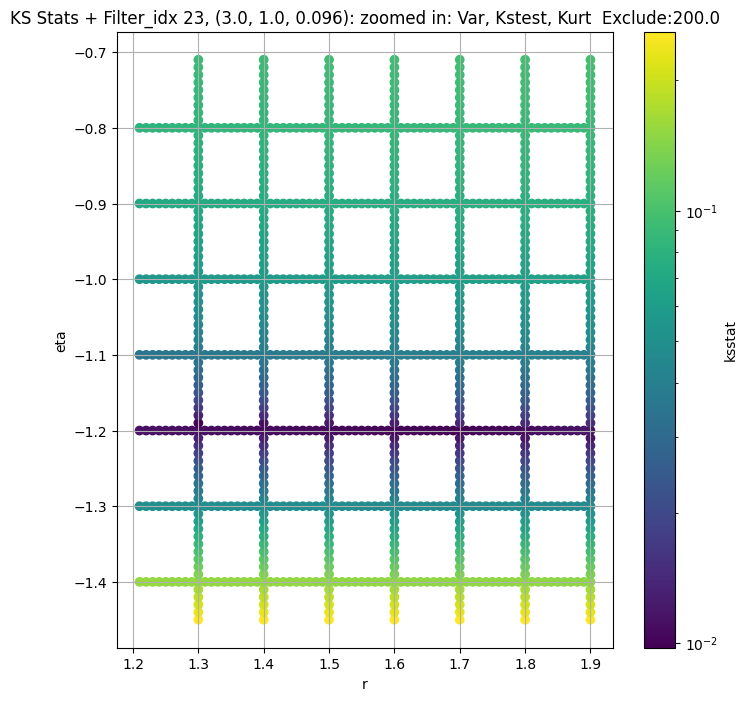

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 0.0 + 100 = 100, ksstat: 0.007850096984677313, var: 7.853282928466797


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 0.0 + 75 = 75, ksstat: 0.007834651226968081, var: 8.058966636657715


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 0.0 + 50 = 50, ksstat: 0.007908083636884777, var: 8.303849220275879


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 0.0 + 25 = 25, ksstat: 0.007530034995363644, var: 8.619902610778809


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 0.0 + 0 = 0, ksstat: 0.007977778973590172, var: 9.408415794372559
Number of samples: 100000, Without approximation : 160000000.0


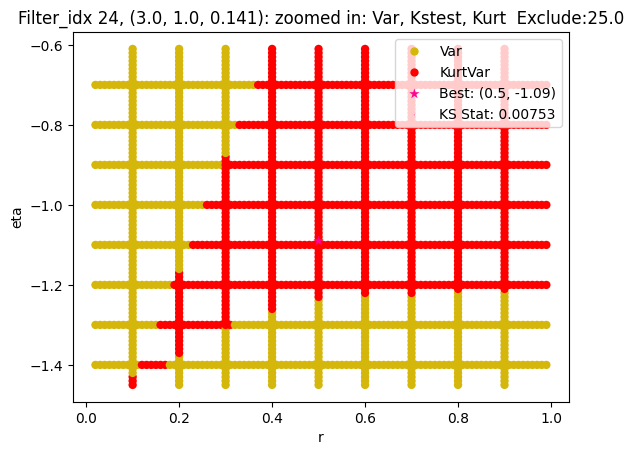

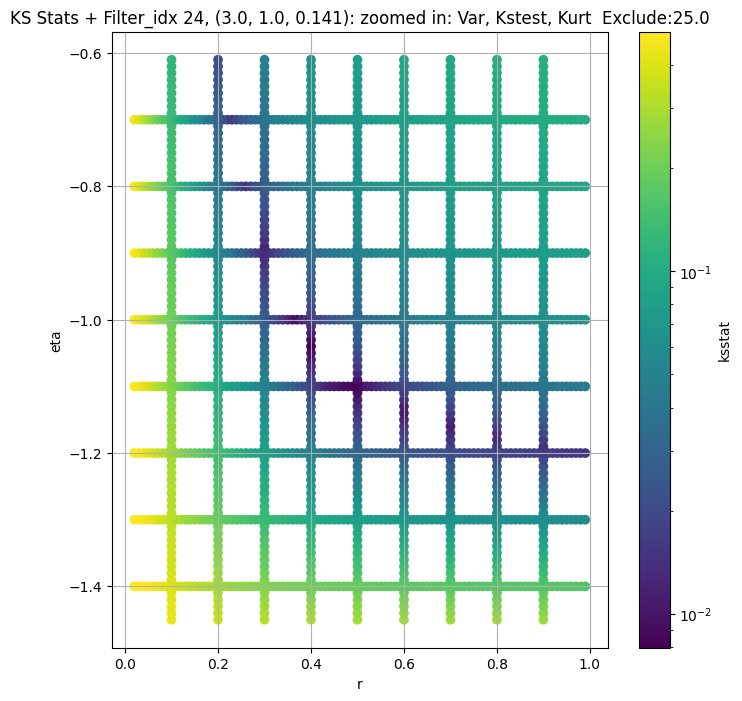

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 100 = 100, ksstat: 0.008681482843477917, var: 3.146853446960449


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 75 = 75, ksstat: 0.008822772821522218, var: 3.2379589080810547


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 50 = 50, ksstat: 0.008771845050538185, var: 3.3471591472625732


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 25 = 25, ksstat: 0.007618774094401148, var: 3.4894986152648926


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 0 = 0, ksstat: 0.007092091115701249, var: 3.8262505531311035
Number of samples: 100000, Without approximation : 160000000.0


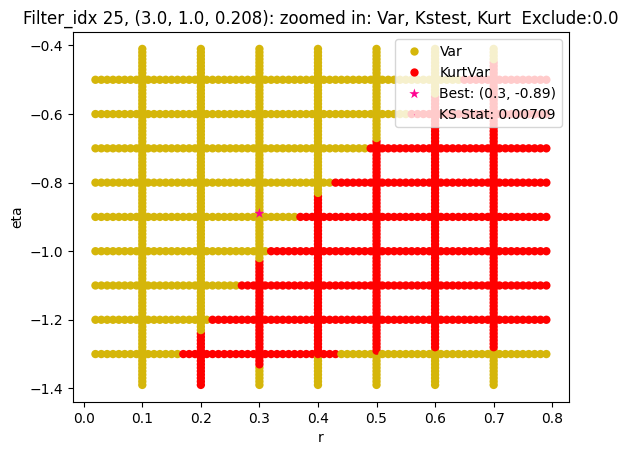

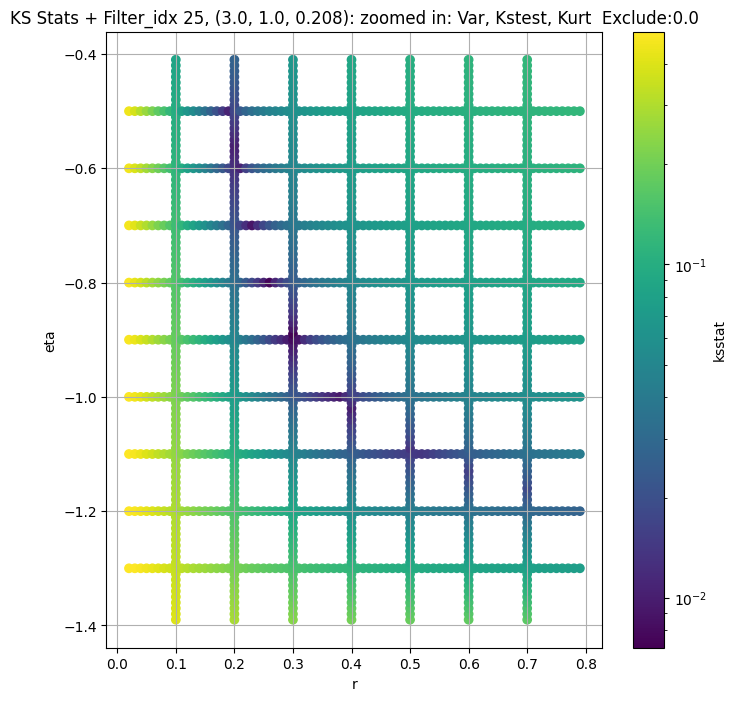

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + 100 = 200, ksstat: 0.005704494708360493, var: 0.8890377879142761


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + 75 = 175, ksstat: 0.005849006175175732, var: 0.9093917608261108


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + 50 = 150, ksstat: 0.00506251009295744, var: 0.931817352771759


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + 25 = 125, ksstat: 0.0050728183514737735, var: 0.9568508863449097


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + 0 = 100, ksstat: 0.0046401111707647935, var: 0.985344648361206


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + -25 = 75, ksstat: 0.004370402879628171, var: 1.0186700820922852


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + -50 = 50, ksstat: 0.0050730271818613115, var: 1.0594853162765503


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + -75 = 25, ksstat: 0.005874132797487164, var: 1.1143298149108887


  0%|          | 0/1131 [00:00<?, ?it/s]

Finding Minimum after computing 1131 CDFs
filter_idx 26, 100.0 + -100 = 0, ksstat: 0.007024027680333389, var: 1.269446611404419
Number of samples: 100000, Without approximation : 160000000.0


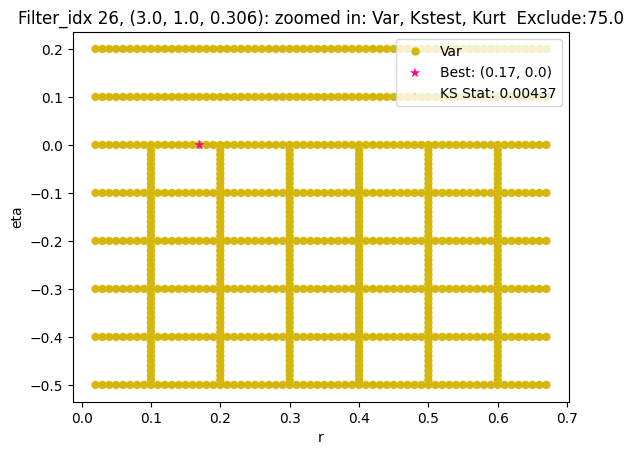

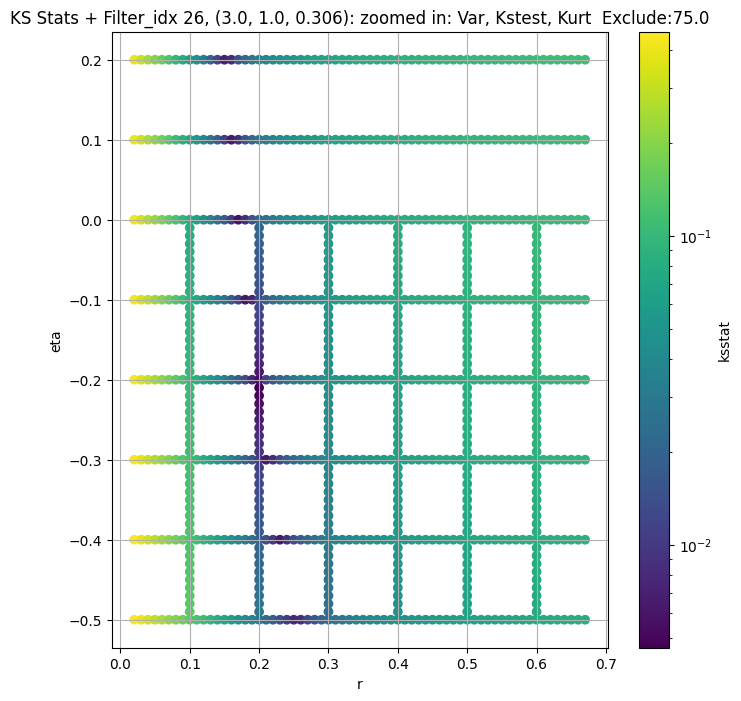

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 100 = 150, ksstat: 0.0053120246259360515, var: 0.2857019901275635


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 75 = 125, ksstat: 0.0044912131555663315, var: 0.29230424761772156


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 50 = 100, ksstat: 0.003873377177493399, var: 0.2998178005218506


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 25 = 75, ksstat: 0.003347971723688614, var: 0.3086141049861908


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 0 = 50, ksstat: 0.002400353114773761, var: 0.31941699981689453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -25 = 25, ksstat: 0.001967693480801891, var: 0.33407843112945557


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -50 = 0, ksstat: 0.0034263354887492936, var: 0.37881389260292053
Number of samples: 100000, Without approximation : 160000000.0


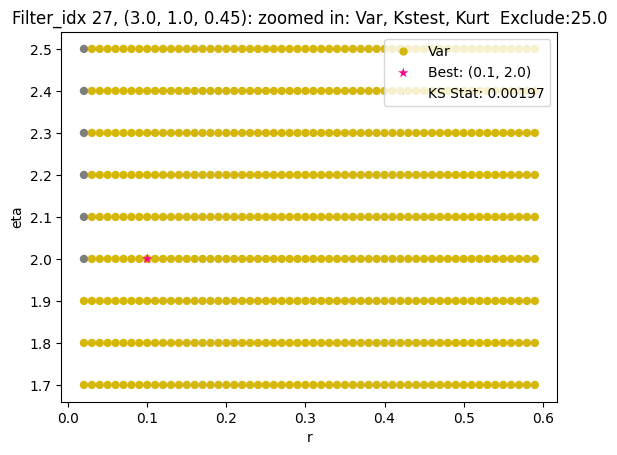

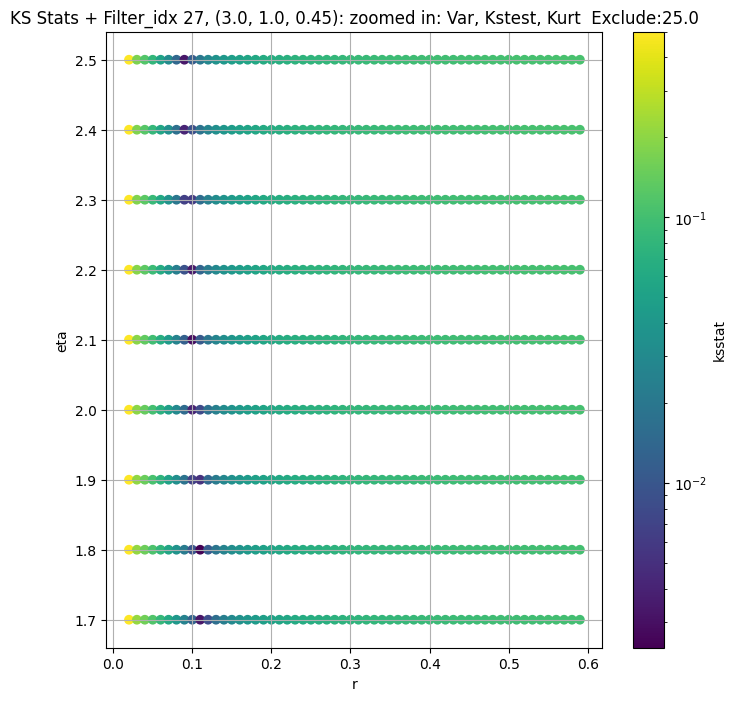

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 28, 0.0 + 100 = 100, ksstat: 0.007853670550447944, var: 85.91571807861328


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 28, 0.0 + 75 = 75, ksstat: 0.006770793957770971, var: 87.48497009277344


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 28, 0.0 + 50 = 50, ksstat: 0.006878406646554036, var: 89.30322265625


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 28, 0.0 + 25 = 25, ksstat: 0.00687611792085252, var: 91.56656646728516


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 28, 0.0 + 0 = 0, ksstat: 0.005805233532464371, var: 95.73262023925781
Number of samples: 100000, Without approximation : 160000000.0


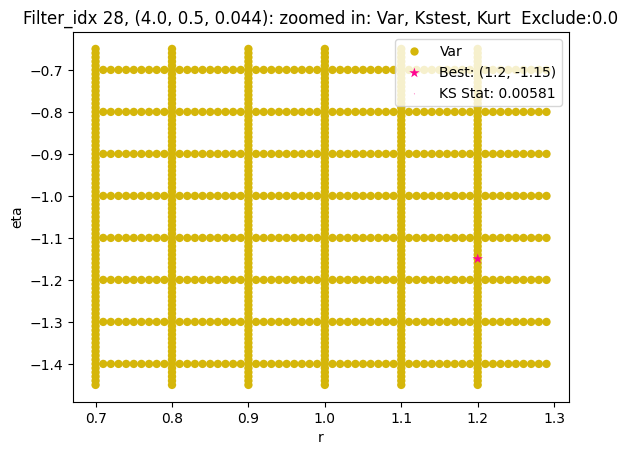

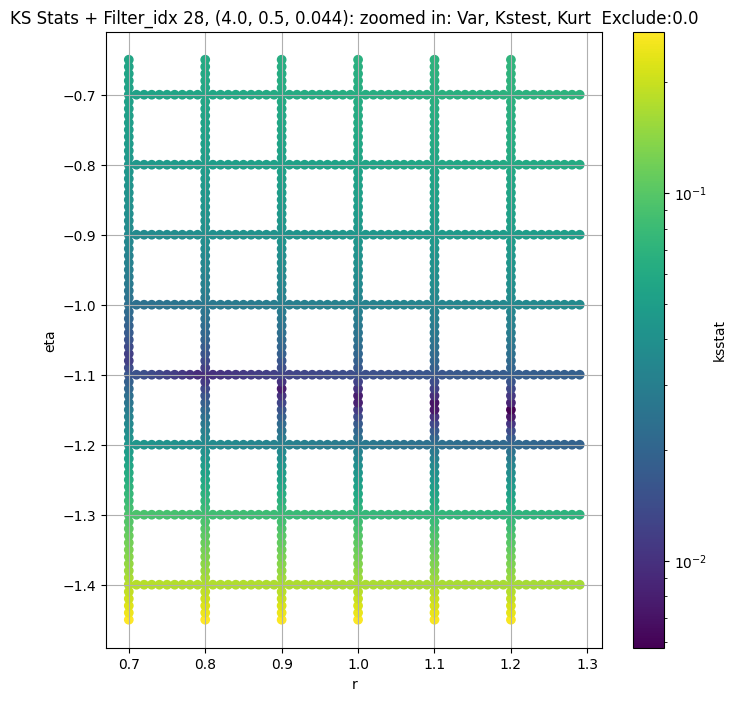

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.008991284958230983, var: 35.2762336730957


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.008899925097084038, var: 35.7910041809082


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.008805199614266901, var: 36.344173431396484


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.00870460613187718, var: 36.9445915222168


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.008633874006124365, var: 37.60539245605469


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.00952065846101234, var: 38.34687423706055


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.010416450622605988, var: 39.20587921142578


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.011725842553251375, var: 40.27165222167969


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.013556110984095593, var: 42.464393615722656
Number of samples: 100000, Without approximation : 160000000.0


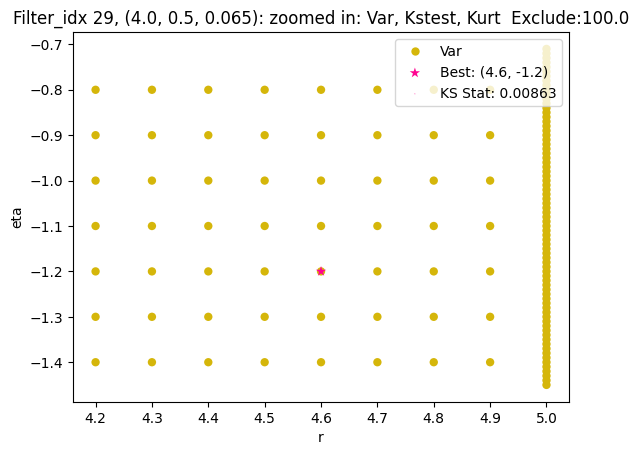

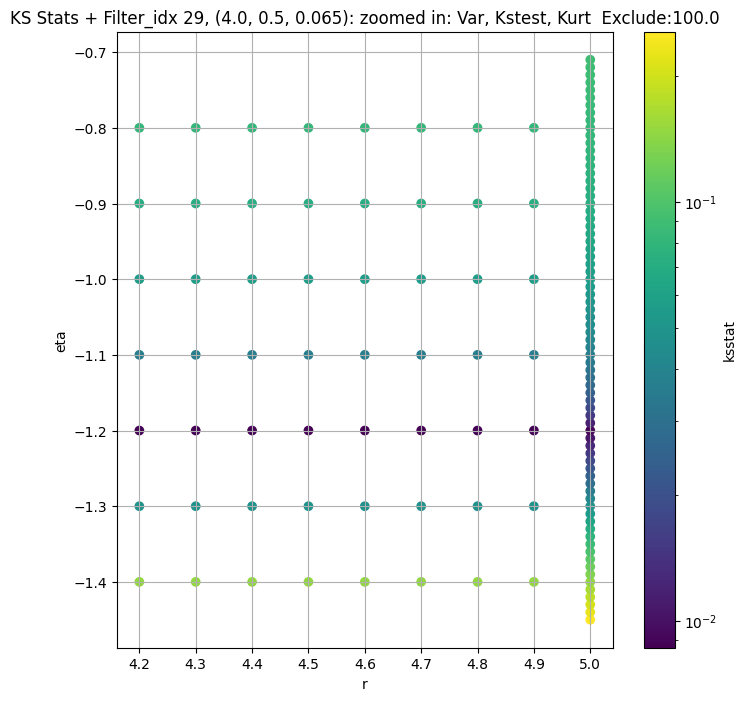

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + 100 = 300, ksstat: 0.010409065693705144, var: 14.810876846313477


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + 75 = 275, ksstat: 0.010312200279594785, var: 15.009198188781738


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + 50 = 250, ksstat: 0.0102119453550652, var: 15.218055725097656


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + 25 = 225, ksstat: 0.010108156740269714, var: 15.438895225524902


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + 0 = 200, ksstat: 0.010075144792950658, var: 15.673539161682129


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + -25 = 175, ksstat: 0.010446828584204648, var: 15.924460411071777


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + -50 = 150, ksstat: 0.011507943222549444, var: 16.194910049438477


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + -75 = 125, ksstat: 0.011655917499758472, var: 16.489521026611328


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 30, 200.0 + -100 = 100, ksstat: 0.01234347452263121, var: 16.815017700195312
Number of samples: 100000, Without approximation : 160000000.0


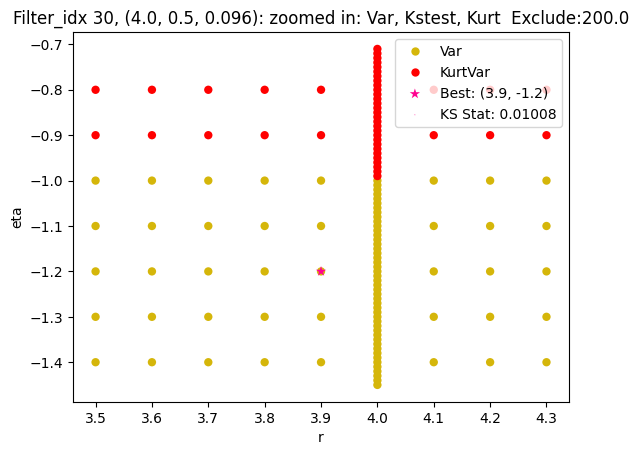

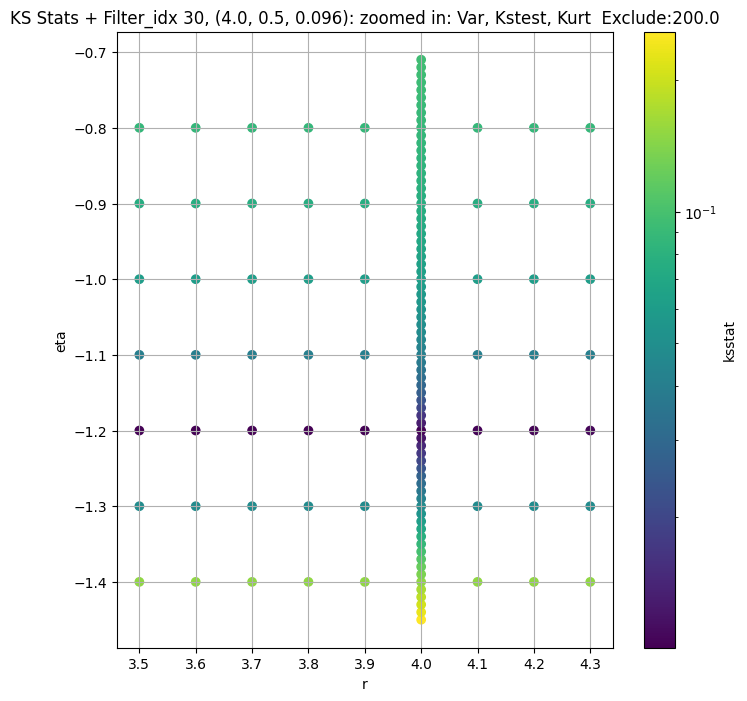

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 100 = 200, ksstat: 0.008275409233672704, var: 6.153202056884766


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 75 = 175, ksstat: 0.008120266293902667, var: 6.265367031097412


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 50 = 150, ksstat: 0.007980765098432319, var: 6.3871026039123535


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 25 = 125, ksstat: 0.00786690397687706, var: 6.52086067199707


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 0 = 100, ksstat: 0.007792868073826287, var: 6.670080184936523


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -25 = 75, ksstat: 0.007813597214980206, var: 6.840544700622559


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -50 = 50, ksstat: 0.007888181153992702, var: 7.042784690856934


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -75 = 25, ksstat: 0.0077977929273915225, var: 7.302267551422119


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -100 = 0, ksstat: 0.008068169379482848, var: 7.875181198120117
Number of samples: 100000, Without approximation : 160000000.0


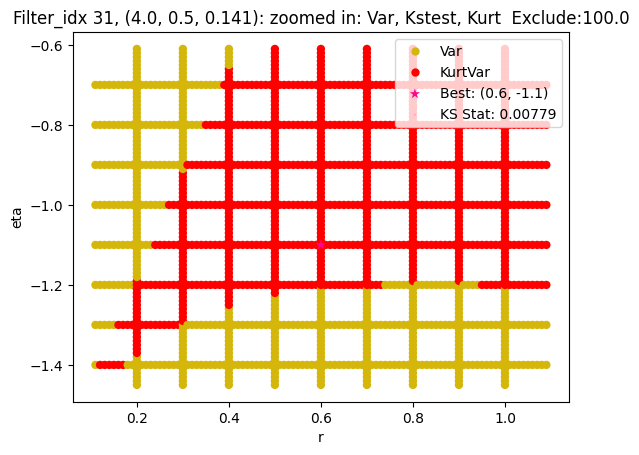

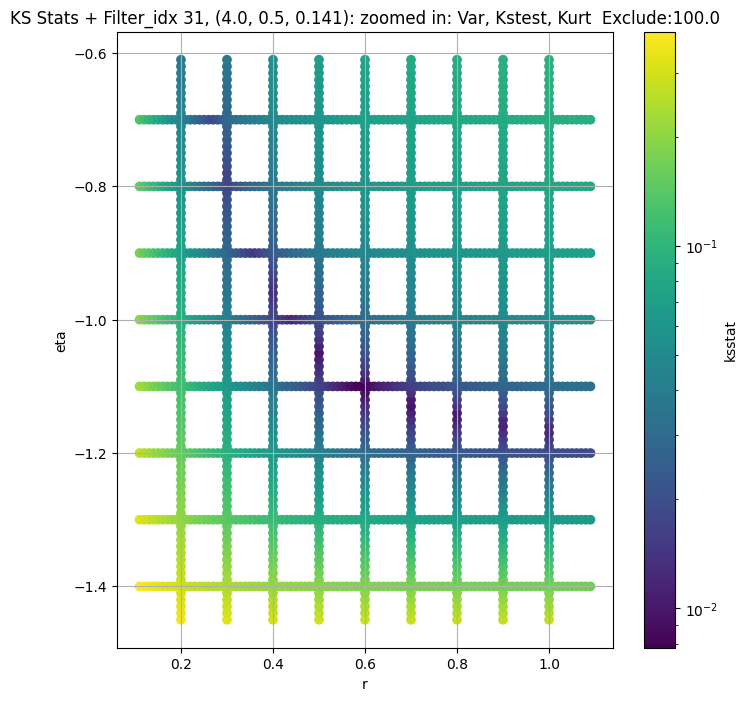

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + 100 = 300, ksstat: 0.008239537678955938, var: 2.187875270843506


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + 75 = 275, ksstat: 0.007963975278398538, var: 2.2231478691101074


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + 50 = 250, ksstat: 0.00782221293287122, var: 2.260594129562378


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + 25 = 225, ksstat: 0.007939096931311784, var: 2.3005259037017822


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + 0 = 200, ksstat: 0.008148591500233393, var: 2.3433830738067627


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + -25 = 175, ksstat: 0.008408666697226175, var: 2.3897063732147217


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + -50 = 150, ksstat: 0.00813020580857271, var: 2.4402215480804443


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + -75 = 125, ksstat: 0.0076036422448463314, var: 2.495981216430664


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 32, 200.0 + -100 = 100, ksstat: 0.007027222476387429, var: 2.558577060699463
Number of samples: 100000, Without approximation : 160000000.0


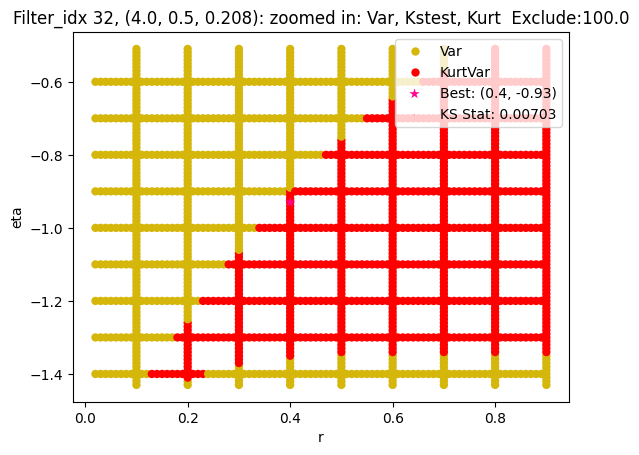

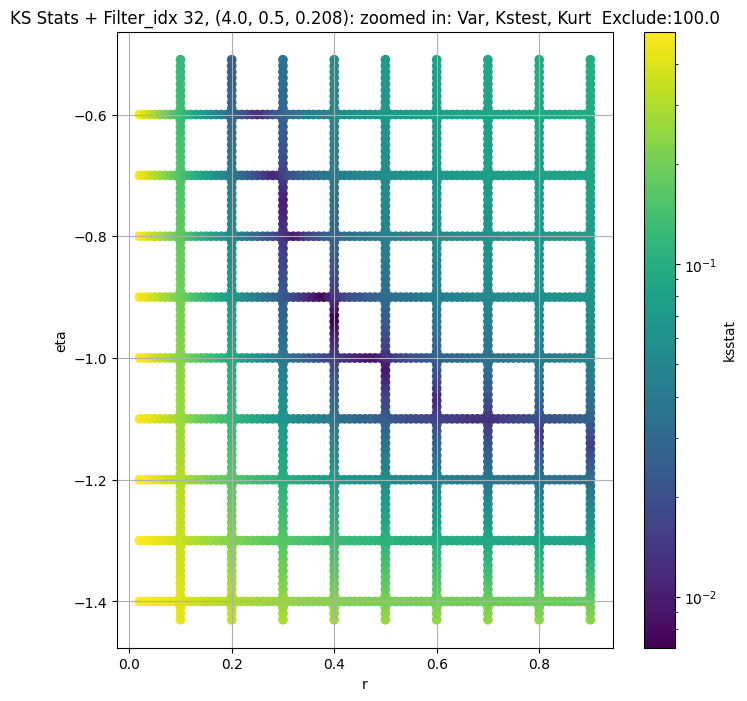

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 100 = 100, ksstat: 0.006241380232888893, var: 0.7767016291618347


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 75 = 75, ksstat: 0.005784703376954137, var: 0.8008905649185181


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 50 = 50, ksstat: 0.004365569976836681, var: 0.8304270505905151


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 25 = 25, ksstat: 0.003841216545932738, var: 0.8701092600822449


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 0 = 0, ksstat: 0.003663712162795929, var: 0.9956716895103455
Number of samples: 100000, Without approximation : 160000000.0


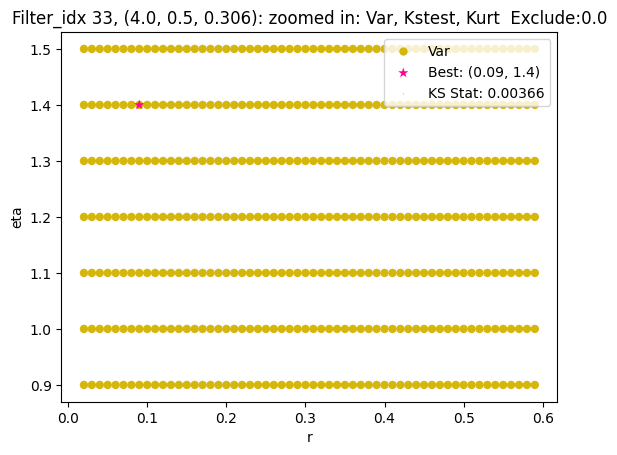

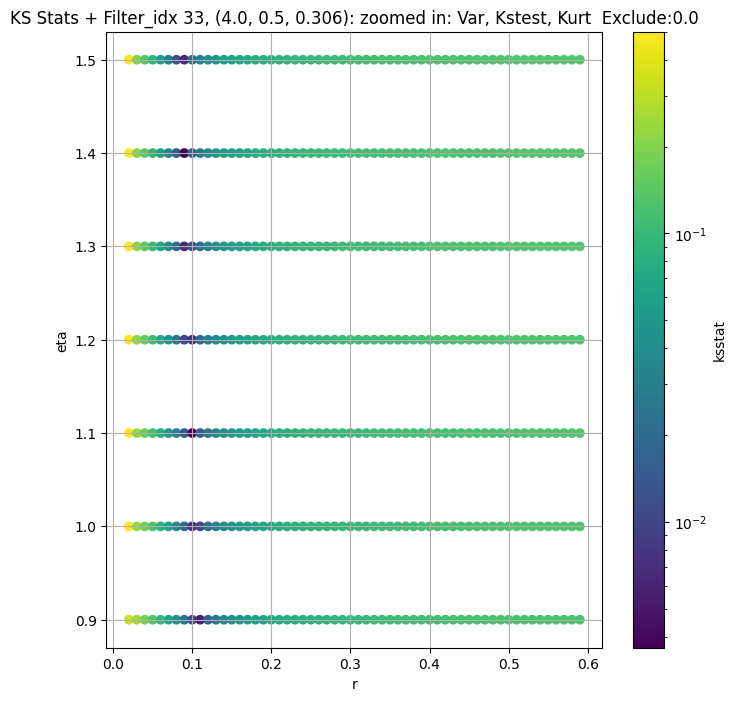

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 100 = 150, ksstat: 0.005128741728626429, var: 0.22864115238189697


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 75 = 125, ksstat: 0.004557530477883542, var: 0.23343446850776672


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 50 = 100, ksstat: 0.003997080576139567, var: 0.23887419700622559


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 25 = 75, ksstat: 0.0034585641504257802, var: 0.24523328244686127


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 0 = 50, ksstat: 0.0025083753604155934, var: 0.2530406713485718


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -25 = 25, ksstat: 0.0017194439522894012, var: 0.26370856165885925


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -50 = 0, ksstat: 0.0028642117180718712, var: 0.3091018497943878
Number of samples: 100000, Without approximation : 160000000.0


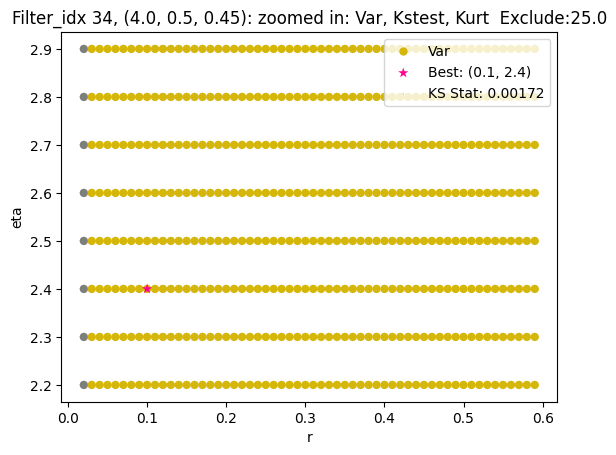

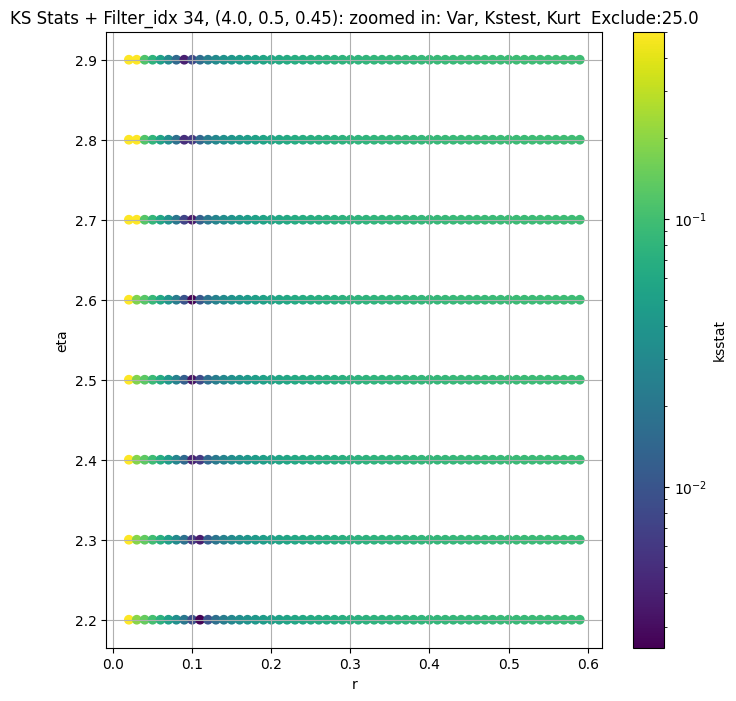

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + 100 = 150, ksstat: 0.010985218720355405, var: 87.3402328491211


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + 75 = 125, ksstat: 0.010851437393202046, var: 88.77729034423828


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + 50 = 100, ksstat: 0.010706721066014946, var: 90.36829376220703


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + 25 = 75, ksstat: 0.010546693108067107, var: 92.16815185546875


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + 0 = 50, ksstat: 0.010363263028668301, var: 94.28178405761719


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + -25 = 25, ksstat: 0.011874558553783388, var: 96.96519470214844


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 35, 50.0 + -50 = 0, ksstat: 0.015344738931050497, var: 102.45844268798828
Number of samples: 100000, Without approximation : 160000000.0


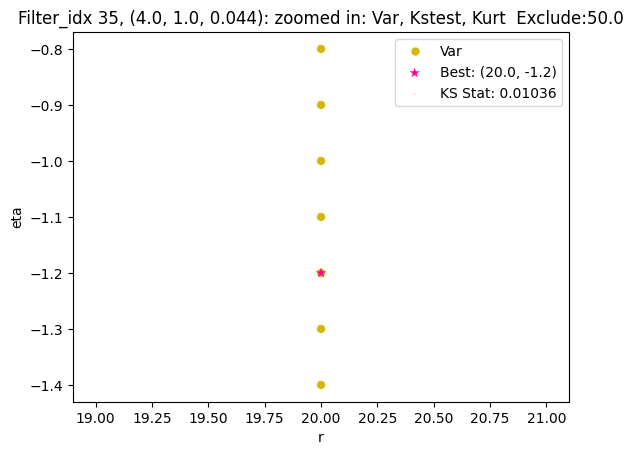

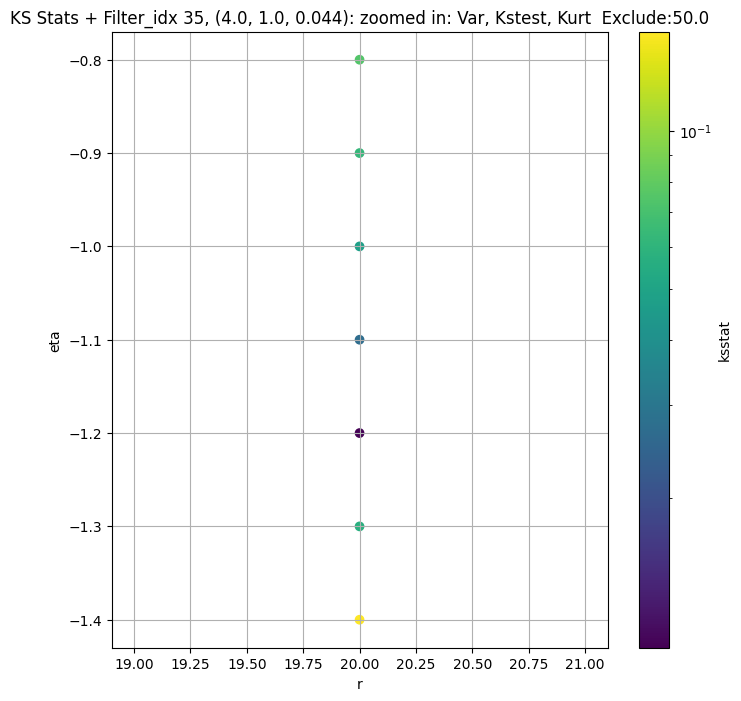

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + 100 = 150, ksstat: 0.007887839080716164, var: 40.12771224975586


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + 75 = 125, ksstat: 0.007813439493694785, var: 40.7540168762207


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + 50 = 100, ksstat: 0.0077329645410977865, var: 41.442569732666016


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + 25 = 75, ksstat: 0.008676757048608597, var: 42.21513366699219


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + 0 = 50, ksstat: 0.008873279130359735, var: 43.11293411254883


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + -25 = 25, ksstat: 0.010094338273367698, var: 44.23461151123047


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 36, 50.0 + -50 = 0, ksstat: 0.011892759770799316, var: 46.47148132324219
Number of samples: 100000, Without approximation : 160000000.0


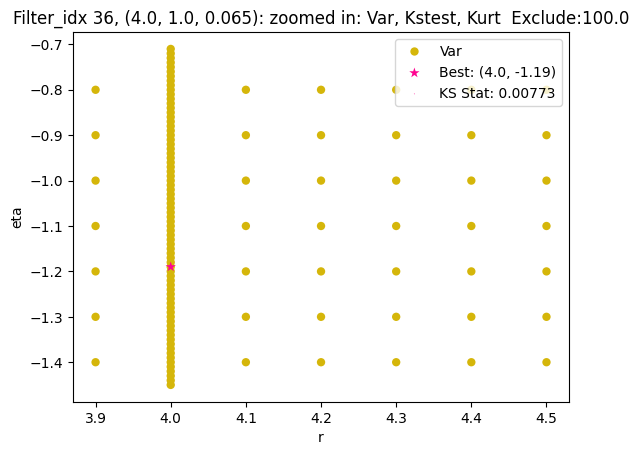

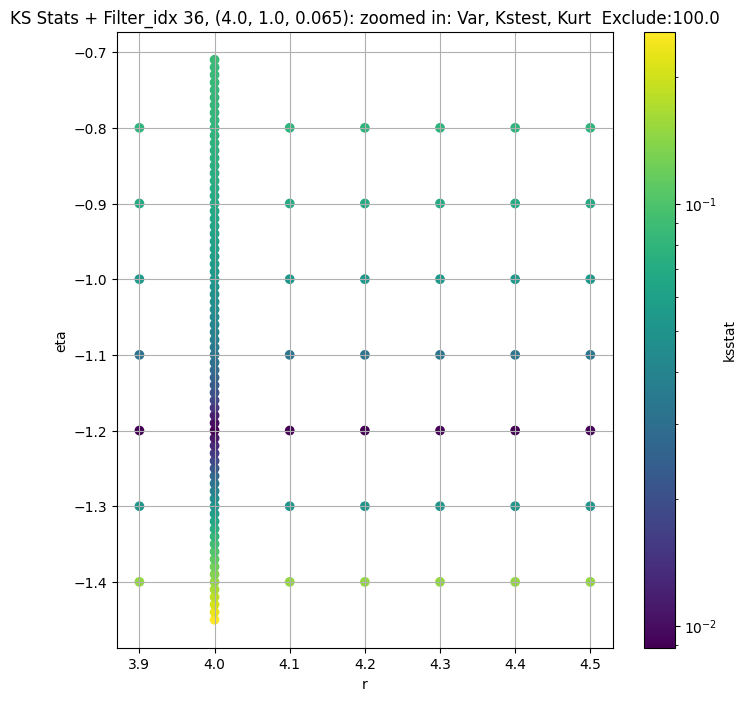

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 100 = 300, ksstat: 0.010213122675703346, var: 15.109204292297363


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 75 = 275, ksstat: 0.010115067608232386, var: 15.318658828735352


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 50 = 250, ksstat: 0.010013461083480169, var: 15.53963851928711


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 25 = 225, ksstat: 0.01001717288839643, var: 15.773821830749512


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 0 = 200, ksstat: 0.010032890075782952, var: 16.023353576660156


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -25 = 175, ksstat: 0.01007871515310621, var: 16.29107666015625


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -50 = 150, ksstat: 0.010051174812566788, var: 16.580810546875


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -75 = 125, ksstat: 0.010039116895533273, var: 16.898271560668945


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -100 = 100, ksstat: 0.010477460232447833, var: 17.25151252746582
Number of samples: 100000, Without approximation : 160000000.0


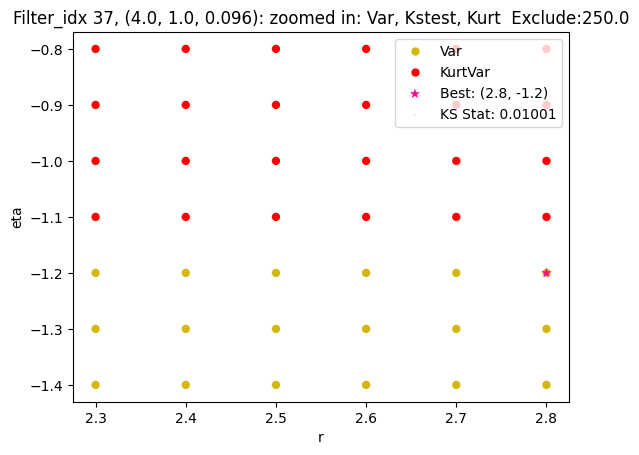

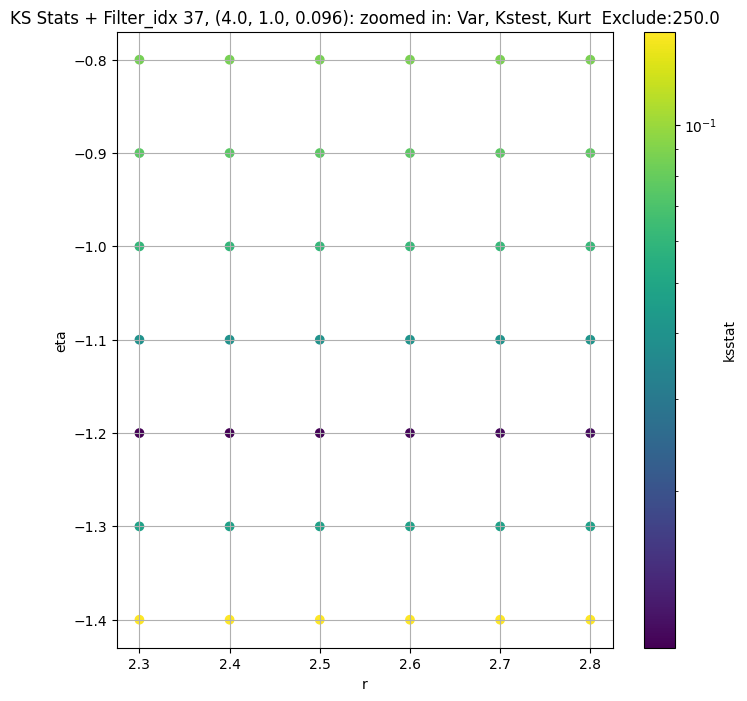

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 0.0 + 100 = 100, ksstat: 0.0075830056638276355, var: 7.802015781402588


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 0.0 + 75 = 75, ksstat: 0.007244532545316207, var: 8.001936912536621


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 0.0 + 50 = 50, ksstat: 0.007262328128401441, var: 8.241086959838867


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 0.0 + 25 = 25, ksstat: 0.007510664235257591, var: 8.553098678588867


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 0.0 + 0 = 0, ksstat: 0.00741601232545952, var: 9.355117797851562
Number of samples: 100000, Without approximation : 160000000.0


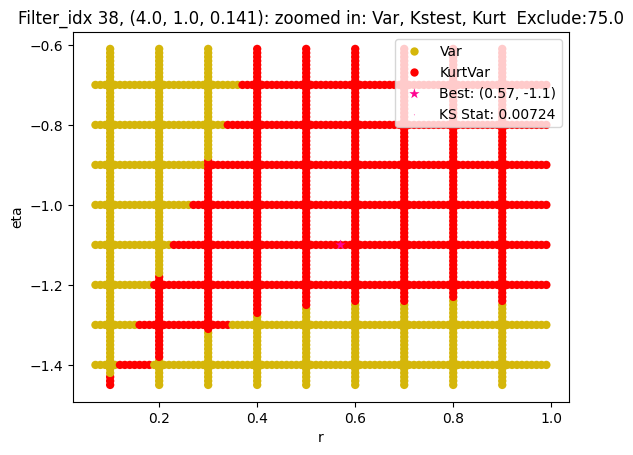

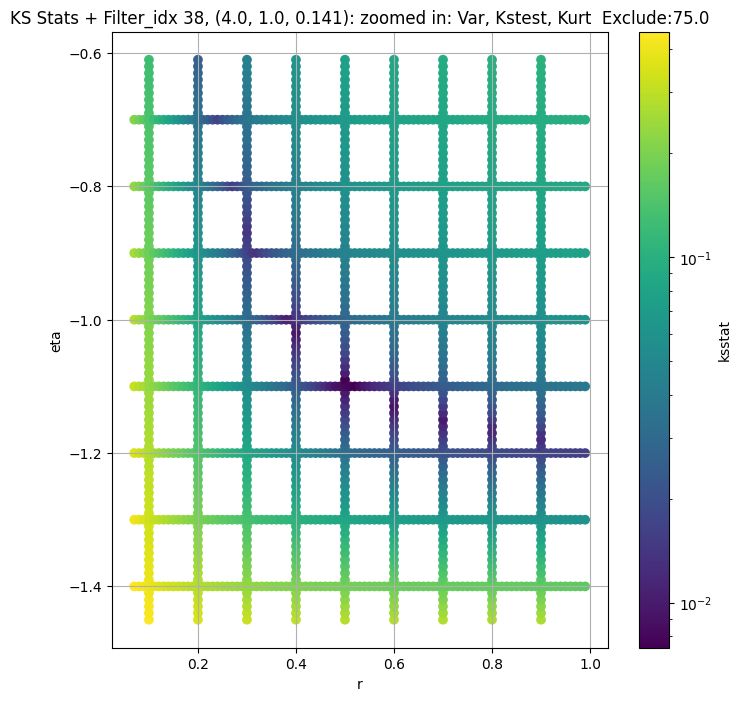

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 100 = 100, ksstat: 0.007840221096925337, var: 2.836303949356079


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 75 = 75, ksstat: 0.007658595698862847, var: 2.9208643436431885


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 50 = 50, ksstat: 0.007522513815747145, var: 3.0229134559631348


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 25 = 25, ksstat: 0.007220244484081095, var: 3.1574766635894775


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 0 = 0, ksstat: 0.006892917991310199, var: 3.5068788528442383
Number of samples: 100000, Without approximation : 160000000.0


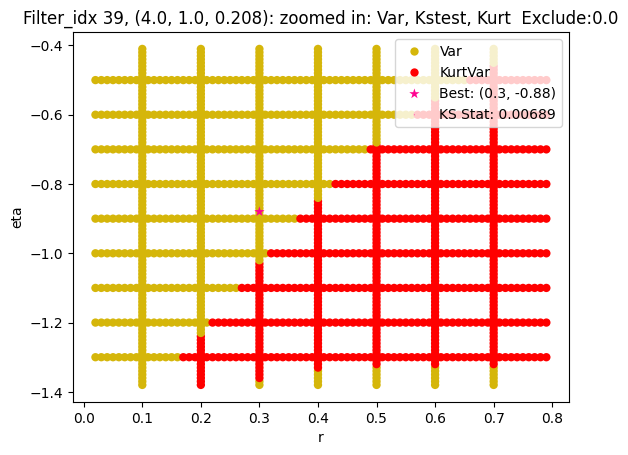

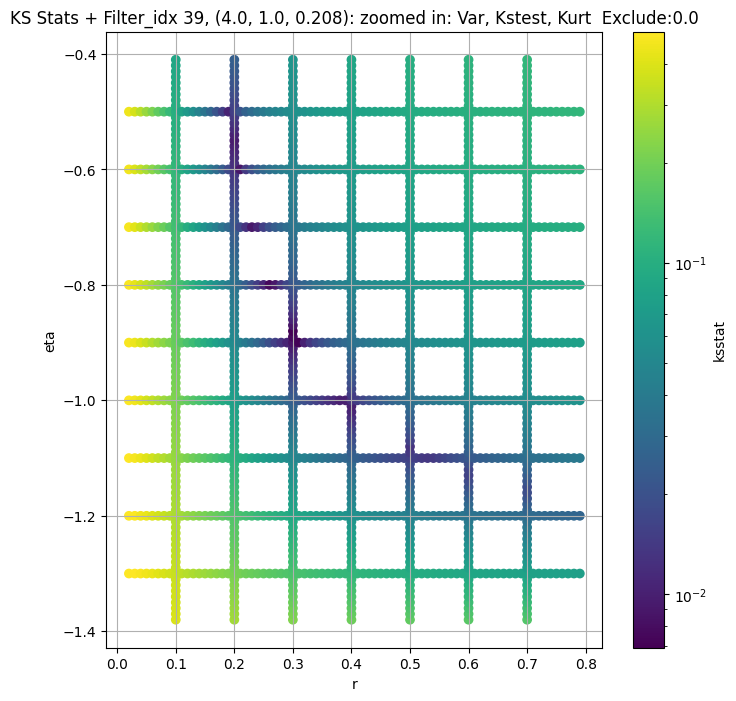

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 0.0 + 100 = 100, ksstat: 0.006581320314156591, var: 0.8775559067726135


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 0.0 + 75 = 75, ksstat: 0.00559812520947367, var: 0.905760645866394


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 0.0 + 50 = 50, ksstat: 0.0048317207122846595, var: 0.9403584599494934


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 0.0 + 25 = 25, ksstat: 0.0042894504495940705, var: 0.9871774911880493


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 0.0 + 0 = 0, ksstat: 0.0028450867487886944, var: 1.1221638917922974
Number of samples: 100000, Without approximation : 160000000.0


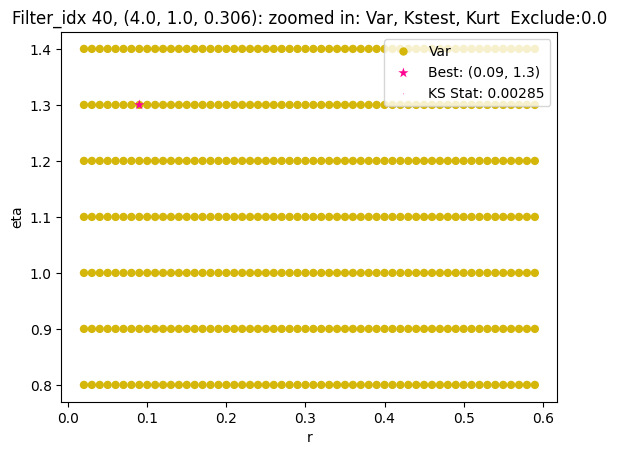

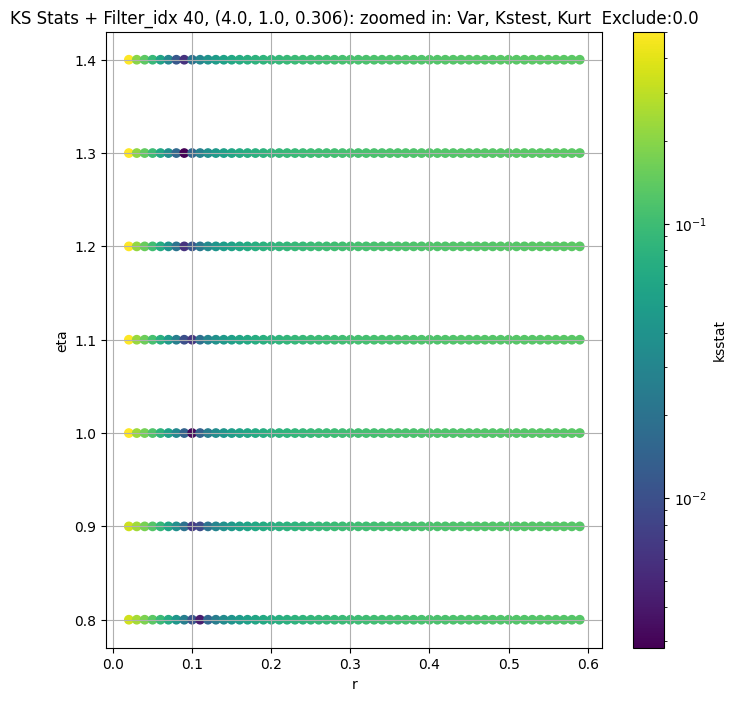

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + 100 = 150, ksstat: 0.004763729315558907, var: 0.23423415422439575


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + 75 = 125, ksstat: 0.004127809033956618, var: 0.23950357735157013


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + 50 = 100, ksstat: 0.0034795168263084472, var: 0.24550476670265198


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + 25 = 75, ksstat: 0.0027332148254266553, var: 0.2525378465652466


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + 0 = 50, ksstat: 0.0021725158295585745, var: 0.26120537519454956


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + -25 = 25, ksstat: 0.00131784208414909, var: 0.27304479479789734


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 50.0 + -50 = 0, ksstat: 0.003333042742137346, var: 0.3166523873806
Number of samples: 100000, Without approximation : 160000000.0


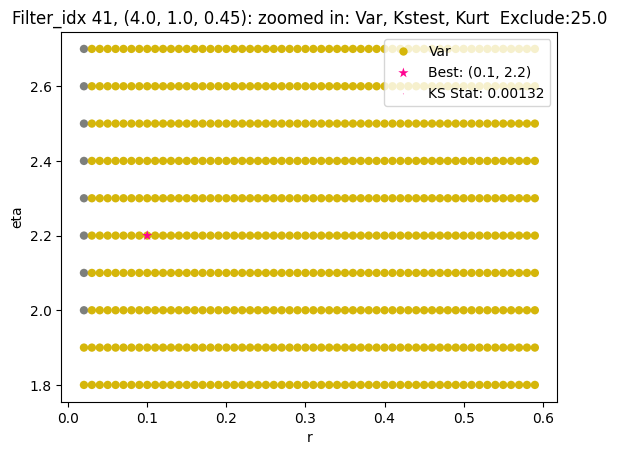

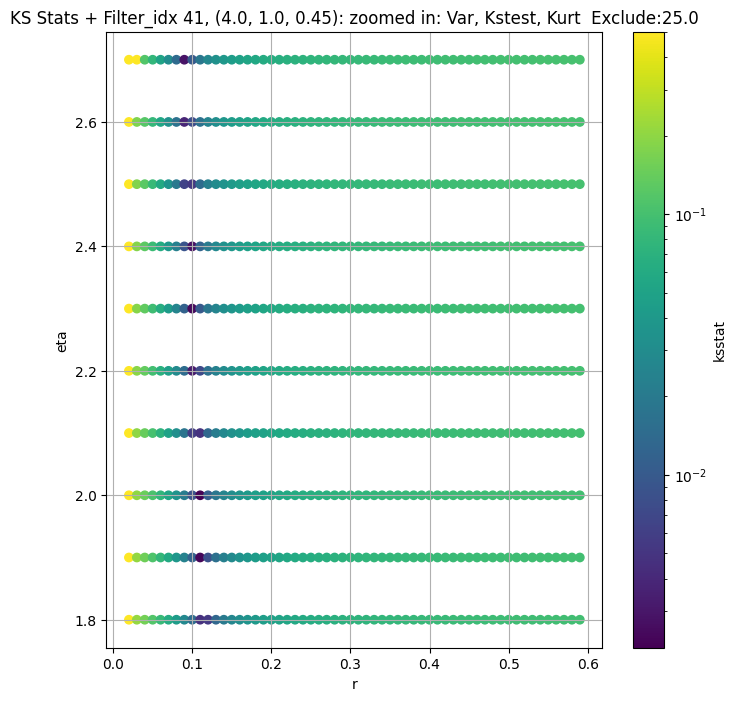

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",104.751920,79.171340,144.730820,9.756392,3.355390,53.305700,160000000.0,"(2.0, 0.5, 0.044)",0.009914,...,2.736249e+02,100.0,104.751923,0.000107,0.006463,1.60,-1.14,3.816282e+02,0.0,43944
1,"(2.0, 0.5, 0.065)",44.688686,33.397083,65.193830,15.381451,3.886639,124.987910,160000000.0,"(2.0, 0.5, 0.065)",0.008890,...,1.883744e+02,50.0,39.563732,0.000107,0.007670,8.00,-1.19,1.762705e+02,100.0,32958
2,"(2.0, 0.5, 0.096)",19.629204,14.301214,29.159916,20.022379,4.770294,139.852800,160000000.0,"(2.0, 0.5, 0.096)",0.009700,...,7.053810e+01,200.0,15.865404,0.000107,0.009700,20.00,-1.20,7.053810e+01,200.0,19531
3,"(2.0, 0.5, 0.141)",7.416366,5.222577,13.065188,27.643420,5.379395,179.515410,160000000.0,"(2.0, 0.5, 0.141)",0.008278,...,7.573987e+00,50.0,6.476105,0.000107,0.007361,0.63,-1.10,8.211365e+00,75.0,32958
4,"(2.0, 0.5, 0.208)",3.177796,2.139311,6.415463,37.375984,6.484847,279.421500,160000000.0,"(2.0, 0.5, 0.208)",0.007929,...,1.405376e+00,50.0,2.921118,0.000107,0.005765,0.38,-0.90,3.310580e-01,25.0,58593
5,"(2.0, 0.5, 0.306)",0.918258,0.597128,2.031347,53.133640,5.832935,328.755520,160000000.0,"(2.0, 0.5, 0.306)",0.004472,...,7.264586e-16,0.0,0.918258,0.000107,0.003618,0.11,1.00,1.006558e-13,0.0,148314
6,"(2.0, 0.5, 0.45)",0.581501,0.391970,1.477699,61.547700,5.796725,374.792420,160000000.0,"(2.0, 0.5, 0.45)",0.002824,...,1.890452e-16,0.0,0.581501,0.000107,0.002824,0.10,1.60,1.890452e-16,0.0,234375
7,"(2.0, 1.0, 0.044)",135.913770,104.683360,182.711210,10.395148,3.562033,62.887478,160000000.0,"(2.0, 1.0, 0.044)",0.010594,...,3.323723e+02,100.0,135.913773,0.000107,0.007052,1.40,-1.14,4.701752e+02,0.0,39062
8,"(2.0, 1.0, 0.065)",58.516690,43.111374,92.271360,16.282785,3.872179,119.732285,160000000.0,"(2.0, 1.0, 0.065)",0.009730,...,2.389580e+02,50.0,53.746346,0.000107,0.009730,20.00,-1.20,2.389580e+02,50.0,19531


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

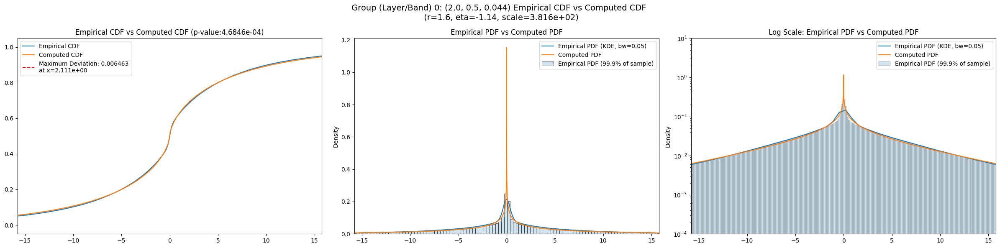

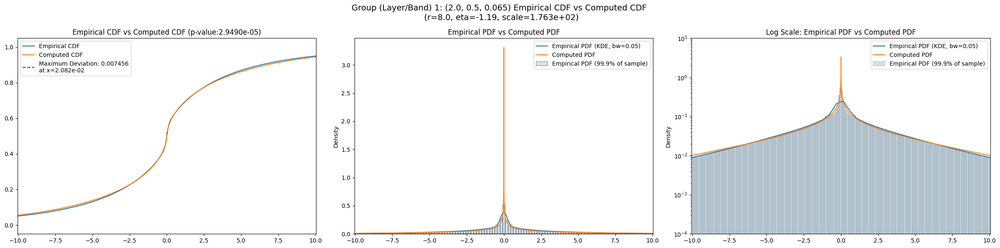

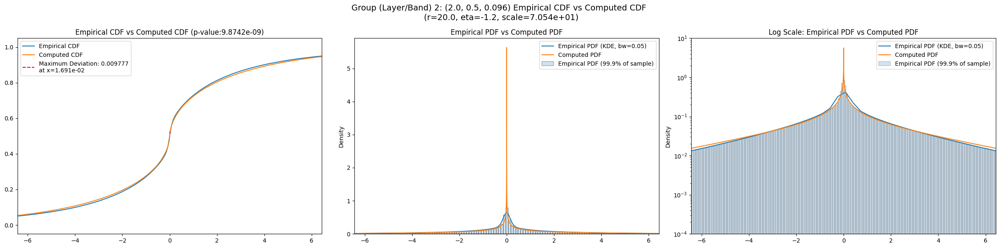

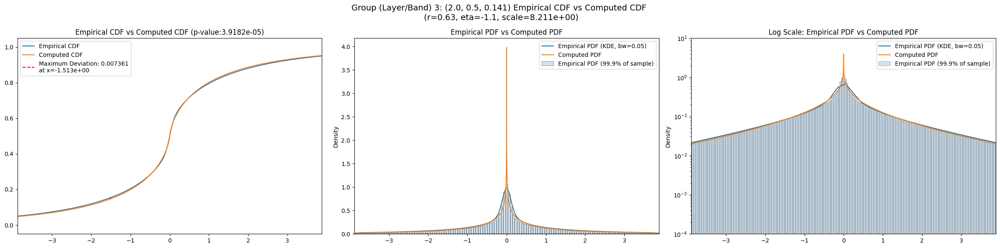

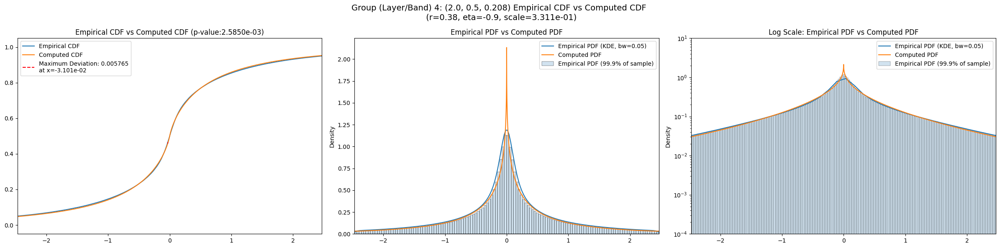

...

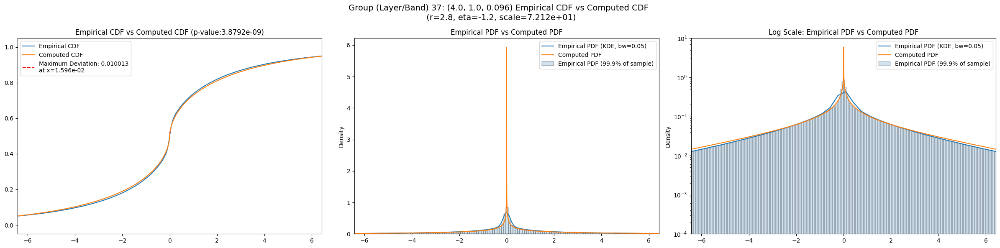

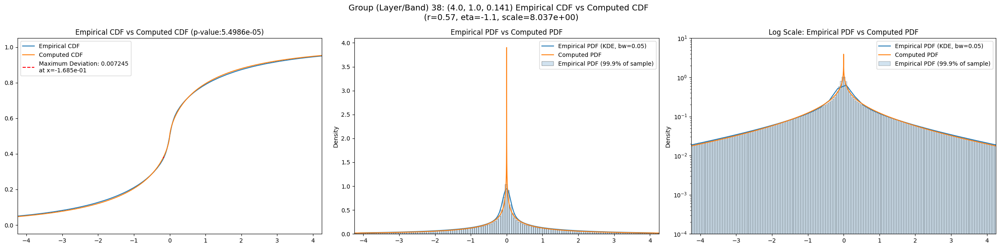

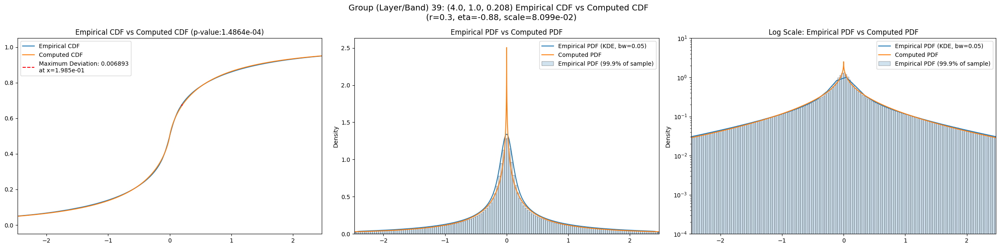

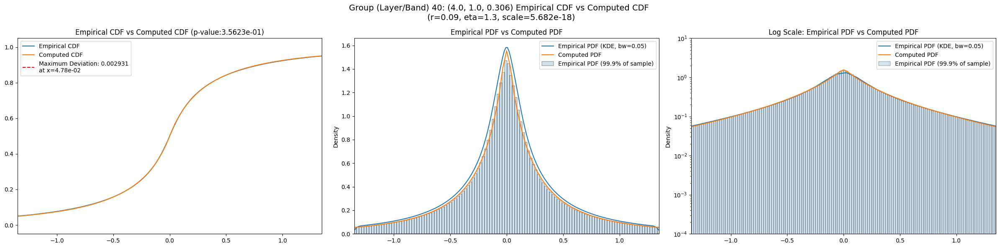

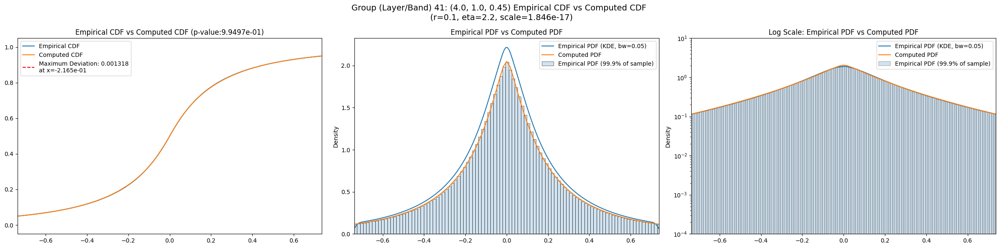

In [15]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [16]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [17]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",104.751920,79.171340,144.730820,9.756392,3.355390,53.305700,160000000.0,"(2.0, 0.5, 0.044)",0.009914,...,5.899430,0.058804,0.0,4.803250,0.039618,0.0,3.916760,0.043956,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",44.688686,33.397083,65.193830,15.381451,3.886639,124.987910,160000000.0,"(2.0, 0.5, 0.065)",0.008890,...,3.497880,0.065721,0.0,2.845260,0.046538,0.0,2.304120,0.050640,0.0,0.000000e+00
2,"(2.0, 0.5, 0.096)",19.629204,14.301214,29.159916,20.022379,4.770294,139.852800,160000000.0,"(2.0, 0.5, 0.096)",0.009700,...,2.087510,0.071769,0.0,1.714980,0.051012,0.0,1.373620,0.054892,0.0,0.000000e+00
3,"(2.0, 0.5, 0.141)",7.416366,5.222577,13.065188,27.643420,5.379395,179.515410,160000000.0,"(2.0, 0.5, 0.141)",0.008278,...,1.219650,0.073816,0.0,1.027860,0.049955,0.0,0.815942,0.053272,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",3.177796,2.139311,6.415463,37.375984,6.484847,279.421500,160000000.0,"(2.0, 0.5, 0.208)",0.007929,...,0.805336,0.068191,0.0,0.697522,0.041527,0.0,0.553128,0.043403,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.918258,0.597128,2.031347,53.133640,5.832935,328.755520,160000000.0,"(2.0, 0.5, 0.306)",0.004472,...,0.474986,0.055408,0.0,0.417603,0.028034,0.0,0.332651,0.027633,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.581501,0.391970,1.477699,61.547700,5.796725,374.792420,160000000.0,"(2.0, 0.5, 0.45)",0.002824,...,0.404507,0.051119,0.0,0.355716,0.023712,0.0,0.284080,0.023358,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",135.913770,104.683360,182.711210,10.395148,3.562033,62.887478,160000000.0,"(2.0, 1.0, 0.044)",0.010594,...,6.639070,0.059981,0.0,5.403740,0.040770,0.0,4.393390,0.044912,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",58.516690,43.111374,92.271360,16.282785,3.872179,119.732285,160000000.0,"(2.0, 1.0, 0.065)",0.009730,...,4.112930,0.062273,0.0,3.339540,0.043207,0.0,2.706250,0.047286,0.0,0.000000e+00


## Results

In [18]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [19]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.009914,0.000107,0.006463,0.058804,0.039618,0.043956
1,0.008890,0.000107,0.007670,0.065721,0.046538,0.050640
2,0.009700,0.000107,0.009700,0.071769,0.051012,0.054892
3,0.008278,0.000107,0.007361,0.073816,0.049955,0.053272
4,0.007929,0.000107,0.005765,0.068191,0.041527,0.043403
5,0.004472,0.000107,0.003618,0.055408,0.028034,0.027633
6,0.002824,0.000107,0.002824,0.051119,0.023712,0.023358
7,0.010594,0.000107,0.007052,0.059981,0.040770,0.044912
8,0.009730,0.000107,0.009730,0.062273,0.043207,0.047286


In [20]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,104.751923,0.006463,1.60,-1.14,3.816282e+02,0.0
1,39.563732,0.007670,8.00,-1.19,1.762705e+02,100.0
2,15.865404,0.009700,20.00,-1.20,7.053810e+01,200.0
3,6.476105,0.007361,0.63,-1.10,8.211365e+00,75.0
4,2.921118,0.005765,0.38,-0.90,3.310580e-01,25.0
5,0.918258,0.003618,0.11,1.00,1.006558e-13,0.0
6,0.581501,0.002824,0.10,1.60,1.890452e-16,0.0
7,135.913773,0.007052,1.40,-1.14,4.701752e+02,0.0
8,53.746346,0.009730,20.00,-1.20,2.389580e+02,50.0
